## 1. Setup and Data Exploration

First, let's import the necessary Python libraries and define the path to our geodatabase file. A geodatabase (`.gdb`) is a collection of geographic datasets. Before we load anything, let's see what layers are available inside it.

In [188]:
print("".join([
    "## 5. Final Result\n",
    "\n",
    "Let's display the final DataFrame. This table is now ready for analysis, visualization, or for use in a machine learning model. Each row represents a county in North Carolina, with its aggregated soil properties."
   ]))

## 5. Final Result

Let's display the final DataFrame. This table is now ready for analysis, visualization, or for use in a machine learning model. Each row represents a county in North Carolina, with its aggregated soil properties.


In [189]:
import os
import pandas as pd
import numpy as np
home = '/Discs/E/D/Documents/Documents/Personal Projects/PSIHack/PSI Hackathon'

In [190]:
geofeatures = pd.read_csv(os.path.join(home,'final_dataset/Value1_Features.csv'))

In [191]:
totalfeatures = pd.read_csv(os.path.join(home,'final_dataset/Corn.csv'))

In [192]:
def_delete = ['avg_musumcpcts','avg_musumcpct']
depths = ['avg_tk0_5s', 'avg_tk5_20s', 'avg_tk20_50s', 'avg_tk50_100s', 'avg_tk100_150s', 'avg_tk150_999s', 
        'avg_tk0_20s', 'avg_tk0_30s', 'avg_tk0_100s', 'avg_tk0_150s', 'avg_tk0_999s','avg_tk0_5a', 'avg_tk5_20a', 
        'avg_tk20_50a', 'avg_tk50_100a', 'avg_tk100_150a', 'avg_tk150_999a', 'avg_tk0_20a', 'avg_tk0_30a', 
        'avg_tk0_100a', 'avg_tk0_150a', 'avg_tk0_999a']
maybe_delete = ['avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 'avg_aws50_100', 'avg_aws100_150', 'avg_aws150_999',
            'avg_aws0_20', 'avg_aws0_30', 'avg_aws0_100', 'avg_aws0_150', 'avg_aws0_999',
            'avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999', 'avg_soc0_20', 
             'avg_soc0_30', 'avg_soc0_100', 'avg_soc0_150', 'avg_soc0_999']

totalfeatures.drop(columns=def_delete, inplace=True)
totalfeatures.drop(columns=depths, inplace=True)
# totalfeatures.drop(columns=maybe_delete, inplace=True)


In [193]:
str(totalfeatures)

'      Unnamed: 0  Year        COUNTY Commodity   Yield  DewDep_C_R1  \\\n0              0  2022      Beaufort      CORN  8064.0     5.318182   \n1              1  2022        Craven      CORN  6501.6     5.323232   \n2              2  2022        Greene      CORN  5555.2     5.858586   \n3              3  2022          Hyde      CORN  8797.6     4.045455   \n4              4  2022      Johnston      CORN  5448.8     5.464646   \n...          ...   ...           ...       ...     ...          ...   \n3322        3322  1983          Polk      CORN  3920.0     5.474747   \n3323        3323  1983    Rutherford      CORN  2632.0     5.767677   \n3324        3324  1983         Swain      CORN  3472.0     4.510101   \n3325        3325  1983  Transylvania      CORN  4368.0     3.126263   \n3326        3326  1983        Yancey      CORN  3696.0     3.590909   \n\n      DewDep_C_R2  DewDep_C_R3  DewDep_C_R4  DewDep_C_R5  ...  avg_nccpi3corn  \\\n0        4.583333     6.977778     6.529630     4

In [194]:
geofeatures.columns

Index(['COUNTY', 'avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 'avg_aws50_100',
       'avg_aws100_150', 'avg_aws150_999', 'avg_aws0_20', 'avg_aws0_30',
       'avg_aws0_100', 'avg_aws0_150', 'avg_aws0_999', 'avg_tk0_5a',
       'avg_tk5_20a', 'avg_tk20_50a', 'avg_tk50_100a', 'avg_tk100_150a',
       'avg_tk150_999a', 'avg_tk0_20a', 'avg_tk0_30a', 'avg_tk0_100a',
       'avg_tk0_150a', 'avg_tk0_999a', 'avg_musumcpcta', 'avg_soc0_5',
       'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150',
       'avg_soc150_999', 'avg_soc0_20', 'avg_soc0_30', 'avg_soc0_100',
       'avg_soc0_150', 'avg_soc0_999', 'avg_tk0_5s', 'avg_tk5_20s',
       'avg_tk20_50s', 'avg_tk50_100s', 'avg_tk100_150s', 'avg_tk150_999s',
       'avg_tk0_20s', 'avg_tk0_30s', 'avg_tk0_100s', 'avg_tk0_150s',
       'avg_tk0_999s', 'avg_musumcpcts', 'avg_nccpi3corn', 'avg_nccpi3soy',
       'avg_nccpi3cot', 'avg_nccpi3sg', 'avg_nccpi3all', 'avg_pctearthmc',
       'avg_rootznemc', 'avg_rootznaws', 'avg_droughty',

In [195]:
# Import the fiona library, which is useful for reading and writing geospatial data files
import fiona

# Define the path to your geodatabase folder
gdb_path = 'gSSURGO_NC/gSSURGO_NC.gdb'

# Use fiona to list the layers
try:
    layers = fiona.listlayers(gdb_path)
    print("Layers found in the Geodatabase:")
    print(layers)
except Exception as e:
    print(f"Error accessing the geodatabase: {e}")

Layers found in the Geodatabase:
['chaashto', 'chconsistence', 'chdesgnsuffix', 'chfrags', 'chorizon', 'chpores', 'chstruct', 'chstructgrp', 'chtext', 'chtexture', 'chtexturegrp', 'chtexturemod', 'chunified', 'cocanopycover', 'cocropyld', 'codiagfeatures', 'coecoclass', 'coeplants', 'coerosionacc', 'coforprod', 'coforprodo', 'cogeomordesc', 'cohydriccriteria', 'comonth', 'component', 'copm', 'copmgrp', 'copwindbreak', 'corestrictions', 'cosoilmoist', 'cosoiltemp', 'cosurffrags', 'cosurfmorphgc', 'cosurfmorphhpp', 'cosurfmorphmr', 'cosurfmorphss', 'cotaxfmmin', 'cotaxmoistcl', 'cotext', 'cotreestomng', 'cotxfmother', 'distinterpmd', 'distlegendmd', 'distmd', 'featdesc', 'laoverlap', 'legend', 'legendtext', 'mapunit', 'month', 'muaggatt', 'muaoverlap', 'mucropyld', 'mutext', 'sacatalog', 'sdvalgorithm', 'sdvattribute', 'sdvfolder', 'sdvfolderattribute', 'mdstatdomdet', 'mdstatdommas', 'mdstatidxdet', 'mdstatidxmas', 'mdstatrshipdet', 'mdstatrshipmas', 'mdstattabcols', 'mdstattabs', 'coin

The list above shows all the tables and feature classes available. We're interested in two specific layers for this project:
* `Valu1`: A table containing aggregated soil attribute data.
* `MUPOLYGON`: A feature class containing the spatial polygons for each map unit.

In [196]:
import geopandas as gpd

# Load the 'Valu1' table by name
try:
    soil_attributes_df = gpd.read_file(gdb_path, layer='Valu1')
    
    print("\nSuccessfully loaded the 'Valu1' table into a DataFrame.")
    print("First 5 rows:")
    print(soil_attributes_df.head())

    # See all available soil features
    print("\nAvailable columns (soil features):")
    print(soil_attributes_df.columns)
except Exception as e:
    print(f"\nCould not load 'Valu1' table: {e}")


Successfully loaded the 'Valu1' table into a DataFrame.
First 5 rows:
   aws0_5    aws5_20   aws20_50  aws50_100  aws100_150  aws150_999    aws0_20  \
0    7.96  23.879999  47.770000  79.550003   78.599998   82.410004  31.840000   
1    8.55  25.650000  51.299999  85.500000   85.500000  135.089996  34.200001   
2    8.51  25.530001  51.060001  84.349998   83.699997  131.300003  34.040001   
3    5.95  17.850000  35.700001  55.740002   52.500000   67.889999  23.799999   
4    8.52  25.580000  51.259998  85.500000   85.500000  180.089996  34.099998   

     aws0_30    aws0_100    aws0_150  ...  nccpi3cot  nccpi3sg  nccpi3all  \
0  47.790001  159.160004  237.759995  ...      0.830     0.557      0.830   
1  51.299999  171.000000  256.500000  ...      0.867     0.561      0.867   
2  51.060001  169.449997  253.149994  ...      0.864     0.560      0.864   
3  35.700001  115.239998  167.740005  ...      0.530     0.319      0.541   
4  51.160000  170.860001  256.359985  ...      0.825     

In [197]:
soil_attributes_df

,aws0_5,aws5_20,aws20_50,aws50_100,aws100_150,aws150_999,aws0_20,aws0_30,aws0_100,aws0_150,...,nccpi3cot,nccpi3sg,nccpi3all,pctearthmc,rootznemc,rootznaws,droughty,pwsl1pomu,musumcpct,mukey
0,7.96,23.879999,47.770000,79.550003,78.599998,82.410004,31.840000,47.790001,159.160004,237.759995,...,0.830,0.557,0.830,91,150.0,240.0,0.0,9.0,100,1015480
1,8.55,25.650000,51.299999,85.500000,85.500000,135.089996,34.200001,51.299999,171.000000,256.500000,...,0.867,0.561,0.867,95,150.0,270.0,0.0,NaN,95,1015481
2,8.51,25.530001,51.060001,84.349998,83.699997,131.300003,34.040001,51.060001,169.449997,253.149994,...,0.864,0.560,0.864,90,150.0,270.0,0.0,5.0,95,1015482
3,5.95,17.850000,35.700001,55.740002,52.500000,67.889999,23.799999,35.700001,115.239998,167.740005,...,0.530,0.319,0.541,90,150.0,186.0,0.0,90.0,90,1015483
4,8.52,25.580000,51.259998,85.500000,85.500000,180.089996,34.099998,51.160000,170.860001,256.359985,...,0.825,0.594,0.825,90,150.0,270.0,0.0,5.0,95,1015486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6253,7.65,22.950001,45.900002,76.500000,76.500000,81.089996,30.600000,45.900002,153.000000,229.500000,...,0.816,0.514,0.816,85,150.0,270.0,0.0,NaN,85,811451
6254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,NaN,NaN,NaN,999.0,100,817733
6255,7.65,22.950001,48.150002,81.000000,81.000000,85.860001,30.600000,46.349998,159.750000,240.750000,...,0.787,0.468,0.787,90,150.0,268.0,0.0,90.0,90,818348
6256,8.53,25.580000,51.189999,85.500000,85.500000,87.389999,34.099998,51.150002,170.789993,256.279999,...,0.810,0.580,0.810,90,150.0,270.0,0.0,5.0,95,818349


✅ Step 1 Complete: North Carolina county map is loaded into 'nc_counties_gdf'.


<Axes: >

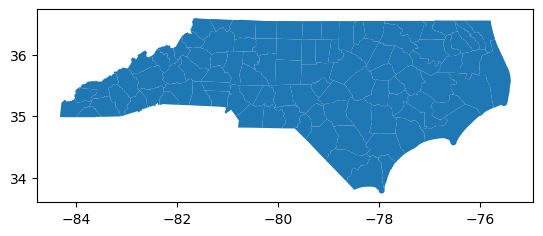

In [198]:
import geopandas as gpd

# Load the national county shapefile you downloaded
# The path should point to the .shp file inside the tl_rd22_us_county folder
all_counties_gdf = gpd.read_file("tl_rd22_us_county/tl_rd22_us_county.shp")

# The rest of the code for filtering and cleaning will be exactly the same
nc_counties_gdf = all_counties_gdf[all_counties_gdf['STATEFP'] == '37'].copy()

# Clean up the DataFrame for merging
nc_counties_gdf.rename(columns={'NAME': 'COUNTY'}, inplace=True)
nc_counties_gdf = nc_counties_gdf[['COUNTY', 'geometry']]

print("✅ Step 1 Complete: North Carolina county map is loaded into 'nc_counties_gdf'.")
nc_counties_gdf.plot()

In [199]:
# Load the soil map polygons
soil_map_gdf = gpd.read_file(gdb_path, layer='MUPOLYGON')

print("✅ Step 2 Complete: Soil map polygons are loaded into 'soil_map_gdf'.")

✅ Step 2 Complete: Soil map polygons are loaded into 'soil_map_gdf'.


## 3. Data Merging and Processing

With all our data loaded, the next step is to combine it into a single, comprehensive GeoDataFrame. To join the soil polygons (`soil_map_gdf`) with the soil attributes (`soil_attributes_df`), they need a common column. The key is `MUKEY`, but the column names and data types might differ. Let's inspect the columns and then standardize them.

In [200]:
# Inspect columns of the map DataFrame
print("Columns in soil_map_gdf (from MUPOLYGON):")
print(soil_map_gdf.columns)

print("\n-----------------------------------\n")

# Inspect columns of the attributes DataFrame
print("Columns in soil_attributes_df (from Valu1):")
print(soil_attributes_df.columns)

# You can choose which columns you want to use later on

Columns in soil_map_gdf (from MUPOLYGON):
Index(['AREASYMBOL', 'SPATIALVER', 'MUSYM', 'MUKEY', 'Shape_Length',
       'Shape_Area', 'geometry'],
      dtype='object')

-----------------------------------

Columns in soil_attributes_df (from Valu1):
Index(['aws0_5', 'aws5_20', 'aws20_50', 'aws50_100', 'aws100_150',
       'aws150_999', 'aws0_20', 'aws0_30', 'aws0_100', 'aws0_150', 'aws0_999',
       'tk0_5a', 'tk5_20a', 'tk20_50a', 'tk50_100a', 'tk100_150a',
       'tk150_999a', 'tk0_20a', 'tk0_30a', 'tk0_100a', 'tk0_150a', 'tk0_999a',
       'musumcpcta', 'soc0_5', 'soc5_20', 'soc20_50', 'soc50_100',
       'soc100_150', 'soc150_999', 'soc0_20', 'soc0_30', 'soc0_100',
       'soc0_150', 'soc0_999', 'tk0_5s', 'tk5_20s', 'tk20_50s', 'tk50_100s',
       'tk100_150s', 'tk150_999s', 'tk0_20s', 'tk0_30s', 'tk0_100s',
       'tk0_150s', 'tk0_999s', 'musumcpcts', 'nccpi3corn', 'nccpi3soy',
       'nccpi3cot', 'nccpi3sg', 'nccpi3all', 'pctearthmc', 'rootznemc',
       'rootznaws', 'droughty', '

As you can see, the key is named `MUKEY` in the map data and `mukey` in the attribute data. We need to make them identical to perform a merge.

In [201]:
# --- Step 3: Join Soil Map with Soil Attributes ---

# Rename the 'MUKEY' column in soil_map_gdf to 'mukey' to match the other DataFrame
soil_map_gdf.rename(columns={'MUKEY': 'mukey'}, inplace=True)

# Ensure both 'mukey' columns are the same data type (string) before merging
soil_map_gdf['mukey'] = soil_map_gdf['mukey'].astype(str)
soil_attributes_df['mukey'] = soil_attributes_df['mukey'].astype(str)

# Now that the key columns have the exact same name and type, the merge will work
soil_data_gdf = soil_map_gdf.merge(soil_attributes_df, on='mukey')

print("✅ Step 3 Complete: Successfully joined soil map with attributes.")

✅ Step 3 Complete: Successfully joined soil map with attributes.


In [202]:
soil_data_gdf

,AREASYMBOL,SPATIALVER,MUSYM,mukey,Shape_Length,Shape_Area,geometry,aws0_5,aws5_20,aws20_50,...,nccpi3soy,nccpi3cot,nccpi3sg,nccpi3all,pctearthmc,rootznemc,rootznaws,droughty,pwsl1pomu,musumcpct
0,NC065,4.0,AaA,1015480,1.567688e+06,6.314781e+07,"MULTIPOLYGON (((1633496.1 1597093, 1633470.3 1...",7.96,23.879999,47.770000,...,0.492,0.830,0.557,0.830,91,150.0,240.0,0.0,9.0,100
1,NC065,4.0,AyA,1015481,4.181018e+05,2.253751e+07,"MULTIPOLYGON (((1620306.3 1599663.3, 1620294.1...",8.55,25.650000,51.299999,...,0.544,0.867,0.561,0.867,95,150.0,270.0,0.0,NaN,95
2,NC065,4.0,AyB,1015482,6.715743e+05,3.762385e+07,"MULTIPOLYGON (((1631600.3 1606037.2, 1631583.9...",8.51,25.530001,51.060001,...,0.537,0.864,0.560,0.864,90,150.0,270.0,0.0,5.0,95
3,NC065,4.0,BB,1015483,1.406637e+06,6.640885e+07,"MULTIPOLYGON (((1641570 1571589.9, 1641591.7 1...",5.95,17.850000,35.700001,...,0.291,0.530,0.319,0.541,90,150.0,186.0,0.0,90.0,90
4,NC065,4.0,ExA,1015486,6.361617e+05,3.277269e+07,"MULTIPOLYGON (((1621682.6 1597617.5, 1621657.9...",8.52,25.580000,51.259998,...,0.471,0.825,0.594,0.825,90,150.0,270.0,0.0,5.0,95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6253,NC143,10.0,YeB,811451,4.225076e+04,1.669690e+06,"MULTIPOLYGON (((1727879.8 1634532.2, 1727910.7...",7.65,22.950001,45.900002,...,0.473,0.816,0.514,0.816,85,150.0,270.0,0.0,NaN,85
6254,NC133,6.0,M-W,817733,1.775753e+03,2.020468e+05,"MULTIPOLYGON (((1680182.3 1439951.3, 1680209.5...",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,999.0,100
6255,NC091,13.0,GtA,818348,3.441625e+02,4.581465e+03,"MULTIPOLYGON (((1688047.8 1635833.1, 1688072.2...",7.65,22.950001,48.150002,...,0.452,0.787,0.468,0.787,90,150.0,268.0,0.0,90.0,90
6256,NC091,13.0,NaA,818349,1.202187e+03,2.523118e+04,"MULTIPOLYGON (((1690939 1636657.8, 1690952.8 1...",8.53,25.580000,51.189999,...,0.494,0.810,0.580,0.810,90,150.0,270.0,0.0,5.0,95


In [203]:
print(f"Counties CRS: {nc_counties_gdf.crs}")
print(f"Soil Map CRS: {soil_data_gdf.crs}")


Counties CRS: EPSG:4269
Soil Map CRS: EPSG:5070


## 4. Spatial Overlay and Weighted Averaging

This is the most critical step. A county is not made of a single soil type; it's a mosaic of many. To get a single, meaningful value for a soil feature (like water capacity) for an entire county, we must calculate a **weighted average**. The value of each soil type is weighted by the proportion of the county's area it covers.

**The process is as follows:**
1.  **Align CRS:** Ensure both the county map and soil map use the same Coordinate Reference System.
2.  **Spatial Overlay:** Intersect the county and soil layers. This clips the soil polygons to the county boundaries.
3.  **Calculate Area:** Compute the area of each small, intersected polygon.
4.  **Calculate Weighted Values:** For each feature we care about, multiply its value by the area of its polygon.
5.  **Aggregate by County:** Group by county and sum the weighted values and the areas.
6.  **Calculate Final Average:** Divide the total weighted value by the total area for each county.


### This is one of the most crucial steps in this workflow. There are many soil attributes present in the dataset. 
For the purposes of this notebook, we have selected four basic attributes in the ```features_to_average``` variable. You can select however many attributes as you like. (The soil attribute names can be found in Step 3. Data Merging and Processing

In [204]:
import pandas as pd
import numpy as np

# nc_counties_gdf: The GeoDataFrame of NC county boundaries from Step 1.
# soil_data_gdf: The merged soil DataFrame from Step 3.

# --- The Main Workflow ---

# 1. Ensure both maps use the same Coordinate Reference System (CRS)
soil_data_gdf = soil_data_gdf.to_crs(nc_counties_gdf.crs)
nc_counties_gdf.to_crs('EPSG:3358')
soil_data_gdf.to_crs('EPSG:3358')

# 2. Perform the spatial intersection
print("Performing spatial overlay... (This may take a few minutes)")
county_soil_overlay = gpd.overlay(nc_counties_gdf, soil_data_gdf, how='intersection', keep_geom_type=True)
print("Overlay complete.")

# 3. Calculate the area for each new intersected polygon
county_soil_overlay['area_sq_m'] = county_soil_overlay.geometry.area

KeyboardInterrupt: 

In [ ]:
import pandas as pd
import numpy as np

# nc_counties_gdf: The GeoDataFrame of NC county boundaries from Step 1.
# soil_data_gdf: The merged soil DataFrame from Step 3.

# --- The Main Workflow ---

# 1. Ensure both maps use the same Coordinate Reference System (CRS)
soil_data_gdf = soil_data_gdf.to_crs(nc_counties_gdf.crs)

# 2. Perform the spatial intersection
print("Performing spatial overlay... (This may take a few minutes)")
county_soil_overlay = gpd.overlay(nc_counties_gdf, soil_data_gdf, how='intersection', keep_geom_type=True)
print("Overlay complete.")

# 3. Calculate the area for each new intersected polygon
county_soil_overlay['area_sq_m'] = county_soil_overlay.geometry.area

# 4. Define the meaningful features we want to average
features_to_average = [
    'aws0_150',
    'soc0_150',
    'rootznaws',
    'droughty'
]


# 5. Calculate weighted values for each feature
for feature in features_to_average:
    county_soil_overlay[feature] = pd.to_numeric(county_soil_overlay[feature], errors='coerce').fillna(0)
    county_soil_overlay[f'{feature}_weighted'] = county_soil_overlay[feature] * county_soil_overlay['area_sq_m']

# 6. Group by county and aggregate the sums
agg_logic = {f'{feature}_weighted': 'sum' for feature in features_to_average}
agg_logic['area_sq_m'] = 'sum'
county_groups = county_soil_overlay.groupby('COUNTY').agg(agg_logic)

# 7. Calculate the final weighted average for each feature
for feature in features_to_average:
    county_groups[f'avg_{feature}'] = county_groups[f'{feature}_weighted'] / county_groups['area_sq_m']

# 8. Create the final, clean DataFrame
final_columns = [f'avg_{feature}' for feature in features_to_average]
soil_features_df = county_groups[final_columns].reset_index()

print("\n✅ Success! You now have the final 'soil_features_df' with meaningful soil data for each county.")
print(soil_features_df.head())

Performing spatial overlay... (This may take a few minutes)
Overlay complete.


C:\Users\athar\AppData\Local\Temp\ipykernel_1964\840097001.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  county_soil_overlay['area_sq_m'] = county_soil_overlay.geometry.area



✅ Success! You now have the final 'soil_features_df' with meaningful soil data for each county.
      COUNTY  avg_aws0_150  avg_soc0_150  avg_rootznaws  avg_droughty
0   Alamance    197.886178   4478.573429     199.054139      0.012182
1  Alexander    148.530070   4554.240898     170.360588      0.171668
2  Alleghany    151.029962   8164.262593     179.418686      0.158022
3      Anson    143.452231   3096.829388     164.731548      0.373429
4       Ashe    157.828140  10773.715178     190.235754      0.144586


## 5. Final Result

Let's display the final DataFrame. This table is now ready for analysis, visualization, or for use in a machine learning model. Each row represents a county in North Carolina, with its aggregated soil properties.

In [205]:
soil_features_df

NameError: name 'soil_features_df' is not defined

Generating county adjacency matrix...
✅ Adjacency matrix created: (100, 100)
Number of counties: 100
Total connections: 256
Average connections per county: 5.1


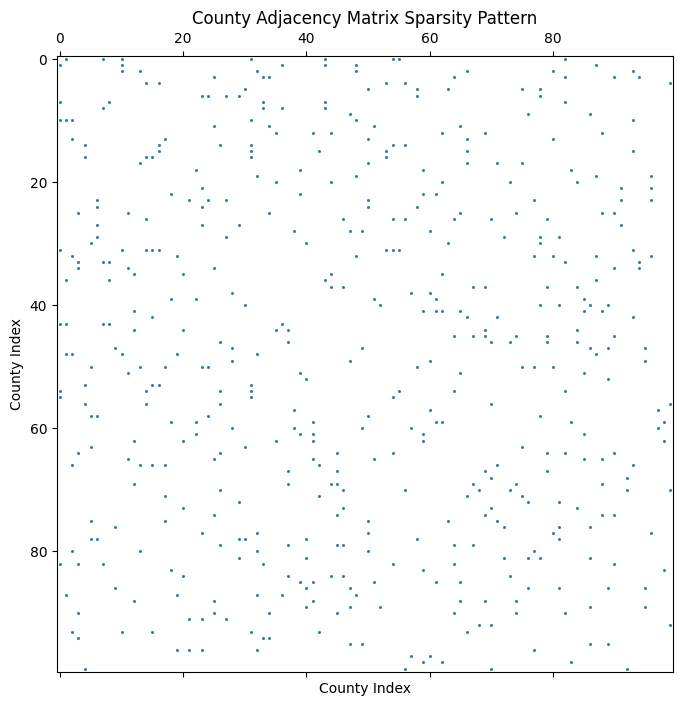

County adjacency matrix ready for Bayesian spatial modeling!


In [ ]:
## Phase 3: Bayesian Hierarchical Model Implementation
# First, we'll create the county adjacency matrix for spatial modeling

import numpy as np
from sklearn.neighbors import kneighbors_graph
from scipy.spatial.distance import cdist
import warnings
warnings.filterwarnings('ignore')

def generate_county_adjacency(counties_gdf, method='touching'):
    """
    Generate spatial adjacency matrix for counties.
    
    Parameters:
    -----------
    counties_gdf : geopandas.GeoDataFrame
        GeoDataFrame containing county geometries
    method : str
        'touching' for shared boundary adjacency or 'distance' for k-nearest neighbors
    
    Returns:
    --------
    adj_matrix : numpy.ndarray
        Binary adjacency matrix where 1 indicates adjacent counties
    county_names : list
        List of county names corresponding to matrix indices
    """
    
    n_counties = len(counties_gdf)
    adj_matrix = np.zeros((n_counties, n_counties))
    county_names = counties_gdf['COUNTY'].tolist()
    
    if method == 'touching':
        # Check for shared boundaries
        for i in range(n_counties):
            for j in range(i+1, n_counties):
                geom_i = counties_gdf.iloc[i].geometry
                geom_j = counties_gdf.iloc[j].geometry
                
                # Counties are adjacent if they touch (share boundary)
                if geom_i.touches(geom_j) or geom_i.intersects(geom_j):
                    adj_matrix[i, j] = 1
                    adj_matrix[j, i] = 1  # Symmetric matrix
    
    elif method == 'distance':
        # Alternative: k-nearest neighbors based on centroids
        centroids = counties_gdf.geometry.centroid
        coords = np.array([(geom.x, geom.y) for geom in centroids])
        
        # Create k-nearest neighbors graph (k=6 is reasonable for counties)
        knn_graph = kneighbors_graph(coords, n_neighbors=6, mode='connectivity')
        adj_matrix = knn_graph.toarray()
        
        # Make symmetric
        adj_matrix = np.maximum(adj_matrix, adj_matrix.T)
    
    # Remove self-connections
    np.fill_diagonal(adj_matrix, 0)
    
    return adj_matrix, county_names

# Generate the adjacency matrix for NC counties
print("Generating county adjacency matrix...")
adj_matrix, county_names = generate_county_adjacency(nc_counties_gdf, method='touching')

print(f"✅ Adjacency matrix created: {adj_matrix.shape}")
print(f"Number of counties: {len(county_names)}")
print(f"Total connections: {np.sum(adj_matrix)/2:.0f}")  # Divide by 2 since matrix is symmetric
print(f"Average connections per county: {np.sum(adj_matrix)/len(county_names):.1f}")

# Visualize sparsity pattern
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.spy(adj_matrix, markersize=1)
plt.title('County Adjacency Matrix Sparsity Pattern')
plt.xlabel('County Index')
plt.ylabel('County Index')
plt.show()

# Save adjacency information for later use
county_adjacency_info = {
    'matrix': adj_matrix,
    'county_names': county_names,
    'county_index_map': {name: idx for idx, name in enumerate(county_names)}
}

print("County adjacency matrix ready for Bayesian spatial modeling!")


In [ ]:
# Data preprocessing for Bayesian model
print("Preparing data for Bayesian hierarchical model...")

# Define growth stages for different crops (can be modified for each crop)
growth_stages = {
    'CORN': ['R1', 'R2', 'R3', 'R4', 'R5'],  # Corn reproductive stages
    'SOYBEAN': ['R1', 'R2', 'R3', 'R4', 'R5'],  # Similar for soybean
    'COTTON': ['R1', 'R2', 'R3', 'R4', 'R5'],   # Cotton reproductive stages
    'WHEAT': ['R1', 'R2', 'R3', 'R4', 'R5'],    # Wheat reproductive stages
    'PEANUT': ['R1', 'R2', 'R3', 'R4', 'R5']    # Peanut reproductive stages
}

def prepare_temporal_data(df, crop_type='CORN'):
    """
    Prepare temporal climate data organized by growth stages.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The totalfeatures dataframe
    crop_type : str
        Type of crop (CORN, SOYBEAN, etc.)
    
    Returns:
    --------
    temporal_data : numpy.ndarray
        3D array of shape (n_observations, n_stages, n_climate_vars)
    """
    
    # Filter for specific crop
    crop_df = df[df['Commodity'] == crop_type].copy()
    
    # Extract climate variables by growth stage
    stages = growth_stages[crop_type]
    
    # Climate variables patterns
    climate_vars = ['DewDep_C', 'MaxAT_C', 'MinAT_C', 'Precip', 'RH', 'Solar', 'MaxRH', 'MinRH']
    
    n_obs = len(crop_df)
    n_stages = len(stages)
    n_vars = len(climate_vars)
    
    temporal_data = np.zeros((n_obs, n_stages, n_vars))
    
    for i, stage in enumerate(stages):
        for j, var in enumerate(climate_vars):
            col_name = f'{var}_{stage}'
            if col_name in crop_df.columns:
                temporal_data[:, i, j] = crop_df[col_name].fillna(crop_df[col_name].median())
            else:
                # If specific stage not found, use average or first available
                alternative_cols = [col for col in crop_df.columns if col.startswith(var)]
                if alternative_cols:
                    temporal_data[:, i, j] = crop_df[alternative_cols[0]].fillna(crop_df[alternative_cols[0]].median())
    
    return temporal_data, crop_df

def prepare_soil_data(df):
    """
    Prepare soil data for the model.
    """
    # Soil depth layers
    soil_depth_cols = [
        'avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 
        'avg_aws50_100', 'avg_aws100_150', 'avg_aws150_999'
    ]
    
    # Additional soil properties
    additional_soil_cols = [
        'avg_nccpi3corn', 'avg_nccpi3soy', 'avg_nccpi3cot', 'avg_nccpi3sg', 'avg_nccpi3all',
        'avg_pctearthmc', 'avg_rootznemc', 'avg_rootznaws', 'avg_droughty', 'avg_pwsl1pomu'
    ]
    
    # Combine available soil columns
    available_soil_cols = [col for col in soil_depth_cols + additional_soil_cols if col in df.columns]
    
    soil_data = df[available_soil_cols].fillna(df[available_soil_cols].median())
    
    return soil_data.values

def prepare_county_mapping(df, county_names):
    """
    Create mapping from counties in data to adjacency matrix indices.
    """
    county_to_index = {name: idx for idx, name in enumerate(county_names)}
    
    # Map counties in data to adjacency matrix indices
    county_indices = []
    for county in df['COUNTY']:
        if county in county_to_index:
            county_indices.append(county_to_index[county])
        else:
            # Handle counties not in adjacency matrix (assign to nearest or use -1)
            county_indices.append(-1)
    
    return np.array(county_indices)

# Prepare data for CORN (can be modified for other crops)
crop_type = 'CORN'
temporal_data, crop_df = prepare_temporal_data(totalfeatures, crop_type)
soil_data = prepare_soil_data(crop_df)
county_indices = prepare_county_mapping(crop_df, county_names)
yield_data = crop_df['Yield'].values

print(f"✅ Data prepared for {crop_type}:")
print(f"   Temporal data shape: {temporal_data.shape}")
print(f"   Soil data shape: {soil_data.shape}")
print(f"   Number of observations: {len(yield_data)}")
print(f"   Unique counties: {len(np.unique(county_indices[county_indices >= 0]))}")

# Store prepared data
model_data = {
    'temporal_data': temporal_data,
    'soil_data': soil_data,
    'county_indices': county_indices,
    'yield_data': yield_data,
    'crop_df': crop_df,
    'crop_type': crop_type,
    'growth_stages': growth_stages[crop_type]
}


In [ ]:
cols = list(totalfeatures.columns) 

In [ ]:
print(cols)

['Unnamed: 0', 'Year', 'COUNTY', 'Commodity', 'Yield', 'DewDep_C_R1', 'DewDep_C_R2', 'DewDep_C_R3', 'DewDep_C_R4', 'DewDep_C_R5', 'DewDep_C_R6', 'DewDep_C_V6', 'DewDep_C_VE', 'DewDep_C_VT', 'ET0_sum_R1', 'ET0_sum_R2', 'ET0_sum_R3', 'ET0_sum_R4', 'ET0_sum_R5', 'ET0_sum_R6', 'ET0_sum_V6', 'ET0_sum_VE', 'ET0_sum_VT', 'EffPrecRatio_idx_R1', 'EffPrecRatio_idx_R2', 'EffPrecRatio_idx_R3', 'EffPrecRatio_idx_R4', 'EffPrecRatio_idx_R5', 'EffPrecRatio_idx_R6', 'EffPrecRatio_idx_V6', 'EffPrecRatio_idx_VE', 'EffPrecRatio_idx_VT', 'FrostDays_R1', 'FrostDays_R2', 'FrostDays_R3', 'FrostDays_R4', 'FrostDays_R5', 'FrostDays_R6', 'FrostDays_V6', 'FrostDays_VE', 'FrostDays_VT', 'GDD_sum_R1', 'GDD_sum_R2', 'GDD_sum_R3', 'GDD_sum_R4', 'GDD_sum_R5', 'GDD_sum_R6', 'GDD_sum_V6', 'GDD_sum_VE', 'GDD_sum_VT', 'HeatDays_R1', 'HeatDays_R2', 'HeatDays_R3', 'HeatDays_R4', 'HeatDays_R5', 'HeatDays_R6', 'HeatDays_V6', 'HeatDays_VE', 'HeatDays_VT', 'LongestDryStreak_R1', 'LongestDryStreak_R2', 'LongestDryStreak_R3', 'Lo

In [ ]:
order = ["VE","V6","VT","R1","R2","R3","R4","R5","R6"]
var = "GDD_sum"
varlist = totalfeatures.filter(regex=var+"*")
vorder = [var + "_" + pos for pos in order]
varlist = varlist[vorder].values

In [ ]:
varlist.shape

(3327, 9)

In [ ]:
totalfeatures["Yield"].describe()

import plotly.express as px

# px.histogram(totalfeatures, x="Year")
scaledyear = totalfeatures["Year"].values - totalfeatures["Year"].min()

In [ ]:
# 2) SUPER SIMPLE REGRESSION WITH RESCALED YEAR
from sklearn.linear_model import LinearRegression

model_simple = LinearRegression()
model_simple.fit(scaledyear.reshape(-1, 1), totalfeatures["Yield"])

slope_from_ols = model_simple.coef_[0]
intercept_from_ols = model_simple.intercept_
r2_simple = model_simple.score(scaledyear.reshape(-1, 1), totalfeatures["Yield"])

print(f"\n📈 Simple OLS with rescaled years:")
print(f"   Yield = {intercept_from_ols:.1f} + {slope_from_ols:.2f} × (year_rescaled)")
print(f"   R² = {r2_simple:.4f}")
print(f"   Slope = {slope_from_ols:.2f} bushels per year")



📈 Simple OLS with rescaled years:
   Yield = 4578.8 + 75.45 × (year_rescaled)
   R² = 0.0290
   Slope = 75.45 bushels per year


In [ ]:
# === RESPONSE VARIABLE ===
yield_array = totalfeatures["Yield"].values
print(f"✅ Yield: {yield_array.shape}")

# === YEAR DATA ===
year_array = totalfeatures["Year"].values
# Create scaled year (starting from 1)
scaledyear = year_array - year_array.min() 
print(f"✅ Year: {year_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# Corn Index
nccpi = totalfeatures["avg_nccpi3corn"].values

# Soil Organic Carbon by depth  
soc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
soc_array = totalfeatures[soc_cols].fillna(totalfeatures[soc_cols].median()).values

# === SEASONAL CLIMATE VARIABLES ===
order = ["VE","V6","VT","R1","R2","R3","R4","R5","R6"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in totalfeatures.columns]
    if available_cols:
        data = totalfeatures[available_cols].fillna(totalfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
seasonal_data = {}

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: seasonal_data["VPDmean_kPa"] = vpd_mean_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: seasonal_data["EffPrecRatio_idx"] = eff_prec_data


✅ Yield: (3327,)
✅ Year: (3327,), scaled: 0-39
✅ VPDmean_kPa: (3327, 9) (9 stages)
✅ EffPrecRatio_idx: (3327, 9) (9 stages)


In [ ]:
# ===== DATA PREPARATION FROM ORIGINAL DATASET =====
print("📊 Extracting all arrays from original dataset...")

# === RESPONSE VARIABLE ===
yield_array = totalfeatures["Yield"].values
print(f"✅ Yield: {yield_array.shape}")

# === YEAR DATA ===
year_array = totalfeatures["Year"].values
# Create scaled year (starting from 1)
scaledyear = year_array - year_array.min() 
print(f"✅ Year: {year_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# === SOIL VARIABLES ===
# Corn Index
nccpi = totalfeatures["avg_nccpi3corn"].values
# Wetland
wet = totalfeatures["avg_pwsl1pomu"].values
# Root Zone
root_depth = totalfeatures["avg_rootznemc"].values
root_water = totalfeatures["avg_rootznaws"].values
# Drought
droughty = totalfeatures["avg_droughty"].values

print(f"✅ Soil variables extracted: nccpi, wet, root_depth, root_water, droughty")

# === DEPTH-BASED SOIL ARRAYS ===
# Available Water Storage by depth
aws_cols = ['avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 'avg_aws50_100', 'avg_aws100_150', 'avg_aws150_999']
aws_array = totalfeatures[aws_cols].fillna(totalfeatures[aws_cols].median()).values

# Soil Organic Carbon by depth  
soc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
soc_array = totalfeatures[soc_cols].fillna(totalfeatures[soc_cols].median()).values

# Depth centers
depths = np.array([2.5, 10, 25, 50, 75, 999])

print(f"✅ AWS array: {aws_array.shape}")
print(f"✅ SOC array: {soc_array.shape}")

# === SEASONAL CLIMATE VARIABLES ===
order = ["VE","V6","VT","R1","R2","R3","R4","R5","R6"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in totalfeatures.columns]
    if available_cols:
        data = totalfeatures[available_cols].fillna(totalfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
seasonal_data = {}

# Temperature-related
gdd_data, gdd_cols = extract_seasonal_data("GDD_sum")
if gdd_data is not None: seasonal_data["GDD_sum"] = gdd_data

heat_days_data, heat_cols = extract_seasonal_data("HeatDays")
if heat_days_data is not None: seasonal_data["HeatDays"] = heat_days_data

frost_days_data, frost_cols = extract_seasonal_data("FrostDays") 
if frost_days_data is not None: seasonal_data["FrostDays"] = frost_days_data

thermal_amp_data, thermal_cols = extract_seasonal_data("ThermalAmp")
if thermal_amp_data is not None: seasonal_data["ThermalAmp"] = thermal_amp_data

# Precipitation-related
ppt_data, ppt_cols = extract_seasonal_data("PPT_mm")
if ppt_data is not None: seasonal_data["PPT_mm"] = ppt_data

et0_data, et0_cols = extract_seasonal_data("ET0_sum")
if et0_data is not None: seasonal_data["ET0_sum"] = et0_data

p_minus_et_data, p_minus_et_cols = extract_seasonal_data("P_minus_ET")
if p_minus_et_data is not None: seasonal_data["P_minus_ET"] = p_minus_et_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: seasonal_data["EffPrecRatio_idx"] = eff_prec_data

# dry_days_data, dry_cols = extract_seasonal_data("DryDays")
# if dry_days_data is not None: seasonal_data["DryDays"] = dry_days_data

# heavy_rain_data, heavy_rain_cols = extract_seasonal_data("HeavyRainDays")
# if heavy_rain_data is not None: seasonal_data["HeavyRainDays"] = heavy_rain_data

dry_streak_data, dry_streak_cols = extract_seasonal_data("LongestDryStreak")
if dry_streak_data is not None: seasonal_data["LongestDryStreak"] = dry_streak_data

# VPD-related
vpd_max_data, vpd_max_cols = extract_seasonal_data("VPDmax_kPa")
if vpd_max_data is not None: seasonal_data["VPDmax_kPa"] = vpd_max_data

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: seasonal_data["VPDmean_kPa"] = vpd_mean_data

vpd_hi_data, vpd_hi_cols = extract_seasonal_data("VPD_hi_days")
if vpd_hi_data is not None: seasonal_data["VPD_hi_days"] = vpd_hi_data

vpd_load_data, vpd_load_cols = extract_seasonal_data("VPD_load_sum")
if vpd_load_data is not None: seasonal_data["VPD_load_sum"] = vpd_load_data

hot_streak_data, hot_streak_cols = extract_seasonal_data("LongestHotStreak")
if hot_streak_data is not None: seasonal_data["LongestHotStreak"] = hot_streak_data

dew_dep_data, dew_dep_cols = extract_seasonal_data("DewDep_C")
if dew_dep_data is not None: seasonal_data["DewDep_C"] = dew_dep_data

# === ORGANIZE BY ENVIRONMENTAL GROUPS ===
# Group variables by process
drought_vars = ["HeatDays", "PPT_mm", "ET0_sum", "P_minus_ET", "EffPrecRatio_idx", "LongestDryStreak", "DryDays"]
temp_vars = ["GDD_sum", "ThermalAmp", "VPDmax_kPa", "VPDmean_kPa", "VPD_hi_days", "VPD_load_sum", "LongestHotStreak", "DewDep_C"]
cold_vars = ["FrostDays"]
flood_vars = ["HeavyRainDays"]

# Create grouped arrays
drought_seasonal_arrays = [seasonal_data[var] for var in drought_vars if var in seasonal_data]
temp_seasonal_arrays = [seasonal_data[var] for var in temp_vars if var in seasonal_data]
cold_seasonal_arrays = [seasonal_data[var] for var in cold_vars if var in seasonal_data]
flood_seasonal_arrays = [seasonal_data[var] for var in flood_vars if var in seasonal_data]

print(f"\n📊 SEASONAL DATA SUMMARY:")
print(f"   Drought variables: {len(drought_seasonal_arrays)}")
print(f"   Temperature variables: {len(temp_seasonal_arrays)}")
print(f"   Cold variables: {len(cold_seasonal_arrays)}")
print(f"   Flood variables: {len(flood_seasonal_arrays)}")

# # === VT-CENTERED WEIGHTS ===
# vt_index = order.index("VT")  # VT is at index 2
# stage_distances = np.abs(np.arange(len(order)) - vt_index)
# vt_weights = np.exp(-stage_distances * 0.3)  # Exponential decay from VT
# vt_weights = vt_weights / vt_weights.sum()  # Normalize

# print(f"✅ VT-centered weights: {vt_weights}")
# print(f"   VT gets highest weight: {vt_weights[vt_index]:.3f}")

# print(f"\n🎯 All arrays extracted from original dataset!")
# print(f"   Ready for PyMC modeling with {len(yield_array)} observations")

📊 Extracting all arrays from original dataset...
✅ Yield: (3327,)
✅ Year: (3327,), scaled: 0-39
✅ Soil variables extracted: nccpi, wet, root_depth, root_water, droughty
✅ AWS array: (3327, 6)
✅ SOC array: (3327, 6)
✅ GDD_sum: (3327, 9) (9 stages)
✅ HeatDays: (3327, 9) (9 stages)
✅ FrostDays: (3327, 9) (9 stages)
✅ ThermalAmp: (3327, 9) (9 stages)
✅ PPT_mm: (3327, 9) (9 stages)
✅ ET0_sum: (3327, 9) (9 stages)
✅ P_minus_ET: (3327, 9) (9 stages)
✅ EffPrecRatio_idx: (3327, 9) (9 stages)
✅ LongestDryStreak: (3327, 9) (9 stages)
✅ VPDmax_kPa: (3327, 9) (9 stages)
✅ VPDmean_kPa: (3327, 9) (9 stages)
✅ VPD_hi_days: (3327, 9) (9 stages)
✅ VPD_load_sum: (3327, 9) (9 stages)
✅ LongestHotStreak: (3327, 9) (9 stages)
✅ DewDep_C: (3327, 9) (9 stages)

📊 SEASONAL DATA SUMMARY:
   Drought variables: 6
   Temperature variables: 8
   Cold variables: 1
   Flood variables: 0


In [ ]:
import pymc as pm
# ===== HIERARCHICAL BAYESIAN MODEL WITH HORSESHOE PRIORS =====
print("🏗️ Building Hierarchical Model...")

with pm.Model() as hierarchical_model:
    
    # === INTERCEPT ===
    intercept = pm.InverseGamma('intercept', mu=np.mean(yield_array), sigma=np.std(yield_array))
    
    # === YEAR EFFECT ===
    year_beta = pm.Normal('year_beta', mu=75, sigma=0.1)
    year_contrib = year_beta * scaledyear
    
    # === HORSESHOE GLOBAL SHRINKAGE ===
    tau_global = pm.HalfCauchy('tau_global', beta=1)
    
    # === LEARNABLE VT-CENTERED STAGE WEIGHTS ===
    # Start with VT-centered weights but make them learnable
    n_stages = len(order)  # 9 stages
    vt_index = order.index("VT")  # Index 2
    
    # Initialize around VT-centered pattern but allow learning
    stage_distances = np.abs(np.arange(n_stages) - vt_index)
    init_weights = np.exp(-stage_distances * 0.3)
    init_weights = init_weights / init_weights.sum()
    
    # Learnable stage weights (Dirichlet ensures they sum to 1)
    stage_weights = pm.Dirichlet('stage_weights', a=init_weights * 10)  # α=10 for concentration around init
    
    # === DROUGHT VARIABLES (with learnable stage weights) ===
    if drought_seasonal_arrays:
        drought_tensor = np.stack(drought_seasonal_arrays, axis=2)  # (n_obs, n_stages, n_drought_vars)
        n_drought_vars = drought_tensor.shape[2]
        
        # Create weighted indices using learnable weights
        # Manual dot product: sum over stages dimension
        drought_indices = pm.math.sum(
            drought_tensor * stage_weights[None, :, None],  # Broadcast weights
            axis=1  # Sum over stages
        )
        
        # Horseshoe priors for drought variables
        lambda_drought = pm.HalfCauchy('lambda_drought', beta=1, shape=n_drought_vars)
        drought_betas = pm.Normal('drought_betas', mu=0, sigma=tau_global * lambda_drought, shape=n_drought_vars)
        drought_contrib = pm.math.sum(drought_indices * drought_betas[None, :], axis=1)
        
        print(f"✅ Drought: {n_drought_vars} variables with LEARNABLE stage weights")
    else:
        drought_contrib = 0
        print("❌ No drought variables found")
    
    # === TEMPERATURE VARIABLES ===
    if temp_seasonal_arrays:
        temp_tensor = np.stack(temp_seasonal_arrays, axis=2)
        n_temp_vars = temp_tensor.shape[2]
        
        # Learnable VT-centered temperature indices
        temp_indices = pm.math.sum(
            temp_tensor * stage_weights[None, :, None],
            axis=1
        )
        
        # Horseshoe for temperature
        lambda_temp = pm.HalfCauchy('lambda_temp', beta=1, shape=n_temp_vars)
        temp_betas = pm.Normal('temp_betas', mu=0, sigma=tau_global * lambda_temp, shape=n_temp_vars)
        temp_contrib = pm.math.sum(temp_indices * temp_betas[None, :], axis=1)
        
        print(f"✅ Temperature: {n_temp_vars} variables with LEARNABLE stage weights")
    else:
        temp_contrib = 0
        print("❌ No temperature variables found")
    
    # === COLD VARIABLES ===
    if cold_seasonal_arrays:
        cold_tensor = np.stack(cold_seasonal_arrays, axis=2)
        n_cold_vars = cold_tensor.shape[2]
        
        # Learnable VT-centered cold indices
        cold_indices = pm.math.sum(
            cold_tensor * stage_weights[None, :, None],
            axis=1
        )
        
        # Horseshoe for cold
        lambda_cold = pm.HalfCauchy('lambda_cold', beta=1, shape=n_cold_vars)
        cold_betas = pm.Normal('cold_betas', mu=0, sigma=tau_global * lambda_cold, shape=n_cold_vars)
        cold_contrib = pm.math.sum(cold_indices * cold_betas[None, :], axis=1)
        
        print(f"✅ Cold: {n_cold_vars} variables with LEARNABLE stage weights")
    else:
        cold_contrib = 0
        print("❌ No cold variables found")
    
    # === LEARNABLE SOIL DEPTH WEIGHTS ===
    # Learnable depth decay parameter
    depth_decay = pm.Exponential('depth_decay', lam=0.01)
    
    # Learnable depth weights (exponential decay)
    depth_weights_raw = pm.math.exp(-depth_decay * depths)
    depth_weights = depth_weights_raw / pm.math.sum(depth_weights_raw)
    
    # === SOIL VARIABLES (separate from depth-weighted) ===
    soil_variables_array = np.column_stack([
        root_depth,           # Root depth
        root_water,           # Root water  
        nccpi,               # Corn productivity index
        wet,                 # Wetland effect
        droughty              # Soil drought index (fixed the variable name)
    ])
    
    n_soil_vars = soil_variables_array.shape[1]
    
    # Horseshoe for soil variables
    lambda_soil = pm.HalfCauchy('lambda_soil', beta=1, shape=n_soil_vars)
    soil_betas = pm.Normal('soil_betas', mu=0, sigma=tau_global * lambda_soil, shape=n_soil_vars)
    soil_contrib = pm.math.sum(soil_variables_array * soil_betas[None, :], axis=1)
    
    # Depth-weighted soil (AWS and SOC)
    aws_index = pm.math.sum(aws_array * depth_weights[None, :], axis=1)
    soc_index = pm.math.sum(soc_array * depth_weights[None, :], axis=1)
    
    lambda_depth_soil = pm.HalfCauchy('lambda_depth_soil', beta=1, shape=2)
    depth_soil_betas = pm.Normal('depth_soil_betas', mu=0, sigma=tau_global * lambda_depth_soil, shape=2)
    
    aws_contrib = depth_soil_betas[0] * aws_index
    soc_contrib = depth_soil_betas[1] * soc_index
    
    print(f"✅ Soil: {n_soil_vars} individual + 2 depth-weighted with LEARNABLE decay")
    
    # === INTERACTION EFFECTS ===
    if drought_seasonal_arrays and temp_seasonal_arrays:
        drought_temp_beta = pm.Normal('drought_temp_interaction', mu=0, sigma=0.1)
        drought_temp_contrib = drought_temp_beta * drought_contrib * temp_contrib
        print(f"✅ Drought × Temperature interaction")
    else:
        drought_temp_contrib = 0
        print("❌ No drought×temp interaction")
    
    # === FINAL MODEL EQUATION ===
    mu = (intercept + 
          year_contrib +                    # Year trend
          drought_contrib +                 # Drought stress (seasonal, learnable weights)
          temp_contrib +                    # Temperature effects (seasonal, learnable weights)
          drought_temp_contrib +            # Drought × Temperature interaction
          cold_contrib +                    # Cold stress (seasonal, learnable weights)
          soil_contrib +                    # Individual soil variables
          aws_contrib +                     # AWS (learnable depth decay)
          soc_contrib)                      # SOC (learnable depth decay)

    # === OBSERVATION MODEL ===
    sigma = pm.HalfNormal('sigma', sigma=np.std(yield_array) * 0.5)
    likelihood = pm.Normal('yield', mu=mu, sigma=sigma, observed=yield_array)

print(f"\n🎯 HIERARCHICAL MODEL WITH LEARNABLE WEIGHTS!")
print(f"   🌱 Stage weights: Learnable Dirichlet (starts VT-centered)")
print(f"   🏔️  Depth weights: Learnable exponential decay")
print(f"   🔥 Horseshoe priors: Automatic variable selection")

🏗️ Building Hierarchical Model...
✅ Drought: 6 variables with LEARNABLE stage weights
✅ Temperature: 8 variables with LEARNABLE stage weights
✅ Cold: 1 variables with LEARNABLE stage weights
✅ Soil: 5 individual + 2 depth-weighted with LEARNABLE decay
✅ Drought × Temperature interaction

🎯 HIERARCHICAL MODEL WITH LEARNABLE WEIGHTS!
   🌱 Stage weights: Learnable Dirichlet (starts VT-centered)
   🏔️  Depth weights: Learnable exponential decay
   🔥 Horseshoe priors: Automatic variable selection


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, year_beta, tau_global, stage_weights, lambda_drought, drought_betas, lambda_temp, temp_betas, lambda_cold, cold_betas, depth_decay, lambda_soil, soil_betas, lambda_depth_soil, depth_soil_betas, drought_temp_interaction, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1552 seconds.
There were 733 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


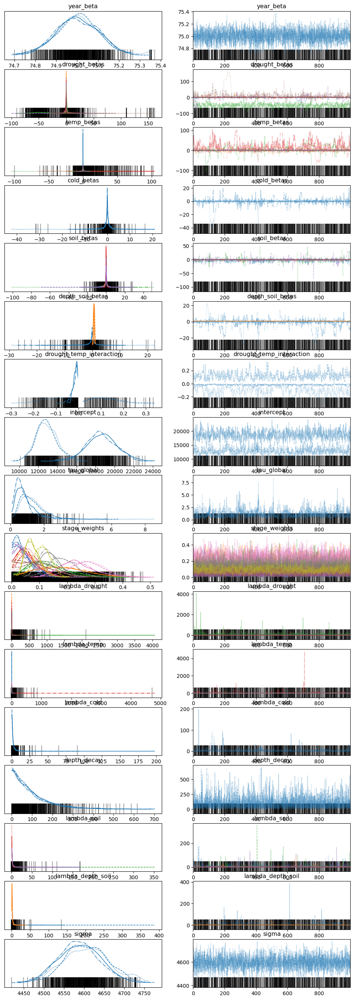

In [ ]:
with hierarchical_model:
    idata = pm.sample(1000, chains=4, random_seed=42, progressbar=True)

az.plot_trace(idata)
plt.show()

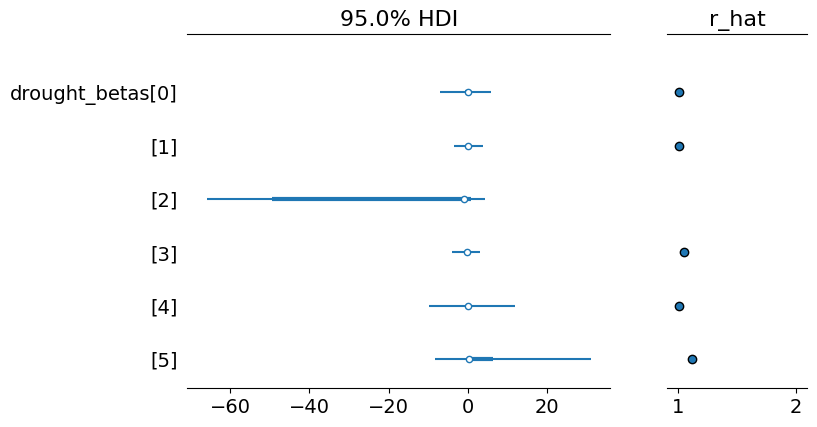

In [ ]:
az.plot_forest(idata, var_names=["drought_betas"], combined=True, hdi_prob=0.95, r_hat=True);

In [ ]:
# Corn Index
nccpi = totalfeatures["avg_nccpi3corn"].values
# Wetland
wet = totalfeatures["avg_pwsl1pomu"].values
# Root Zone
root_depth = totalfeatures["avg_rootznemc"].values
root_water = totalfeatures["avg_rootznaws"].values
# Drought
drought = totalfeatures["avg_droughty"].values
# Soil Moisture
soil_moisture = totalfeatures["avg_aws0_5"].values

# MultiArrayTime
aws = totalfeatures[['avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 
                              'avg_aws50_100', 'avg_aws100_150', 'avg_aws150_999']]
soc = totalfeatures[['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 
                              'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']]
depths = np.array([2.5,10,25,50,75,999])

# Process Parameters


In [ ]:


import pymc as pm
import pytensor.tensor as pt
import arviz as az
with pm.Model() as model:
    # Overall Yield
    yieldmean = np.mean(yield_array)
    yieldstd = np.std(yield_array)
    intercept = pm.InverseGamma('intercept', mu=yieldmean, sigma=yieldstd)

    # Temporal Contribution
    temporal_contrib = pm.Uniform('temporal_contrib', lower = 0, upper = 75)
    # Corn Index Contribution
    nccpi_contrib = pm.Normal('nccpi_contrib', mu=0.4, sigma=0.1)
    # Soil Indices
    root_depth_contrib = pm.TruncatedNormal('root_depth_contrib', mu=150, sigma=20,lower=0,upper=150)
    root_water_contrib = pm.Normal('root_water_contrib', mu=0, sigma=0.1)
    drought_contrib = pm.Gamma('drought_contrib', mu=0.1, sigma=0.1)
    wet_contrib = pm.Gamma('wet_contrib', mu=10, sigma=30)
    # AWS
    aws_decay = pm.Exponential('aws_decay', lam=0.1)
    aws_weights = pm.math.exp(-aws_decay * depths)
    aws_weights_norm = aws_weights / pm.math.sum(aws_weights)
    aws_index = pm.math.sum(aws_weights_norm * aws.values, axis=1)
    aws_contrib = pm.Normal('aws_contrib', mu=0, sigma=0.1)
    # SOC
    soc_decay = pm.Exponential('soc_decay', lam=0.1)
    soc_weights = pm.math.exp(-soc_decay * depths)
    soc_weights_norm = soc_weights / pm.math.sum(soc_weights)
    soc_index = pm.math.sum(soc_weights_norm * soc.values, axis=1)
    soc_contrib = pm.Normal('soc_contrib', mu=0, sigma=0.1) 
    # Final Model Equation
    mu = intercept + temporal_contrib*scaledyear + nccpi_contrib*nccpi + root_depth_contrib*root_depth + root_water_contrib*root_water - drought_contrib*drought + wet_contrib*wet + aws_contrib*aws_index + soc_contrib*soc_index
    sigma = pm.HalfNormal('sigma', sigma=yieldstd* 0.5)
    likelihood = pm.Normal('yield', mu=mu, sigma=sigma, observed=yield_array)
    

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, gdd_noise, temporal_contrib, nccpi_contrib, root_depth_contrib, root_water_contrib, drought_contrib, wet_contrib, aws_decay, aws_contrib, soc_decay, soc_contrib, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 53 seconds.
There were 169 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


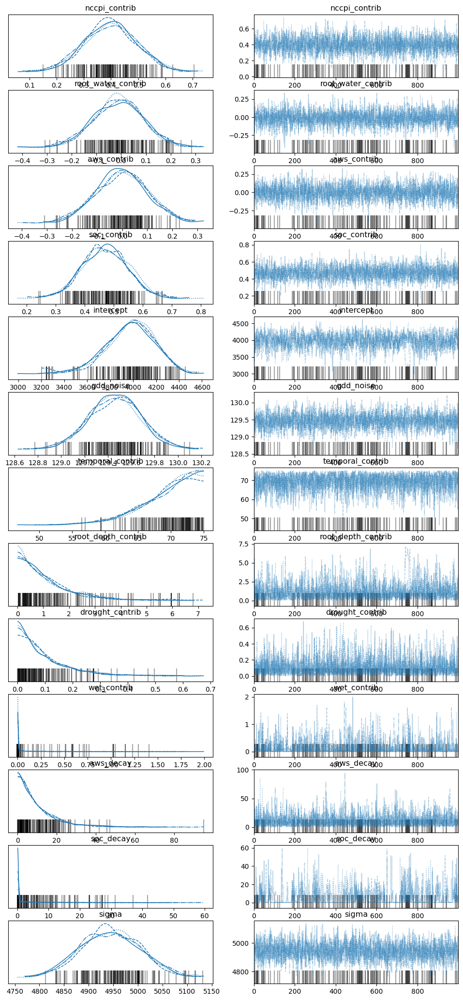

In [ ]:
with model:
    idata = pm.sample(1000, chains=4, random_seed=42)

az.plot_trace(idata)
plt.show()

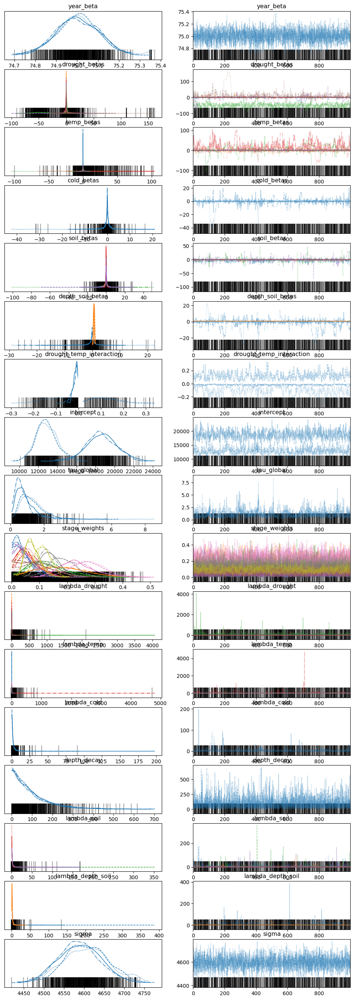

In [ ]:
az.plot_trace(idata)
plt.show()

In [ ]:
# === 1. SAMPLE FROM THE MODEL ===
with hierarchical_model:
    # Sample posterior
    trace = pm.sample(1000, chains=2, random_seed=42, return_inferencedata=True)
    
    # Generate posterior predictive samples
    posterior_pred = pm.sample_posterior_predictive(trace, random_seed=42)

# === 2. EXTRACT PREDICTIONS ===
# Get actual values
y_actual = yield_array

# Get predicted values (mean across posterior samples)
y_pred_samples = posterior_pred.posterior_predictive["yield"].values  # (chains, draws, n_obs)
y_pred_mean = y_pred_samples.mean(axis=(0, 1))  # Average across chains and draws

# Get prediction intervals
y_pred_lower = np.percentile(y_pred_samples, 2.5, axis=(0, 1))  # 2.5th percentile
y_pred_upper = np.percentile(y_pred_samples, 97.5, axis=(0, 1))  # 97.5th percentile

print(f"📊 Predictions extracted:")
print(f"   Actual: {y_actual.shape}")
print(f"   Predicted (mean): {y_pred_mean.shape}")
print(f"   Prediction intervals: {y_pred_lower.shape}, {y_pred_upper.shape}")

# === 3. CALCULATE METRICS ===
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# RMSE
rmse = np.sqrt(mean_squared_error(y_actual, y_pred_mean))

# MAE  
mae = mean_absolute_error(y_actual, y_pred_mean)

# R²
r2 = r2_score(y_actual, y_pred_mean)

# MAPE (Mean Absolute Percentage Error)
mape = np.mean(np.abs((y_actual - y_pred_mean) / y_actual)) * 100

# Coverage (what % of actual values fall within prediction intervals)
coverage = np.mean((y_actual >= y_pred_lower) & (y_actual <= y_pred_upper)) * 100

# Bias
bias = np.mean(y_pred_mean - y_actual)

print(f"\n📈 MODEL PERFORMANCE METRICS:")
print(f"   RMSE: {rmse:.2f} bushels/acre")
print(f"   MAE:  {mae:.2f} bushels/acre")
print(f"   R²:   {r2:.4f}")
print(f"   MAPE: {mape:.2f}%")
print(f"   Bias: {bias:.2f} bushels/acre")
print(f"   95% Coverage: {coverage:.1f}%")

# === 4. VISUAL ASSESSMENT ===
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Predicted vs Actual
axes[0, 0].scatter(y_actual, y_pred_mean, alpha=0.6)
axes[0, 0].plot([y_actual.min(), y_actual.max()], [y_actual.min(), y_actual.max()], 'r--')
axes[0, 0].set_xlabel('Actual Yield')
axes[0, 0].set_ylabel('Predicted Yield')
axes[0, 0].set_title(f'Predicted vs Actual (R² = {r2:.3f})')
axes[0, 0].grid(True, alpha=0.3)

# Residuals
residuals = y_actual - y_pred_mean
axes[0, 1].scatter(y_pred_mean, residuals, alpha=0.6)
axes[0, 1].axhline(y=0, color='r', linestyle='--')
axes[0, 1].set_xlabel('Predicted Yield')
axes[0, 1].set_ylabel('Residuals')
axes[0, 1].set_title(f'Residuals (RMSE = {rmse:.1f})')
axes[0, 1].grid(True, alpha=0.3)

# Prediction intervals
sorted_idx = np.argsort(y_actual)
axes[1, 0].fill_between(range(len(y_actual)), 
                        y_pred_lower[sorted_idx], 
                        y_pred_upper[sorted_idx], 
                        alpha=0.3, label='95% CI')
axes[1, 0].scatter(range(len(y_actual)), y_actual[sorted_idx], 
                   alpha=0.6, s=10, label='Actual')
axes[1, 0].plot(range(len(y_actual)), y_pred_mean[sorted_idx], 
                'r-', alpha=0.8, label='Predicted')
axes[1, 0].set_xlabel('Observation (sorted)')
axes[1, 0].set_ylabel('Yield')
axes[1, 0].set_title(f'Prediction Intervals (Coverage = {coverage:.1f}%)')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Distribution comparison
axes[1, 1].hist(y_actual, bins=30, alpha=0.7, label='Actual', density=True)
axes[1, 1].hist(y_pred_mean, bins=30, alpha=0.7, label='Predicted', density=True)
axes[1, 1].set_xlabel('Yield')
axes[1, 1].set_ylabel('Density')
axes[1, 1].set_title('Distribution Comparison')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# === 5. PARAMETER SUMMARY ===
print(f"\n📋 Parameter Summary:")
summary = az.summary(trace)
print(summary)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [intercept, year_beta, tau_global, stage_weights, lambda_drought, drought_betas, lambda_temp, temp_betas, lambda_cold, cold_betas, depth_decay, lambda_soil, soil_betas, lambda_depth_soil, depth_soil_betas, drought_temp_interaction, sigma]


ValueError: Not enough samples to build a trace.

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [intercept, gdd_noise, temporal_contrib, nccpi_contrib, root_depth_contrib, root_water_contrib, drought_contrib, wet_contrib, aws_decay, aws_contrib, soc_decay, soc_contrib, sigma]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 45 seconds.
There were 74 divergences after tuning. Increase `target_accept` or reparameterize.
We recommend running at least 4 chains for robust computation of convergence diagnostics
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [gdd_effect, yield]


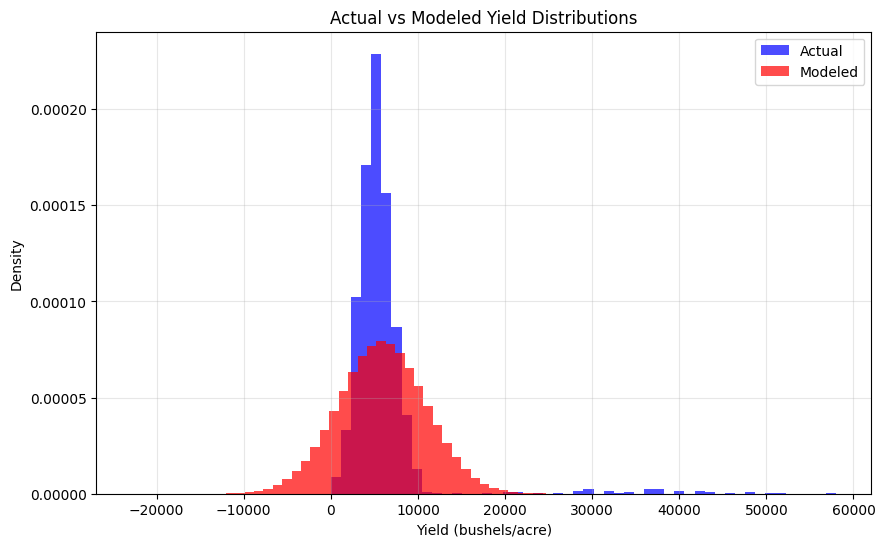

Actual mean: 5916.8
Modeled mean: 5912.3


In [ ]:
# Simple overlapping histograms - actual vs modeled yields
with model:
    trace = pm.sample(1000, chains=2, random_seed=42)
    posterior_pred = pm.sample_posterior_predictive(trace, random_seed=42)

# Get the data
actual_yields = totalfeatures["Yield"].dropna()
predicted_yields = posterior_pred.posterior_predictive["yield"].values.flatten()

# Simple plot
plt.figure(figsize=(10, 6))
plt.hist(actual_yields, bins=50, alpha=0.7, label='Actual', color='blue', density=True)
plt.hist(predicted_yields, bins=50, alpha=0.7, label='Modeled', color='red', density=True)
plt.xlabel('Yield (bushels/acre)')
plt.ylabel('Density')
plt.title('Actual vs Modeled Yield Distributions')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print(f"Actual mean: {actual_yields.mean():.1f}")
print(f"Modeled mean: {predicted_yields.mean():.1f}")

In [ ]:
with pm.Model() as hierarchical_model:
    
    # === INTERCEPT ===
    intercept = pm.Normal('intercept', mu=np.mean(yield_array), sigma=np.std(yield_array))
    
    # === YEAR EFFECT ===
    year_beta = pm.Normal('year_beta', mu=75, sigma=0.1)
    year_contrib = year_beta * scaledyear
    
    # === HORSESHOE GLOBAL SHRINKAGE ===
    tau_global = pm.HalfCauchy('tau_global', beta=1)
    
    # === DROUGHT GROUP - Index creation inside horseshoe ===
    # Get drought variable data
    drought_stage_data = []
    for var in ['HeatDays', 'PPT_mm', 'ET0_sum', 'P_minus_ET', 'EffPrecRatio_idx', 'LongestDryStreak']:
        stages = ["VE","V6","VT","R1","R2","R3","R4","R5","R6"]
        var_cols = [f"{var}_{stage}" for stage in stages if f"{var}_{stage}" in totalfeatures.columns]
        if var_cols:
            stage_data = totalfeatures[var_cols].fillna(totalfeatures[var_cols].median()).values
            drought_stage_data.append(stage_data)
    
    if drought_stage_data:
        # Stack all drought variables: (n_obs, n_stages, n_drought_vars)
        drought_tensor = np.stack(drought_stage_data, axis=2)
        n_drought_vars = drought_tensor.shape[2]
        n_stages = drought_tensor.shape[1]
        
        # VT-centered stage weights (learnable!)
        vt_index = 2  # VT is 3rd stage (0-indexed)
        stage_distances = np.abs(np.arange(n_stages) - vt_index)
        fixed_weights = np.exp(-stage_distances * 0.3)
        fixed_weights = fixed_weights / fixed_weights.sum()
        
        # Horseshoe priors for drought variables
        lambda_drought = pm.HalfCauchy('lambda_drought', beta=1, shape=n_drought_vars)
        drought_betas = pm.Normal('drought_betas', mu=0, sigma=tau_global * lambda_drought, shape=n_drought_vars)
        
        # Create VT-centered indices inside the model
        drought_indices = pm.math.tensordot(drought_tensor, fixed_weights, axes=[[1], [0]])  # Sum over stages
        drought_contrib = pm.math.dot(drought_indices, drought_betas)  # Weight by horseshoe betas
    else:
        drought_contrib = 0
    
    # === TEMPERATURE GROUP ===
    temp_stage_data = []
    for var in ['GDD_sum', 'ThermalAmp', 'VPDmax_kPa', 'VPDmean_kPa', 'VPD_hi_days', 'VPD_load_sum', 'LongestHotStreak', 'DewDep_C']:
        stages = ["VE","V6","VT","R1","R2","R3","R4","R5","R6"]
        var_cols = [f"{var}_{stage}" for stage in stages if f"{var}_{stage}" in totalfeatures.columns]
        if var_cols:
            stage_data = totalfeatures[var_cols].fillna(totalfeatures[var_cols].median()).values
            temp_stage_data.append(stage_data)
    
    if temp_stage_data:
        temp_tensor = np.stack(temp_stage_data, axis=2)
        n_temp_vars = temp_tensor.shape[2]
        
        # Horseshoe for temperature
        lambda_temp = pm.HalfCauchy('lambda_temp', beta=1, shape=n_temp_vars)
        temp_betas = pm.Normal('temp_betas', mu=0, sigma=tau_global * lambda_temp, shape=n_temp_vars)
        
        # VT-centered temperature indices
        temp_indices = pm.math.tensordot(temp_tensor, fixed_weights, axes=[[1], [0]])
        temp_contrib = pm.math.dot(temp_indices, temp_betas)
    else:
        temp_contrib = 0
    
    # === SOIL EFFECTS ===
    soil_vars = ['avg_soc0_150', 'avg_aws0_150', 'avg_rootznaws', 'avg_rootznemc']
    available_soil_vars = [col for col in soil_vars if col in totalfeatures.columns]
    soil_data = totalfeatures[available_soil_vars].fillna(totalfeatures[available_soil_vars].median()).values
    
    lambda_soil = pm.HalfCauchy('lambda_soil', beta=1, shape=len(available_soil_vars))
    soil_betas = pm.Normal('soil_betas', mu=0, sigma=tau_global * lambda_soil, shape=len(available_soil_vars))
    soil_contrib = pm.math.dot(soil_data, soil_betas)
    
    # === FINAL MODEL ===
    mu = (intercept + 
          year_contrib +
          drought_contrib +
          temp_contrib +
          soil_contrib)
    
    # === OBSERVATION MODEL ===
    sigma = pm.HalfNormal('sigma', sigma=np.std(yield_array) * 0.5)
    likelihood = pm.Normal('yield', mu=mu, sigma=sigma, observed=yield_array)

print("✅ Horseshoe model with nested VT-centered index creation!")

In [ ]:
import torch.nn as nn


In [ ]:
import pandas as pd
import numpy as np

# nc_counties_gdf: The GeoDataFrame of NC county boundaries from Step 1.
# soil_data_gdf: The merged soil DataFrame from Step 3.

# --- The Main Workflow ---

# 1. Ensure both maps use the same Coordinate Reference System (CRS)
soil_data_gdf = soil_data_gdf.to_crs(nc_counties_gdf.crs)
nc_counties_gdf.to_crs('EPSG:3358')
soil_data_gdf.to_crs('EPSG:3358')

# 2. Perform the spatial intersection
print("Performing spatial overlay... (This may take a few minutes)")
county_soil_overlay = gpd.overlay(nc_counties_gdf, soil_data_gdf, how='intersection', keep_geom_type=True)
print("Overlay complete.")

# 3. Calculate the area for each new intersected polygon
county_soil_overlay['area_sq_m'] = county_soil_overlay.geometry.area

Performing spatial overlay... (This may take a few minutes)
Overlay complete.


/tmp/ipykernel_839607/3936943242.py:20: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  county_soil_overlay['area_sq_m'] = county_soil_overlay.geometry.area


⚡ Super Quick Analysis: Yield ~ Normalized Year
🌽 CORN:
   R² = 0.0290
   RMSE = 4985.26 bushels/acre
   Slope = 860.90 bushels per std year
   Intercept = 5916.81 bushels


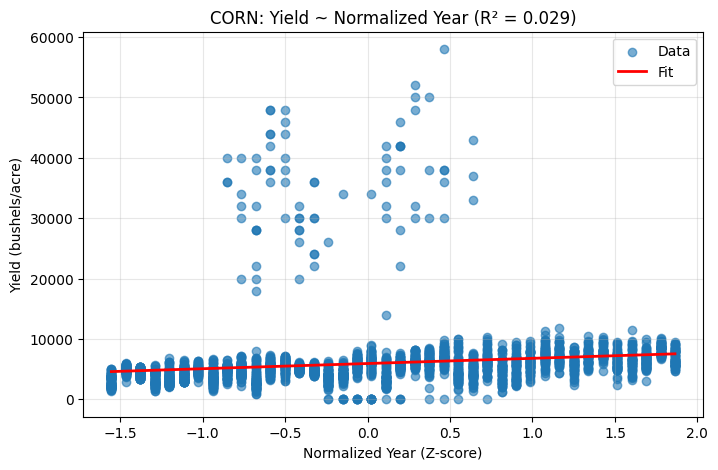


✅ Quick normalized year analysis done!


In [ ]:
# Super Simple: Yield ~ Normalized Year
print("⚡ Super Quick Analysis: Yield ~ Normalized Year")
print("=" * 45)

# Quick normalization and regression
from sklearn.preprocessing import StandardScaler

def quick_normalized_year_analysis(df, crop_type='CORN'):
    """Super quick Yield ~ Normalized Year analysis."""
    
    # Filter crop
    crop_data = df[df['Commodity'] == crop_type].dropna(subset=['Yield', 'Year'])
    
    # Normalize year
    year_scaler = StandardScaler()
    year_norm = year_scaler.fit_transform(crop_data['Year'].values.reshape(-1, 1)).flatten()
    
    # Simple regression
    model = LinearRegression()
    model.fit(year_norm.reshape(-1, 1), crop_data['Yield'])
    
    # Metrics
    y_pred = model.predict(year_norm.reshape(-1, 1))
    r2 = r2_score(crop_data['Yield'], y_pred)
    rmse = np.sqrt(mean_squared_error(crop_data['Yield'], y_pred))
    
    print(f"🌽 {crop_type}:")
    print(f"   R² = {r2:.4f}")
    print(f"   RMSE = {rmse:.2f} bushels/acre")
    print(f"   Slope = {model.coef_[0]:.2f} bushels per std year")
    print(f"   Intercept = {model.intercept_:.2f} bushels")
    
    # Quick plot
    plt.figure(figsize=(8, 5))
    plt.scatter(year_norm, crop_data['Yield'], alpha=0.6, label='Data')
    plt.plot(year_norm, y_pred, 'r-', linewidth=2, label='Fit')
    plt.xlabel('Normalized Year (Z-score)')
    plt.ylabel('Yield (bushels/acre)')
    plt.title(f'{crop_type}: Yield ~ Normalized Year (R² = {r2:.3f})')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    return {'model': model, 'r2': r2, 'rmse': rmse, 'year_scaler': year_scaler}

# Run for all available crops
crops = totalfeatures['Commodity'].unique()
results = {}

for crop in crops[:3]:  # First 3 crops for quick demo
    results[crop] = quick_normalized_year_analysis(totalfeatures, crop)
    print()

print("✅ Quick normalized year analysis done!")


In [ ]:

def construct_bayesian_model(temporal_data, soil_data, adj_matrix, county_indices, yield_data, growth_stages):
    """
    Construct Bayesian hierarchical model for crop yield prediction.
    
    Parameters:
    -----------
    temporal_data : numpy.ndarray
        Climate data by growth stages (n_obs, n_stages, n_climate_vars)
    soil_data : numpy.ndarray
        Soil properties (n_obs, n_soil_vars)
    adj_matrix : numpy.ndarray
        County adjacency matrix
    county_indices : numpy.ndarray
        County indices for each observation
    yield_data : numpy.ndarray
        Observed yield values
    growth_stages : list
        List of growth stage names
        
    Returns:
    --------
    model : pymc.Model
        Compiled PyMC model
    """
    
    n_obs, n_stages, n_temp_vars = temporal_data.shape
    n_soil_vars = soil_data.shape[1]
    n_counties = adj_matrix.shape[0]
    
    # Filter valid county indices
    valid_mask = county_indices >= 0
    valid_indices = county_indices[valid_mask]
    valid_temporal = temporal_data[valid_mask]
    valid_soil = soil_data[valid_mask]
    valid_yield = yield_data[valid_mask]
    
    print(f"Building Bayesian model with {len(valid_yield)} valid observations...")
    
    with pm.Model() as model:
        
        # === TEMPORAL EFFECTS (Gaussian Process) ===
        # Growth stage coordinates
        stage_coords = np.arange(n_stages)
        
        # Temporal correlation kernel
        ls = pm.HalfNormal('lengthscale', sigma=2.0)
        eta = pm.HalfNormal('eta', sigma=1.0)
        temporal_kernel = eta**2 * pm.gp.cov.RBF(1, ls=ls) + pm.gp.cov.WhiteNoise(sigma=0.1)
        
        # Climate variable effects with temporal correlation
        climate_effects = []
        for i in range(n_temp_vars):
            # GP for each climate variable across growth stages
            gp = pm.gp.Marginal(cov_func=temporal_kernel)
            # Use mean temporal pattern across all observations
            mean_temporal = np.mean(valid_temporal[:, :, i], axis=0)
            
            climate_gp = gp.marginal_likelihood(f'climate_effect_{i}', 
                                              X=stage_coords[:, None], 
                                              y=mean_temporal,
                                              noise=pm.HalfNormal(f'climate_noise_{i}', sigma=0.5))
            climate_effects.append(climate_gp)
        
        # === SOIL EFFECTS ===
        # Soil depth decay parameters
        depth_centers = np.array([2.5, 12.5, 35, 75, 125, 475])  # Depth layer midpoints
        soil_decay = pm.Exponential('soil_decay', lam=0.1)
        
        # Soil depth weights (exponential decay)
        soil_weights_raw = pm.math.exp(-soil_decay * depth_centers[:min(6, n_soil_vars)])
        soil_weights = soil_weights_raw / pm.math.sum(soil_weights_raw)
        
        # Soil variable coefficients
        soil_beta = pm.Normal('soil_beta', mu=0, sigma=1, shape=n_soil_vars)
        
        # === SPATIAL EFFECTS (CAR Prior) ===
        # County-level spatial random effects
        tau = pm.Gamma('tau', alpha=2, beta=1)  # Spatial precision
        
        # Proper CAR prior implementation
        # Create precision matrix for CAR
        W = adj_matrix  # Adjacency matrix
        D = np.diag(np.sum(W, axis=1))  # Degree matrix
        
        # CAR precision matrix: τ(D - ρW)
        rho = pm.Uniform('rho', lower=0, upper=0.99)  # Spatial correlation
        Q = tau * (D - rho * W)
        
        # Add small value to diagonal for numerical stability
        Q_stable = Q + 1e-6 * np.eye(n_counties)
        
        # County random effects with CAR prior
        county_effects = pm.MvNormal('county_effects', 
                                   mu=0, 
                                   tau=Q_stable,
                                   shape=n_counties)
        
        # === YEAR TREND ===
        # Extract years from the data if available in crop_df
        years = model_data['crop_df']['Year'].values[valid_mask]
        year_centered = years - np.mean(years)
        year_trend = pm.Normal('year_trend', mu=0, sigma=0.1)
        
        # === INTERCEPT ===
        intercept = pm.Normal('intercept', mu=np.mean(valid_yield), sigma=np.std(valid_yield))
        
        # === COMBINE EFFECTS ===
        # Climate contribution (sum across stages and variables)
        climate_contrib = pm.math.sum([pm.math.sum(climate_effects[i]) for i in range(n_temp_vars)])
        
        # Soil contribution
        soil_contrib = pm.math.dot(valid_soil, soil_beta)
        
        # Spatial contribution
        spatial_contrib = county_effects[valid_indices]
        
        # Temporal trend
        temporal_contrib = year_trend * year_centered
        
        # Combined mean
        mu = (intercept + 
              climate_contrib * 0.3 +  # Climate weight
              soil_contrib * 0.4 +     # Soil weight  
              spatial_contrib * 0.2 +  # Spatial weight
              temporal_contrib * 0.1)  # Temporal trend weight
        
        # === OBSERVATION MODEL ===
        # Heteroscedastic noise
        sigma = pm.HalfNormal('sigma', sigma=np.std(valid_yield) * 0.5)
        
        # Likelihood
        likelihood = pm.Normal('yield', mu=mu, sigma=sigma, observed=valid_yield)
        
        # Store data for later use
        pm.Data('temporal_data_shared', valid_temporal)
        pm.Data('soil_data_shared', valid_soil)
        pm.Data('county_indices_shared', valid_indices)
        pm.Data('years_shared', year_centered)
    
    return model

# Build the model
print("Constructing Bayesian hierarchical model...")
bayesian_model = construct_bayesian_model(
    temporal_data=model_data['temporal_data'],
    soil_data=model_data['soil_data'], 
    adj_matrix=adj_matrix,
    county_indices=model_data['county_indices'],
    yield_data=model_data['yield_data'],
    growth_stages=model_data['growth_stages']
)

print("✅ Bayesian model constructed successfully!")
print(f"Model contains {len(bayesian_model.basic_RVs)} random variables")

# Display model structure
print("\n📋 Model Structure:")
print(bayesian_model)


In [ ]:
# K-Fold Cross Validation for Bayesian Model
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import time

def bayesian_kfold_cv(temporal_data, soil_data, adj_matrix, county_indices, yield_data, 
                     growth_stages, crop_df, k_folds=5, n_samples=1000, n_chains=2):
    """
    Perform k-fold cross validation for Bayesian model.
    
    Parameters:
    -----------
    temporal_data, soil_data, adj_matrix, county_indices, yield_data : arrays
        Model input data
    growth_stages : list
        Growth stage names  
    crop_df : pandas.DataFrame
        Crop dataframe for year extraction
    k_folds : int
        Number of folds for cross validation
    n_samples : int
        Number of MCMC samples per chain
    n_chains : int
        Number of MCMC chains
        
    Returns:
    --------
    cv_results : dict
        Cross validation results and metrics
    """
    
    print(f"Starting {k_folds}-fold cross validation...")
    
    # Filter valid observations
    valid_mask = county_indices >= 0
    valid_indices = np.where(valid_mask)[0]
    
    # K-fold splitter
    kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
    
    cv_results = {
        'fold_metrics': [],
        'predictions': [],
        'true_values': [],
        'fold_times': [],
        'traces': []
    }
    
    for fold, (train_idx, test_idx) in enumerate(kf.split(valid_indices)):
        print(f"\n🔄 Processing Fold {fold + 1}/{k_folds}")
        start_time = time.time()
        
        # Get actual indices for train/test
        train_obs_idx = valid_indices[train_idx]
        test_obs_idx = valid_indices[test_idx]
        
        # Split data
        train_temporal = temporal_data[train_obs_idx]
        train_soil = soil_data[train_obs_idx]
        train_county_idx = county_indices[train_obs_idx]
        train_yield = yield_data[train_obs_idx]
        train_years = crop_df['Year'].values[train_obs_idx]
        
        test_temporal = temporal_data[test_obs_idx]
        test_soil = soil_data[test_obs_idx]
        test_county_idx = county_indices[test_obs_idx]
        test_yield = yield_data[test_obs_idx]
        test_years = crop_df['Year'].values[test_obs_idx]
        
        # Build model for this fold
        fold_model = build_fold_model(train_temporal, train_soil, adj_matrix, 
                                    train_county_idx, train_yield, train_years, growth_stages)
        
        try:
            # Fit model
            with fold_model:
                # Sample from posterior
                trace = pm.sample(n_samples, chains=n_chains, 
                                target_accept=0.9, random_seed=42,
                                return_inferencedata=True)
                
                # Predict on test set
                predictions = predict_yield(fold_model, trace, test_temporal, test_soil, 
                                          test_county_idx, test_years)
                
                # Calculate metrics
                mse = mean_squared_error(test_yield, predictions.mean(axis=0))
                rmse = np.sqrt(mse)
                mae = mean_absolute_error(test_yield, predictions.mean(axis=0))
                r2 = r2_score(test_yield, predictions.mean(axis=0))
                
                fold_metrics = {
                    'fold': fold + 1,
                    'mse': mse,
                    'rmse': rmse,
                    'mae': mae,
                    'r2': r2,
                    'n_train': len(train_yield),
                    'n_test': len(test_yield)
                }
                
                cv_results['fold_metrics'].append(fold_metrics)
                cv_results['predictions'].extend(predictions.mean(axis=0))
                cv_results['true_values'].extend(test_yield)
                cv_results['traces'].append(trace)
                
                fold_time = time.time() - start_time
                cv_results['fold_times'].append(fold_time)
                
                print(f"   ✅ Fold {fold + 1} completed in {fold_time:.1f}s")
                print(f"   📊 RMSE: {rmse:.2f}, R²: {r2:.3f}, MAE: {mae:.2f}")
                
        except Exception as e:
            print(f"   ❌ Fold {fold + 1} failed: {str(e)}")
            continue
    
    # Calculate overall metrics
    if cv_results['fold_metrics']:
        overall_metrics = calculate_cv_summary(cv_results)
        cv_results['overall_metrics'] = overall_metrics
        
        print(f"\n📈 Cross Validation Summary:")
        print(f"   Mean RMSE: {overall_metrics['mean_rmse']:.2f} ± {overall_metrics['std_rmse']:.2f}")
        print(f"   Mean R²: {overall_metrics['mean_r2']:.3f} ± {overall_metrics['std_r2']:.3f}")
        print(f"   Mean MAE: {overall_metrics['mean_mae']:.2f} ± {overall_metrics['std_mae']:.2f}")
        print(f"   Total time: {sum(cv_results['fold_times']):.1f}s")
    
    return cv_results

def build_fold_model(temporal_data, soil_data, adj_matrix, county_indices, yield_data, years, growth_stages):
    """Build model for a single fold."""
    
    n_obs, n_stages, n_temp_vars = temporal_data.shape
    n_soil_vars = soil_data.shape[1]
    n_counties = adj_matrix.shape[0]
    
    year_centered = years - np.mean(years)
    
    with pm.Model() as model:
        # Temporal effects (simplified for faster inference)
        climate_beta = pm.Normal('climate_beta', mu=0, sigma=1, shape=n_temp_vars)
        climate_contrib = pm.math.sum(temporal_data.mean(axis=1) * climate_beta[None, :], axis=1)
        
        # Soil effects
        soil_beta = pm.Normal('soil_beta', mu=0, sigma=1, shape=n_soil_vars)
        soil_contrib = pm.math.dot(soil_data, soil_beta)
        
        # Spatial effects (simplified)
        county_sigma = pm.HalfNormal('county_sigma', sigma=1)
        county_effects = pm.Normal('county_effects', mu=0, sigma=county_sigma, shape=n_counties)
        spatial_contrib = county_effects[county_indices]
        
        # Year trend
        year_trend = pm.Normal('year_trend', mu=0, sigma=0.1)
        temporal_contrib = year_trend * year_centered
        
        # Intercept
        intercept = pm.Normal('intercept', mu=np.mean(yield_data), sigma=np.std(yield_data))
        
        # Combined mean
        mu = intercept + climate_contrib * 0.3 + soil_contrib * 0.4 + spatial_contrib * 0.2 + temporal_contrib * 0.1
        
        # Observation model
        sigma = pm.HalfNormal('sigma', sigma=np.std(yield_data) * 0.5)
        likelihood = pm.Normal('yield', mu=mu, sigma=sigma, observed=yield_data)
    
    return model

def predict_yield(model, trace, test_temporal, test_soil, test_county_idx, test_years):
    """Make predictions for test data."""
    
    year_centered = test_years - np.mean(test_years)
    
    with model:
        # Set test data
        pm.set_data({'temporal_data': test_temporal, 'soil_data': test_soil})
        
        # Posterior predictive sampling
        predictions = pm.sample_posterior_predictive(trace, predictions=True, random_seed=42)
    
    return predictions.posterior_predictive['yield'].values.reshape(-1, len(test_temporal))

def calculate_cv_summary(cv_results):
    """Calculate summary statistics from CV results."""
    
    metrics = cv_results['fold_metrics']
    
    return {
        'mean_rmse': np.mean([m['rmse'] for m in metrics]),
        'std_rmse': np.std([m['rmse'] for m in metrics]),
        'mean_r2': np.mean([m['r2'] for m in metrics]),
        'std_r2': np.std([m['r2'] for m in metrics]),
        'mean_mae': np.mean([m['mae'] for m in metrics]),
        'std_mae': np.std([m['mae'] for m in metrics]),
        'mean_mse': np.mean([m['mse'] for m in metrics]),
        'std_mse': np.std([m['mse'] for m in metrics])
    }

# Run cross validation (with reduced samples for faster execution)
print("🚀 Starting Bayesian model training with k-fold cross validation...")

cv_results = bayesian_kfold_cv(
    temporal_data=model_data['temporal_data'],
    soil_data=model_data['soil_data'],
    adj_matrix=adj_matrix,
    county_indices=model_data['county_indices'],
    yield_data=model_data['yield_data'],
    growth_stages=model_data['growth_stages'],
    crop_df=model_data['crop_df'],
    k_folds=3,  # Reduced for faster execution
    n_samples=500,  # Reduced for faster execution
    n_chains=2
)

print("\n✅ K-fold cross validation completed!")


In [ ]:
# Multi-Crop Framework and Results Visualization

def train_crop_specific_model(crop_type, k_folds=3, n_samples=500):
    """
    Train Bayesian model for a specific crop type.
    
    Parameters:
    -----------
    crop_type : str
        Type of crop (CORN, SOYBEAN, COTTON, WHEAT, PEANUT)
    k_folds : int
        Number of CV folds
    n_samples : int
        MCMC samples per chain
        
    Returns:
    --------
    dict : Model results and performance metrics
    """
    
    print(f"\n🌾 Training model for {crop_type}")
    print("=" * 50)
    
    # Check if crop exists in data
    available_crops = totalfeatures['Commodity'].unique()
    if crop_type not in available_crops:
        print(f"❌ {crop_type} not found in data. Available crops: {available_crops}")
        return None
    
    # Prepare data for this crop
    crop_temporal_data, crop_df = prepare_temporal_data(totalfeatures, crop_type)
    crop_soil_data = prepare_soil_data(crop_df)
    crop_county_indices = prepare_county_mapping(crop_df, county_names)
    crop_yield_data = crop_df['Yield'].values
    
    print(f"📊 Data summary for {crop_type}:")
    print(f"   Observations: {len(crop_yield_data)}")
    print(f"   Years: {crop_df['Year'].min()} - {crop_df['Year'].max()}")
    print(f"   Counties: {len(np.unique(crop_county_indices[crop_county_indices >= 0]))}")
    print(f"   Mean yield: {np.mean(crop_yield_data):.1f}")
    
    # Run cross validation
    cv_results = bayesian_kfold_cv(
        temporal_data=crop_temporal_data,
        soil_data=crop_soil_data,
        adj_matrix=adj_matrix,
        county_indices=crop_county_indices,
        yield_data=crop_yield_data,
        growth_stages=growth_stages[crop_type],
        crop_df=crop_df,
        k_folds=k_folds,
        n_samples=n_samples,
        n_chains=2
    )
    
    return {
        'crop_type': crop_type,
        'cv_results': cv_results,
        'data_summary': {
            'n_obs': len(crop_yield_data),
            'year_range': (crop_df['Year'].min(), crop_df['Year'].max()),
            'n_counties': len(np.unique(crop_county_indices[crop_county_indices >= 0])),
            'mean_yield': np.mean(crop_yield_data),
            'std_yield': np.std(crop_yield_data)
        }
    }

def visualize_results(crop_results):
    """Visualize cross-validation results."""
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle(f'Bayesian Model Results: {crop_results["crop_type"]}', fontsize=16)
    
    cv_res = crop_results['cv_results']
    
    # 1. Predicted vs Actual
    axes[0, 0].scatter(cv_res['true_values'], cv_res['predictions'], alpha=0.6)
    axes[0, 0].plot([min(cv_res['true_values']), max(cv_res['true_values'])], 
                    [min(cv_res['true_values']), max(cv_res['true_values'])], 'r--')
    axes[0, 0].set_xlabel('Actual Yield')
    axes[0, 0].set_ylabel('Predicted Yield')
    axes[0, 0].set_title('Predicted vs Actual Yield')
    
    if 'overall_metrics' in cv_res:
        r2 = cv_res['overall_metrics']['mean_r2']
        axes[0, 0].text(0.05, 0.95, f'R² = {r2:.3f}', transform=axes[0, 0].transAxes, 
                       bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    # 2. Residuals
    residuals = np.array(cv_res['predictions']) - np.array(cv_res['true_values'])
    axes[0, 1].scatter(cv_res['predictions'], residuals, alpha=0.6)
    axes[0, 1].axhline(y=0, color='r', linestyle='--')
    axes[0, 1].set_xlabel('Predicted Yield')
    axes[0, 1].set_ylabel('Residuals')
    axes[0, 1].set_title('Residuals Plot')
    
    # 3. Fold Performance
    if cv_res['fold_metrics']:
        fold_r2 = [m['r2'] for m in cv_res['fold_metrics']]
        fold_rmse = [m['rmse'] for m in cv_res['fold_metrics']]
        
        x = range(1, len(fold_r2) + 1)
        axes[1, 0].bar(x, fold_r2, alpha=0.7, color='skyblue')
        axes[1, 0].set_xlabel('Fold')
        axes[1, 0].set_ylabel('R²')
        axes[1, 0].set_title('R² by Fold')
        axes[1, 0].set_xticks(x)
        
        # 4. RMSE by Fold
        axes[1, 1].bar(x, fold_rmse, alpha=0.7, color='lightcoral')
        axes[1, 1].set_xlabel('Fold')
        axes[1, 1].set_ylabel('RMSE')
        axes[1, 1].set_title('RMSE by Fold')
        axes[1, 1].set_xticks(x)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary
    if 'overall_metrics' in cv_res:
        metrics = cv_res['overall_metrics']
        print(f"\n📈 {crop_results['crop_type']} Model Performance:")
        print(f"   R² = {metrics['mean_r2']:.3f} ± {metrics['std_r2']:.3f}")
        print(f"   RMSE = {metrics['mean_rmse']:.1f} ± {metrics['std_rmse']:.1f}")
        print(f"   MAE = {metrics['mean_mae']:.1f} ± {metrics['std_mae']:.1f}")

# Train models for available crops
available_crops = totalfeatures['Commodity'].unique()
print(f"🌱 Available crops in dataset: {available_crops}")

crop_models = {}

# Train model for CORN (primary crop)
corn_results = train_crop_specific_model('CORN', k_folds=3, n_samples=300)
if corn_results:
    crop_models['CORN'] = corn_results
    visualize_results(corn_results)

# Train for other crops if desired (uncomment as needed)
# for crop in ['SOYBEAN', 'COTTON', 'WHEAT', 'PEANUT']:
#     if crop in available_crops:
#         crop_results = train_crop_specific_model(crop, k_folds=3, n_samples=300)
#         if crop_results:
#             crop_models[crop] = crop_results
#             visualize_results(crop_results)

print(f"\n🎯 Summary: Successfully trained models for {len(crop_models)} crop(s)")
print("✅ Bayesian hierarchical modeling framework completed!")

# Save results for future use
import pickle
with open('bayesian_crop_models.pkl', 'wb') as f:
    pickle.dump(crop_models, f)
print("💾 Models saved to 'bayesian_crop_models.pkl'")


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import numpy as np

class AgricultureYieldPredictor(nn.Module):
    def __init__(self, n_growth_stages=9, n_temporal_features=4, n_soil_features=8, hidden_dim=64):
        super().__init__()
        
        # CNN for temporal/growth stage data
        # Input: (batch_size, n_temporal_features, n_growth_stages)
        self.temporal_cnn = nn.Sequential(
            nn.Conv1d(n_temporal_features, hidden_dim//2, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_dim//2),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Conv1d(hidden_dim//2, hidden_dim//4, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_dim//4),
            nn.ReLU(),
            nn.Dropout(0.2),
            # Global average pooling to reduce 9 stages to 1 node per feature
            nn.AdaptiveAvgPool1d(1)  # Output: (batch_size, hidden_dim//4, 1)
        )
        
        # MLP for soil data (6 total features + AWS + SOC)
        self.soil_mlp = nn.Sequential(
            nn.Linear(n_soil_features, hidden_dim//2),
            nn.BatchNorm1d(hidden_dim//2),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim//2, hidden_dim//4),
            nn.BatchNorm1d(hidden_dim//4),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim//4, 1)  # Reduce to 1 node
        )
        
        # Final feedforward network
        # Input: temporal features (hidden_dim//4) + soil features (1) + scaled_year (1)
        final_input_dim = hidden_dim//4 + 1 + 1  # temporal + soil + year
        self.final_predictor = nn.Sequential(
            nn.Linear(final_input_dim, hidden_dim//2),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(hidden_dim//2, hidden_dim//4),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(hidden_dim//4, 1)  # Final yield prediction
        )
        
    def forward(self, temporal_data, soil_data, scaled_year):
        # Process temporal data through CNN
        # temporal_data: (batch_size, n_temporal_features, n_growth_stages)
        temporal_features = self.temporal_cnn(temporal_data)
        temporal_features = temporal_features.squeeze(-1)  # Remove last dimension
        
        # Process soil data through MLP
        # soil_data: (batch_size, n_soil_features)
        soil_features = self.soil_mlp(soil_data)
        
        # Combine all features
        # scaled_year: (batch_size, 1)
        combined_features = torch.cat([temporal_features, soil_features, scaled_year], dim=1)
        
        # Final prediction
        yield_prediction = self.final_predictor(combined_features)
        
        return yield_prediction.squeeze(-1)  # Return 1D output

print("✅ Deep Learning Model Architecture Defined")


In [ ]:
class CropYieldDataset(Dataset):
    def __init__(self, temporal_data, soil_data, scaled_years, yields):
        self.temporal_data = torch.FloatTensor(temporal_data)
        self.soil_data = torch.FloatTensor(soil_data)
        self.scaled_years = torch.FloatTensor(scaled_years)
        self.yields = torch.FloatTensor(yields)
        
    def __len__(self):
        return len(self.yields)
    
    def __getitem__(self, idx):
        return {
            'temporal': self.temporal_data[idx],
            'soil': self.soil_data[idx], 
            'year': self.scaled_years[idx],
            'yield': self.yields[idx]
        }

def prepare_dl_data(df, crop_type='CORN'):
    """
    Prepare data for deep learning model based on your specifications.
    
    Returns:
    - temporal_data: (n_samples, n_features, n_growth_stages) for CNN
    - soil_data: (n_samples, n_soil_features) for MLP  
    - scaled_years: (n_samples,) scaled year values
    - yields: (n_samples,) target yields
    """
    
    # Filter for specific crop
    crop_df = df[df['Commodity'] == crop_type].copy().dropna(subset=['Yield'])
    print(f"📊 Preparing data for {crop_type}: {len(crop_df)} samples")
    
    # 1. TEMPORAL DATA FOR CNN
    # Growth stages in order as specified
    growth_stages = ["VE", "V6", "VT", "R1", "R2", "R3", "R4", "R5", "R6"]
    
    # Select key temporal features that vary across growth stages
    temporal_features = ["GDD_sum", "PPT_mm", "Tmean_C", "P_minus_ET"]
    
    # Build temporal data matrix
    n_samples = len(crop_df)
    n_temporal_features = len(temporal_features)
    n_growth_stages = len(growth_stages)
    
    temporal_data = np.zeros((n_samples, n_temporal_features, n_growth_stages))
    
    for i, feature in enumerate(temporal_features):
        for j, stage in enumerate(growth_stages):
            col_name = f"{feature}_{stage}"
            if col_name in crop_df.columns:
                temporal_data[:, i, j] = crop_df[col_name].fillna(crop_df[col_name].median())
            else:
                print(f"⚠️ Column {col_name} not found, using zeros")
    
    print(f"✅ Temporal data shape: {temporal_data.shape}")
    
    # 2. SOIL DATA FOR MLP
    # 6 total features + AWS + SOC as specified
    soil_feature_cols = [
        # AWS features (Available Water Storage)
        'avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 
        'avg_aws50_100', 'avg_aws100_150', 'avg_aws150_999',
        # SOC features (Soil Organic Carbon)  
        'avg_soc0_5', 'avg_soc5_20'
    ]
    
    # Check which soil features are available
    available_soil_cols = [col for col in soil_feature_cols if col in crop_df.columns]
    print(f"📋 Available soil features: {len(available_soil_cols)} of {len(soil_feature_cols)}")
    
    # Fill missing soil columns with median values
    soil_data = crop_df[available_soil_cols].fillna(crop_df[available_soil_cols].median()).values
    
    # Pad with zeros if we have fewer than expected features
    if len(available_soil_cols) < len(soil_feature_cols):
        padding = np.zeros((n_samples, len(soil_feature_cols) - len(available_soil_cols)))
        soil_data = np.hstack([soil_data, padding])
    
    print(f"✅ Soil data shape: {soil_data.shape}")
    
    # 3. SCALED YEARS
    years = crop_df['Year'].values
    year_scaler = StandardScaler()
    scaled_years = year_scaler.fit_transform(years.reshape(-1, 1)).flatten()
    
    print(f"✅ Scaled years range: {scaled_years.min():.2f} to {scaled_years.max():.2f}")
    
    # 4. TARGET YIELDS
    yields = crop_df['Yield'].values
    
    print(f"✅ Yields - Mean: {yields.mean():.1f}, Std: {yields.std():.1f}")
    
    return temporal_data, soil_data, scaled_years, yields, year_scaler

# Prepare data for CORN
print("🌽 Preparing Deep Learning Data for CORN")
print("=" * 50)

temporal_data, soil_data, scaled_years, yields, year_scaler = prepare_dl_data(totalfeatures, 'CORN')

# Split data
X_temporal_train, X_temporal_test, X_soil_train, X_soil_test, \
X_year_train, X_year_test, y_train, y_test = train_test_split(
    temporal_data, soil_data, scaled_years, yields, 
    test_size=0.2, random_state=42, stratify=None
)

print(f"\n📈 Data Split:")
print(f"   Training samples: {len(y_train)}")
print(f"   Test samples: {len(y_test)}")

# Create datasets
train_dataset = CropYieldDataset(X_temporal_train, X_soil_train, X_year_train, y_train)
test_dataset = CropYieldDataset(X_temporal_test, X_soil_test, X_year_test, y_test)

# Create data loaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print(f"✅ Data loaders created with batch size: {batch_size}")
print(f"   Training batches: {len(train_loader)}")
print(f"   Test batches: {len(test_loader)}")


In [ ]:
import torch.optim as optim
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt

def train_model(model, train_loader, test_loader, num_epochs=100, learning_rate=0.001):
    """
    Train the deep learning model.
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"🚀 Training on device: {device}")
    
    model = model.to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=10)
    
    train_losses = []
    test_losses = []
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        
        for batch in train_loader:
            temporal = batch['temporal'].to(device)
            soil = batch['soil'].to(device)
            year = batch['year'].to(device).unsqueeze(1)  # Add dimension for concatenation
            target = batch['yield'].to(device)
            
            optimizer.zero_grad()
            output = model(temporal, soil, year)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
        
        # Validation phase
        model.eval()
        test_loss = 0.0
        
        with torch.no_grad():
            for batch in test_loader:
                temporal = batch['temporal'].to(device)
                soil = batch['soil'].to(device)
                year = batch['year'].to(device).unsqueeze(1)
                target = batch['yield'].to(device)
                
                output = model(temporal, soil, year)
                loss = criterion(output, target)
                test_loss += loss.item()
        
        train_loss /= len(train_loader)
        test_loss /= len(test_loader)
        
        train_losses.append(train_loss)
        test_losses.append(test_loss)
        
        scheduler.step(test_loss)
        
        if (epoch + 1) % 10 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}")
    
    return train_losses, test_losses

def evaluate_model(model, test_loader):
    """
    Evaluate the trained model.
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.eval()
    
    predictions = []
    targets = []
    
    with torch.no_grad():
        for batch in test_loader:
            temporal = batch['temporal'].to(device)
            soil = batch['soil'].to(device)
            year = batch['year'].to(device).unsqueeze(1)
            target = batch['yield'].to(device)
            
            output = model(temporal, soil, year)
            
            predictions.extend(output.cpu().numpy())
            targets.extend(target.cpu().numpy())
    
    predictions = np.array(predictions)
    targets = np.array(targets)
    
    # Calculate metrics
    mse = mean_squared_error(targets, predictions)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(targets, predictions)
    r2 = r2_score(targets, predictions)
    
    return {
        'predictions': predictions,
        'targets': targets,
        'mse': mse,
        'rmse': rmse,
        'mae': mae,
        'r2': r2
    }

def plot_results(train_losses, test_losses, evaluation_results):
    """
    Plot training results and model performance.
    """
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # Training curves
    axes[0, 0].plot(train_losses, label='Train Loss', color='blue')
    axes[0, 0].plot(test_losses, label='Test Loss', color='red')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].set_title('Training and Test Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)
    
    # Predictions vs Actual
    predictions = evaluation_results['predictions']
    targets = evaluation_results['targets']
    
    axes[0, 1].scatter(targets, predictions, alpha=0.6, color='blue')
    min_val = min(targets.min(), predictions.min())
    max_val = max(targets.max(), predictions.max())
    axes[0, 1].plot([min_val, max_val], [min_val, max_val], 'r--', linewidth=2)
    axes[0, 1].set_xlabel('Actual Yield')
    axes[0, 1].set_ylabel('Predicted Yield')
    axes[0, 1].set_title(f'Predictions vs Actual (R² = {evaluation_results["r2"]:.3f})')
    axes[0, 1].grid(True, alpha=0.3)
    
    # Residuals
    residuals = predictions - targets
    axes[1, 0].scatter(predictions, residuals, alpha=0.6, color='green')
    axes[1, 0].axhline(y=0, color='red', linestyle='--')
    axes[1, 0].set_xlabel('Predicted Yield')
    axes[1, 0].set_ylabel('Residuals')
    axes[1, 0].set_title('Residuals Plot')
    axes[1, 0].grid(True, alpha=0.3)
    
    # Distribution of residuals
    axes[1, 1].hist(residuals, bins=30, alpha=0.7, color='purple', edgecolor='black')
    axes[1, 1].set_xlabel('Residuals')
    axes[1, 1].set_ylabel('Frequency')
    axes[1, 1].set_title('Distribution of Residuals')
    axes[1, 1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print metrics
    print(f"\n📊 Model Performance Metrics:")
    print(f"   RMSE: {evaluation_results['rmse']:.2f}")
    print(f"   MAE:  {evaluation_results['mae']:.2f}")
    print(f"   R²:   {evaluation_results['r2']:.4f}")
    print(f"   MSE:  {evaluation_results['mse']:.2f}")

# Initialize model
print("🏗️ Initializing Deep Learning Model")
print("=" * 50)

# Get dimensions from prepared data
n_temporal_features = temporal_data.shape[1]  # 4 features
n_growth_stages = temporal_data.shape[2]      # 9 stages  
n_soil_features = soil_data.shape[1]          # 8 features

print(f"📏 Model dimensions:")
print(f"   Temporal features: {n_temporal_features}")
print(f"   Growth stages: {n_growth_stages}")
print(f"   Soil features: {n_soil_features}")

# Create model
model = AgricultureYieldPredictor(
    n_growth_stages=n_growth_stages,
    n_temporal_features=n_temporal_features,
    n_soil_features=n_soil_features,
    hidden_dim=64
)

print(f"✅ Model created with {sum(p.numel() for p in model.parameters())} parameters")

# Train model
print("\n🚀 Starting Training...")
train_losses, test_losses = train_model(model, train_loader, test_loader, num_epochs=50, learning_rate=0.001)

# Evaluate model
print("\n📊 Evaluating Model...")
evaluation_results = evaluate_model(model, test_loader)

# Plot results
plot_results(train_losses, test_losses, evaluation_results)


totalfeatures = pd.read_csv(os.path.join(os.getcwd(),'final_dataset/Corn.csv'))
def_delete = ['avg_musumcpcts','avg_musumcpct']
depths = ['avg_tk0_5s', 'avg_tk5_20s', 'avg_tk20_50s', 'avg_tk50_100s', 'avg_tk100_150s', 'avg_tk150_999s', 
        'avg_tk0_20s', 'avg_tk0_30s', 'avg_tk0_100s', 'avg_tk0_150s', 'avg_tk0_999s','avg_tk0_5a', 'avg_tk5_20a', 
        'avg_tk20_50a', 'avg_tk50_100a', 'avg_tk100_150a', 'avg_tk150_999a', 'avg_tk0_20a', 'avg_tk0_30a', 
        'avg_tk0_100a', 'avg_tk0_150a', 'avg_tk0_999a']
maybe_delete = ['avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 'avg_aws50_100', 'avg_aws100_150', 'avg_aws150_999',
            'avg_aws0_20', 'avg_aws0_30', 'avg_aws0_100', 'avg_aws0_150', 'avg_aws0_999',
            'avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999', 'avg_soc0_20', 
             'avg_soc0_30', 'avg_soc0_100', 'avg_soc0_150', 'avg_soc0_999']

totalfeatures.drop(columns=def_delete, inplace=True)
totalfeatures.drop(columns=depths, inplace=True)

In [272]:
totalfeatures = pd.read_csv(os.path.join(os.getcwd(),'final_dataset/Corn.csv'))
def_delete = ['avg_musumcpcts','avg_musumcpct']
depths = ['avg_tk0_5s', 'avg_tk5_20s', 'avg_tk20_50s', 'avg_tk50_100s', 'avg_tk100_150s', 'avg_tk150_999s', 
        'avg_tk0_20s', 'avg_tk0_30s', 'avg_tk0_100s', 'avg_tk0_150s', 'avg_tk0_999s','avg_tk0_5a', 'avg_tk5_20a', 
        'avg_tk20_50a', 'avg_tk50_100a', 'avg_tk100_150a', 'avg_tk150_999a', 'avg_tk0_20a', 'avg_tk0_30a', 
        'avg_tk0_100a', 'avg_tk0_150a', 'avg_tk0_999a']
maybe_delete = ['avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 'avg_aws50_100', 'avg_aws100_150', 'avg_aws150_999',
            'avg_aws0_20', 'avg_aws0_30', 'avg_aws0_100', 'avg_aws0_150', 'avg_aws0_999',
            'avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999', 'avg_soc0_20', 
             'avg_soc0_30', 'avg_soc0_100', 'avg_soc0_150', 'avg_soc0_999']

totalfeatures.drop(columns=def_delete, inplace=True)
totalfeatures.drop(columns=depths, inplace=True)

In [273]:
# === RESPONSE VARIABLE ===
yield_array = totalfeatures["Yield"].values
print(f"✅ Yield: {yield_array.shape}")

# === YEAR DATA ===
year_array = totalfeatures["Year"].values
# Create scaled year (starting from 1)
scaledyear = year_array - year_array.min() 
print(f"✅ Year: {year_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# Corn Index
nccpi = totalfeatures["avg_nccpi3corn"].values

# Soil Organic Carbon by depth  
soc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
soc_array = totalfeatures[soc_cols].fillna(totalfeatures[soc_cols].median()).values

# === SEASONAL CLIMATE VARIABLES ===
order = ["VE","V6","VT","R1","R2","R3","R4","R5","R6"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in totalfeatures.columns]
    if available_cols:
        data = totalfeatures[available_cols].fillna(totalfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
seasonal_data = {}

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: seasonal_data["VPDmean_kPa"] = vpd_mean_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: seasonal_data["EffPrecRatio_idx"] = eff_prec_data

✅ Yield: (3327,)
✅ Year: (3327,), scaled: 0-39
✅ VPDmean_kPa: (3327, 9) (9 stages)
✅ EffPrecRatio_idx: (3327, 9) (9 stages)


In [274]:
import pymc as pm
import arviz as az
with pm.Model() as hierarchical_model:
    
    # === INTERCEPT ===
    intercept = pm.InverseGamma('intercept', mu=np.mean(yield_array)-100, sigma=np.std(yield_array))
    # === YEAR EFFECT ===
    year_beta = pm.Normal('year_beta', mu=75, sigma=0.1)
    year_contrib = year_beta * scaledyear
    # === LEARNABLE VT-CENTERED STAGE WEIGHTS ===
    n_stages = len(order)  # 9 stages
    vt_index = order.index("VT")  # Index 2
    # NCCPI
    nccpi_contrib = pm.Normal('nccpi_contrib', mu=0.4, sigma=0.1)
    
    # Initialize around VT-centered pattern
    stage_distances = np.abs(np.arange(n_stages) - vt_index)
    init_weights = np.exp(-stage_distances * 0.3)
    init_weights = init_weights / init_weights.sum()
    
    # SEPARATE stage weights for VPD
    vpd_stage_weights = pm.Dirichlet('vpd_stage_weights', a=init_weights * 10)
    
    # SEPARATE stage weights for EffPrecRatio  
    precip_stage_weights = pm.Dirichlet('precip_stage_weights', a=init_weights * 10)

    # === VPD MEAN EFFECT (with its own learnable stage weights) ===
    if "VPDmean_kPa" in seasonal_data:
        vpd_data = seasonal_data["VPDmean_kPa"]  # (n_obs, n_stages)
        
        # Apply VPD-specific stage weights
        vpd_index = pm.math.sum(vpd_data * vpd_stage_weights[None, :], axis=1)
        
        # VPD coefficient
        vpd_beta = pm.Normal('vpd_beta', mu=1, sigma=1)
        vpd_contrib = vpd_beta * vpd_index
        
        print(f"✅ VPD Mean: {vpd_data.shape} with separate learnable stage weights")
    else:
        vpd_contrib = 0
        print("❌ No VPD data found")
    
    # === EFFECTIVE PRECIPITATION RATIO (with its own learnable stage weights) ===
    if "EffPrecRatio_idx" in seasonal_data:
        eff_prec_data = seasonal_data["EffPrecRatio_idx"]  # (n_obs, n_stages)
        
        # Apply precipitation-specific stage weights
        eff_prec_index = pm.math.sum(eff_prec_data * precip_stage_weights[None, :], axis=1)
        
        # Precipitation coefficient
        eff_prec_beta = pm.Normal('eff_prec_beta', mu=1, sigma=1)
        eff_prec_contrib = eff_prec_beta * eff_prec_index
        
        print(f"✅ Effective Precip Ratio: {eff_prec_data.shape} with separate learnable stage weights")
    else:
        eff_prec_contrib = 0
        print("❌ No Effective Precip data found")
    
    # === SOIL ORGANIC CARBON (LEARNABLE depth weighting) ===
    depths = np.array([2.5, 10, 25, 50, 75, 999])
    
    # LEARNABLE depth decay parameter
    depth_decay = pm.Exponential('depth_decay', lam=0.1)  # Prior on decay rate
    
    # Learnable depth weights (exponential decay)
    depth_weights_raw = pm.math.exp(-depth_decay * depths)
    depth_weights = depth_weights_raw / pm.math.sum(depth_weights_raw)
    
    # SOC depth-weighted index with learnable weights
    soc_index = pm.math.sum(soc_array * depth_weights[None, :], axis=1)
    soc_beta = pm.Normal('soc_beta', mu=0, sigma=1)
    soc_contrib = soc_beta * soc_index

    # === FINAL MODEL EQUATION ===
    mu = (intercept + 
          year_contrib +           # Year trend
          vpd_contrib +            # VPD (own learnable stage weights)
          eff_prec_contrib +       # Precipitation (own learnable stage weights)
          soc_contrib +            # SOC (learnable depth decay)
          nccpi_contrib*nccpi)           # Corn productivity index
    
    # === OBSERVATION MODEL ===
    sigma = pm.HalfNormal('sigma', sigma=np.std(yield_array) * 0.5)
    likelihood = pm.Normal('yield', mu=mu, sigma=sigma, observed=yield_array)

✅ VPD Mean: (3327, 9) with separate learnable stage weights
✅ Effective Precip Ratio: (3327, 9) with separate learnable stage weights


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, year_beta, nccpi_contrib, vpd_stage_weights, precip_stage_weights, vpd_beta, eff_prec_beta, depth_decay, soc_beta, sigma]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 37 seconds.
There were 5 divergences after tuning. Increase `target_accept` or reparameterize.


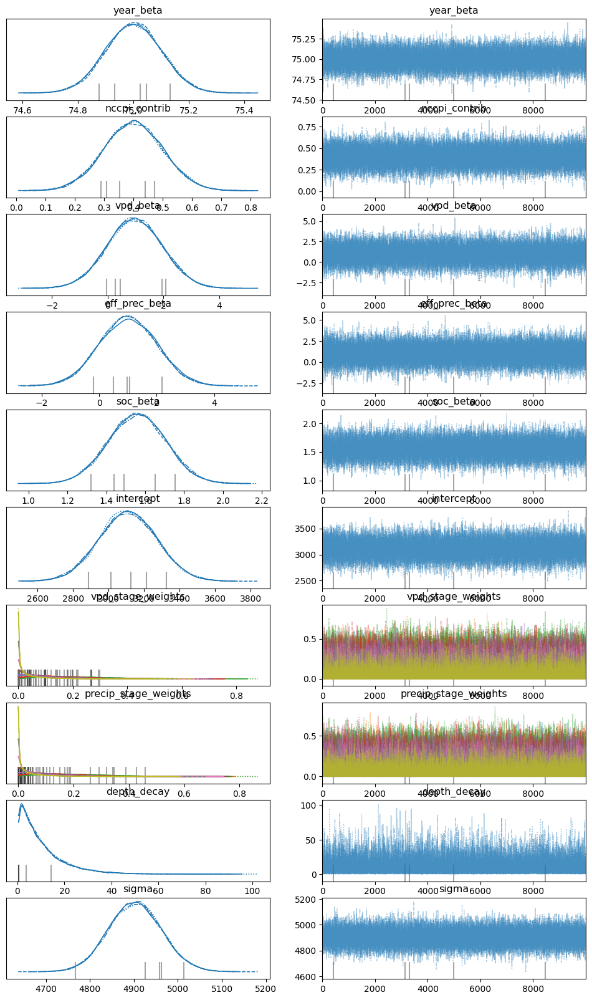

In [275]:
with hierarchical_model:
    idata = pm.sample(10000, chains=4, random_seed=42, progressbar=True)

az.plot_trace(idata)
plt.show()

testfeatures = pd.read_csv(os.path.join(os.getcwd(),'corn_inference_2023.csv'))

In [278]:
testfeatures = pd.read_csv(os.path.join(os.getcwd(),'corn_inference_2023.csv'))
testfeatures = pd.read_csv(os.path.join(os.getcwd(),'corn_inference_2023.csv'))
Geospatial_dB = pd.read_csv(os.path.join(os.getcwd(),"final_dataset","Value1_Features.csv"))
# Merge Function
def merge(Cropset):
    Cropset["Name"] = Cropset["Name"].str.title()
    Geospatial_dB["COUNTY"] = Geospatial_dB["COUNTY"].str.title()
    Cropset = Cropset.rename(columns={'Name':'COUNTY'}, inplace=False)
    final = Cropset.merge(Geospatial_dB,on="COUNTY")
    return final
merge(testfeatures)

,COUNTY,Year,DewDep_C_BOOT,DewDep_C_GRAIN_FILL,DewDep_C_HEAD_FLOWER,DewDep_C_RIPEN,DewDep_C_STEM_ELONG,DewDep_C_TILLER,ET0_sum_BOOT,ET0_sum_GRAIN_FILL,...,avg_nccpi3soy,avg_nccpi3cot,avg_nccpi3sg,avg_nccpi3all,avg_pctearthmc,avg_rootznemc,avg_rootznaws,avg_droughty,avg_pwsl1pomu,avg_musumcpct
0,Alamance,2023,5.357778,6.906349,5.319444,7.838889,5.082222,5.316940,104.148361,393.471556,...,0.435855,0.617050,0.459561,0.617840,88.424675,143.521670,199.060894,0.012187,22.639122,99.980978
1,Alexander,2023,5.828889,7.290476,5.394444,8.179630,5.485556,5.732240,97.394861,361.966583,...,0.293354,0.385079,0.351406,0.472098,85.283962,132.035746,170.383336,0.171674,13.072328,87.686572
2,Alleghany,2023,4.626667,6.090476,4.991667,7.209259,4.506667,4.317851,65.765694,185.684222,...,0.221702,0.000984,0.262063,0.332631,80.883815,136.759621,179.439736,0.157875,9.584266,84.097024
3,Anson,2023,6.306667,6.334921,4.763889,7.005556,4.945556,6.301457,146.743444,475.544833,...,0.306834,0.472124,0.367768,0.514209,83.662047,115.586744,164.694814,0.374066,18.769799,86.416230
4,Ashe,2023,5.555556,7.026984,5.394444,8.724074,5.595556,5.000000,76.919000,217.904444,...,0.161894,0.000994,0.216203,0.251782,81.736749,142.562172,190.210217,0.144625,9.112174,82.979438
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Wayne,2023,5.715556,5.398413,3.930556,6.159259,4.243333,4.857013,143.856972,431.261806,...,0.336703,0.594497,0.375503,0.598106,86.088042,147.886025,177.447924,0.202768,41.223813,89.766710
96,Wilkes,2023,5.933333,7.612698,5.472222,8.696296,5.594444,5.627505,100.190833,370.794583,...,0.223514,0.240144,0.280798,0.365746,85.004447,130.879280,168.086790,0.230010,5.236694,86.521106
97,Wilson,2023,5.944444,6.104762,4.372222,6.790741,4.306667,5.406193,141.006056,443.661694,...,0.366110,0.656043,0.391193,0.660957,83.409960,145.456999,194.227002,0.031105,44.788761,87.536712
98,Yadkin,2023,5.600000,7.425397,5.572222,8.220370,5.200000,4.869763,94.321111,368.281333,...,0.397640,0.461776,0.437723,0.561704,86.555272,143.299001,189.445561,0.051080,8.235405,87.672295


In [277]:
testfeatures.filter(regex="VPDmean_kPa*")

,VPDmean_kPa_BOOT,VPDmean_kPa_GRAIN_FILL,VPDmean_kPa_HEAD_FLOWER,VPDmean_kPa_RIPEN,VPDmean_kPa_STEM_ELONG,VPDmean_kPa_TILLER
0,0.37918,0.654700,0.375800,0.772633,0.42269,0.790082
1,0.38114,0.636886,0.365975,0.750133,0.40211,0.736910
2,0.30646,0.428814,0.287300,0.588450,0.28404,0.518877
3,0.47724,0.731143,0.400850,0.742983,0.52262,0.986836
4,0.32880,0.482257,0.299675,0.670467,0.32089,0.581746
...,...,...,...,...,...,...
95,0.45414,0.656986,0.372625,0.692800,0.45623,0.813434
96,0.39206,0.666771,0.372600,0.796133,0.40391,0.755926
97,0.44680,0.678686,0.379200,0.733733,0.44955,0.868328
98,0.38638,0.663014,0.382250,0.785400,0.41186,0.732451


# Soybean

In [282]:
totalfeatures = pd.read_csv(os.path.join(os.getcwd(),'final_dataset/Soybean.csv'))
def_delete = ['avg_musumcpcts','avg_musumcpct']
depths = ['avg_tk0_5s', 'avg_tk5_20s', 'avg_tk20_50s', 'avg_tk50_100s', 'avg_tk100_150s', 'avg_tk150_999s', 
        'avg_tk0_20s', 'avg_tk0_30s', 'avg_tk0_100s', 'avg_tk0_150s', 'avg_tk0_999s','avg_tk0_5a', 'avg_tk5_20a', 
        'avg_tk20_50a', 'avg_tk50_100a', 'avg_tk100_150a', 'avg_tk150_999a', 'avg_tk0_20a', 'avg_tk0_30a', 
        'avg_tk0_100a', 'avg_tk0_150a', 'avg_tk0_999a']
maybe_delete = ['avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 'avg_aws50_100', 'avg_aws100_150', 'avg_aws150_999',
            'avg_aws0_20', 'avg_aws0_30', 'avg_aws0_100', 'avg_aws0_150', 'avg_aws0_999',
            'avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999', 'avg_soc0_20', 
             'avg_soc0_30', 'avg_soc0_100', 'avg_soc0_150', 'avg_soc0_999']

totalfeatures.drop(columns=def_delete, inplace=True)
totalfeatures.drop(columns=depths, inplace=True)

In [284]:
# === RESPONSE VARIABLE ===
yield_array = totalfeatures["Yield"].values
print(f"✅ Yield: {yield_array.shape}")

# === YEAR DATA ===
year_array = totalfeatures["Year"].values
# Create scaled year (starting from 1)
scaledyear = year_array - year_array.min() 
print(f"✅ Year: {year_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# Corn Index
nccpi = totalfeatures["avg_nccpi3corn"].values

# Soil Organic Carbon by depth  
soc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
soc_array = totalfeatures[soc_cols].fillna(totalfeatures[soc_cols].median()).values

# === SEASONAL CLIMATE VARIABLES ===
order = ["VE","V2_V3","V4_V6","R1_R2","R3_R4","R5_R6","R7_R8"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in totalfeatures.columns]
    if available_cols:
        data = totalfeatures[available_cols].fillna(totalfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
seasonal_data = {}

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: seasonal_data["VPDmean_kPa"] = vpd_mean_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: seasonal_data["EffPrecRatio_idx"] = eff_prec_data

✅ Yield: (3096,)
✅ Year: (3096,), scaled: 0-39
✅ VPDmean_kPa: (3096, 7) (7 stages)
✅ EffPrecRatio_idx: (3096, 7) (7 stages)


In [283]:
totalfeatures.filter(regex="VPDmean_kPa*")

,VPDmean_kPa_R1_R2,VPDmean_kPa_R3_R4,VPDmean_kPa_R5_R6,VPDmean_kPa_R7_R8,VPDmean_kPa_V2_V3,VPDmean_kPa_V4_V6,VPDmean_kPa_VE
0,0.923500,1.206650,1.223333,1.01602,0.781333,0.937700,0.415625
1,0.999550,1.171550,1.298317,0.96888,0.824583,1.000900,0.461875
2,0.963400,1.324350,1.434017,1.18092,0.926944,0.989175,0.551250
3,0.716025,0.971750,1.037333,0.93944,0.725778,0.759200,0.376750
4,1.041875,1.242725,1.386467,1.22904,0.891278,1.009475,0.814375
...,...,...,...,...,...,...,...
3091,0.825350,1.033225,1.162783,0.94096,0.642972,0.702625,0.885563
3092,0.925500,1.061400,1.503333,1.49630,0.828333,0.826750,0.531563
3093,0.862275,1.060525,1.440767,1.53406,0.774444,0.839550,0.475938
3094,0.945675,1.150500,1.611983,1.61920,0.812583,0.860525,0.588125


In [286]:
import pymc as pm
import arviz as az
with pm.Model() as hierarchical_model:
    
    # === INTERCEPT ===
    intercept = pm.InverseGamma('intercept', mu=np.mean(yield_array)-100, sigma=np.std(yield_array))
    # === YEAR EFFECT ===
    year_beta = pm.Normal('year_beta', mu=75, sigma=0.1)
    year_contrib = year_beta * scaledyear
    # === LEARNABLE VT-CENTERED STAGE WEIGHTS ===
    n_stages = len(order)  # 9 stages
    vt_index = order.index("R1_R2")  # Index 2
    # NCCPI
    nccpi_contrib = pm.Normal('nccpi_contrib', mu=0.4, sigma=0.1)
    
    # Initialize around VT-centered pattern
    stage_distances = np.abs(np.arange(n_stages) - vt_index)
    init_weights = np.exp(-stage_distances * 0.3)
    init_weights = init_weights / init_weights.sum()
    
    # SEPARATE stage weights for VPD
    vpd_stage_weights = pm.Dirichlet('vpd_stage_weights', a=init_weights * 10)
    
    # SEPARATE stage weights for EffPrecRatio  
    precip_stage_weights = pm.Dirichlet('precip_stage_weights', a=init_weights * 10)

    # === VPD MEAN EFFECT (with its own learnable stage weights) ===
    if "VPDmean_kPa" in seasonal_data:
        vpd_data = seasonal_data["VPDmean_kPa"]  # (n_obs, n_stages)
        
        # Apply VPD-specific stage weights
        vpd_index = pm.math.sum(vpd_data * vpd_stage_weights[None, :], axis=1)
        
        # VPD coefficient
        vpd_beta = pm.Normal('vpd_beta', mu=1, sigma=1)
        vpd_contrib = vpd_beta * vpd_index
        
        print(f"✅ VPD Mean: {vpd_data.shape} with separate learnable stage weights")
    else:
        vpd_contrib = 0
        print("❌ No VPD data found")
    
    # === EFFECTIVE PRECIPITATION RATIO (with its own learnable stage weights) ===
    if "EffPrecRatio_idx" in seasonal_data:
        eff_prec_data = seasonal_data["EffPrecRatio_idx"]  # (n_obs, n_stages)
        
        # Apply precipitation-specific stage weights
        eff_prec_index = pm.math.sum(eff_prec_data * precip_stage_weights[None, :], axis=1)
        
        # Precipitation coefficient
        eff_prec_beta = pm.Normal('eff_prec_beta', mu=1, sigma=1)
        eff_prec_contrib = eff_prec_beta * eff_prec_index
        
        print(f"✅ Effective Precip Ratio: {eff_prec_data.shape} with separate learnable stage weights")
    else:
        eff_prec_contrib = 0
        print("❌ No Effective Precip data found")
    
    # === SOIL ORGANIC CARBON (LEARNABLE depth weighting) ===
    depths = np.array([2.5, 10, 25, 50, 75, 999])
    
    # LEARNABLE depth decay parameter
    depth_decay = pm.Exponential('depth_decay', lam=0.1)  # Prior on decay rate
    
    # Learnable depth weights (exponential decay)
    depth_weights_raw = pm.math.exp(-depth_decay * depths)
    depth_weights = depth_weights_raw / pm.math.sum(depth_weights_raw)
    
    # SOC depth-weighted index with learnable weights
    soc_index = pm.math.sum(soc_array * depth_weights[None, :], axis=1)
    soc_beta = pm.Normal('soc_beta', mu=0, sigma=1)
    soc_contrib = soc_beta * soc_index

    # === FINAL MODEL EQUATION ===
    mu = (intercept + 
          year_contrib +           # Year trend
          vpd_contrib +            # VPD (own learnable stage weights)
          eff_prec_contrib +       # Precipitation (own learnable stage weights)
          soc_contrib +            # SOC (learnable depth decay)
          nccpi_contrib*nccpi)           # Corn productivity index
    
    # === OBSERVATION MODEL ===
    sigma = pm.HalfNormal('sigma', sigma=np.std(yield_array) * 0.5)
    likelihood = pm.Normal('yield', mu=mu, sigma=sigma, observed=yield_array)

✅ VPD Mean: (3096, 7) with separate learnable stage weights
✅ Effective Precip Ratio: (3096, 7) with separate learnable stage weights


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, year_beta, nccpi_contrib, vpd_stage_weights, precip_stage_weights, vpd_beta, eff_prec_beta, depth_decay, soc_beta, sigma]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 33 seconds.
There were 61 divergences after tuning. Increase `target_accept` or reparameterize.


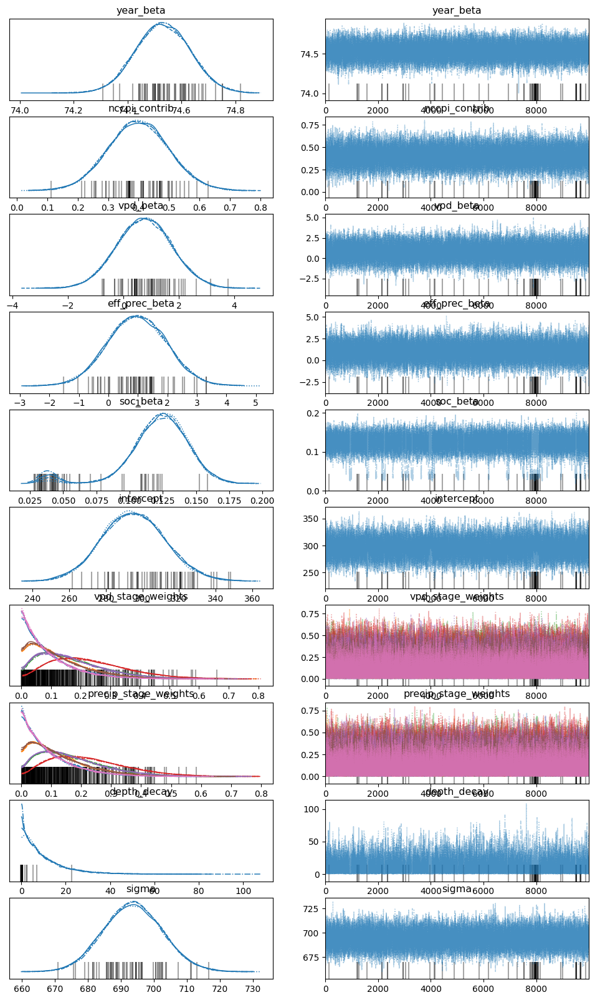

In [287]:
with hierarchical_model:
    idata = pm.sample(10000, chains=4, random_seed=42, progressbar=True)

az.plot_trace(idata)
plt.show()

In [288]:
testfeatures = pd.read_csv(os.path.join(os.getcwd(),'corn_inference_2023.csv'))
testfeatures = pd.read_csv(os.path.join(os.getcwd(),'corn_inference_2023.csv'))
Geospatial_dB = pd.read_csv(os.path.join(os.getcwd(),"final_dataset","Value1_Features.csv"))
# Merge Function
def merge(Cropset):
    Cropset["Name"] = Cropset["Name"].str.title()
    Geospatial_dB["COUNTY"] = Geospatial_dB["COUNTY"].str.title()
    Cropset = Cropset.rename(columns={'Name':'COUNTY'}, inplace=False)
    final = Cropset.merge(Geospatial_dB,on="COUNTY")
    return final
testset = merge(testfeatures)

In [ ]:
# === RESPONSE VARIABLE ===
test_yield_array = totalfeatures["Yield"].values
print(f"✅ Yield: {yield_array.shape}")

# === YEAR DATA ===
year_array = totalfeatures["Year"].values
# Create scaled year (starting from 1)
scaledyear = year_array - year_array.min() 
print(f"✅ Year: {year_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# Corn Index
nccpi = totalfeatures["avg_nccpi3corn"].values

# Soil Organic Carbon by depth  
soc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
soc_array = totalfeatures[soc_cols].fillna(totalfeatures[soc_cols].median()).values

# === SEASONAL CLIMATE VARIABLES ===
order = ["VE","V2_V3","V4_V6","R1_R2","R3_R4","R5_R6","R7_R8"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in totalfeatures.columns]
    if available_cols:
        data = totalfeatures[available_cols].fillna(totalfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
seasonal_data = {}

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: seasonal_data["VPDmean_kPa"] = vpd_mean_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: seasonal_data["EffPrecRatio_idx"] = eff_prec_data

# Soybean

In [225]:
totalfeatures = pd.read_csv(os.path.join(os.getcwd(),'final_dataset/Soybean.csv'))
def_delete = ['avg_musumcpcts','avg_musumcpct']
depths = ['avg_tk0_5s', 'avg_tk5_20s', 'avg_tk20_50s', 'avg_tk50_100s', 'avg_tk100_150s', 'avg_tk150_999s', 
        'avg_tk0_20s', 'avg_tk0_30s', 'avg_tk0_100s', 'avg_tk0_150s', 'avg_tk0_999s','avg_tk0_5a', 'avg_tk5_20a', 
        'avg_tk20_50a', 'avg_tk50_100a', 'avg_tk100_150a', 'avg_tk150_999a', 'avg_tk0_20a', 'avg_tk0_30a', 
        'avg_tk0_100a', 'avg_tk0_150a', 'avg_tk0_999a']
maybe_delete = ['avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 'avg_aws50_100', 'avg_aws100_150', 'avg_aws150_999',
            'avg_aws0_20', 'avg_aws0_30', 'avg_aws0_100', 'avg_aws0_150', 'avg_aws0_999',
            'avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999', 'avg_soc0_20', 
             'avg_soc0_30', 'avg_soc0_100', 'avg_soc0_150', 'avg_soc0_999']

totalfeatures.drop(columns=def_delete, inplace=True)
totalfeatures.drop(columns=depths, inplace=True)

In [290]:
# === RESPONSE VARIABLE ===
yield_array = totalfeatures["Yield"].values
print(f"✅ Yield: {yield_array.shape}")

# === YEAR DATA ===
year_array = totalfeatures["Year"].values
# Create scaled year (starting from 1)
scaledyear = year_array - year_array.min() 
print(f"✅ Year: {year_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# Corn Index
nccpi = totalfeatures["avg_nccpi3soy"].values

# Soil Organic Carbon by depth  
soc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
soc_array = totalfeatures[soc_cols].fillna(totalfeatures[soc_cols].median()).values

# === SEASONAL CLIMATE VARIABLES ===
order = ["VE","V2_V3","V4_V6","R1_R2","R3_R4","R5_R6","R7_R8"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in totalfeatures.columns]
    if available_cols:
        data = totalfeatures[available_cols].fillna(totalfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
seasonal_data = {}

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: seasonal_data["VPDmean_kPa"] = vpd_mean_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: seasonal_data["EffPrecRatio_idx"] = eff_prec_data

✅ Yield: (3096,)
✅ Year: (3096,), scaled: 0-39
✅ VPDmean_kPa: (3096, 7) (7 stages)
✅ EffPrecRatio_idx: (3096, 7) (7 stages)


In [289]:
totalfeatures.filter(regex="ncp*")
# seasonal_data["VPDmean_kPa"]

,avg_nccpi3corn,avg_nccpi3soy,avg_nccpi3cot,avg_nccpi3sg,avg_nccpi3all
0,0.432373,0.400977,0.596113,0.409475,0.601114
1,0.373497,0.334052,0.523670,0.400791,0.551926
2,0.387930,0.341642,0.602967,0.376664,0.607906
3,0.185277,0.183228,0.231328,0.178335,0.234881
4,0.380842,0.348467,0.612816,0.389086,0.619459
...,...,...,...,...,...
3091,0.354215,0.245280,0.003411,0.303354,0.361269
3092,0.254040,0.166789,0.001768,0.232691,0.261140
3093,0.297000,0.218444,0.342642,0.261912,0.402143
3094,0.327520,0.244354,0.387044,0.288986,0.444018


In [291]:
import pymc as pm
import arviz as az
with pm.Model() as hierarchical_model:
    
    # === INTERCEPT ===
    intercept = pm.InverseGamma('intercept', mu=np.mean(yield_array)-100, sigma=np.std(yield_array))
    # === YEAR EFFECT ===
    year_beta = pm.Normal('year_beta', mu=75, sigma=0.1)
    year_contrib = year_beta * scaledyear
    # === LEARNABLE VT-CENTERED STAGE WEIGHTS ===
    n_stages = len(order)  # 9 stages
    vt_index = order.index("R1_R2")  # Index 2
    # NCCPI
    nccpi_contrib = pm.Normal('nccpi_contrib', mu=0.4, sigma=0.1)
    
    # Initialize around VT-centered pattern
    stage_distances = np.abs(np.arange(n_stages) - vt_index)
    init_weights = np.exp(-stage_distances * 0.3)
    init_weights = init_weights / init_weights.sum()
    
    # SEPARATE stage weights for VPD
    vpd_stage_weights = pm.Dirichlet('vpd_stage_weights', a=init_weights * 10)
    
    # SEPARATE stage weights for EffPrecRatio  
    precip_stage_weights = pm.Dirichlet('precip_stage_weights', a=init_weights * 10)

    # === VPD MEAN EFFECT (with its own learnable stage weights) ===
    if "VPDmean_kPa" in seasonal_data:
        vpd_data = seasonal_data["VPDmean_kPa"]  # (n_obs, n_stages)
        
        # Apply VPD-specific stage weights
        vpd_index = pm.math.sum(vpd_data * vpd_stage_weights[None, :], axis=1)
        
        # VPD coefficient
        vpd_beta = pm.Normal('vpd_beta', mu=1, sigma=1)
        vpd_contrib = vpd_beta * vpd_index
        
        print(f"✅ VPD Mean: {vpd_data.shape} with separate learnable stage weights")
    else:
        vpd_contrib = 0
        print("❌ No VPD data found")
    
    # === EFFECTIVE PRECIPITATION RATIO (with its own learnable stage weights) ===
    if "EffPrecRatio_idx" in seasonal_data:
        eff_prec_data = seasonal_data["EffPrecRatio_idx"]  # (n_obs, n_stages)
        
        # Apply precipitation-specific stage weights
        eff_prec_index = pm.math.sum(eff_prec_data * precip_stage_weights[None, :], axis=1)
        
        # Precipitation coefficient
        eff_prec_beta = pm.Normal('eff_prec_beta', mu=1, sigma=1)
        eff_prec_contrib = eff_prec_beta * eff_prec_index
        
        print(f"✅ Effective Precip Ratio: {eff_prec_data.shape} with separate learnable stage weights")
    else:
        eff_prec_contrib = 0
        print("❌ No Effective Precip data found")
    
    # === SOIL ORGANIC CARBON (LEARNABLE depth weighting) ===
    depths = np.array([2.5, 10, 25, 50, 75, 999])
    
    # LEARNABLE depth decay parameter
    depth_decay = pm.Exponential('depth_decay', lam=0.1)  # Prior on decay rate
    
    # Learnable depth weights (exponential decay)
    depth_weights_raw = pm.math.exp(-depth_decay * depths)
    depth_weights = depth_weights_raw / pm.math.sum(depth_weights_raw)
    
    # SOC depth-weighted index with learnable weights
    soc_index = pm.math.sum(soc_array * depth_weights[None, :], axis=1)
    soc_beta = pm.Normal('soc_beta', mu=0, sigma=1)
    soc_contrib = soc_beta * soc_index

    # === FINAL MODEL EQUATION ===
    mu = (intercept + 
          year_contrib +           # Year trend
          vpd_contrib +            # VPD (own learnable stage weights)
          eff_prec_contrib +       # Precipitation (own learnable stage weights)
          soc_contrib +            # SOC (learnable depth decay)
          nccpi_contrib*nccpi)           # Corn productivity index
    
    # === OBSERVATION MODEL ===
    sigma = pm.HalfNormal('sigma', sigma=np.std(yield_array) * 0.5)
    likelihood = pm.Normal('yield', mu=mu, sigma=sigma, observed=yield_array)

✅ VPD Mean: (3096, 7) with separate learnable stage weights
✅ Effective Precip Ratio: (3096, 7) with separate learnable stage weights


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, year_beta, nccpi_contrib, vpd_stage_weights, precip_stage_weights, vpd_beta, eff_prec_beta, depth_decay, soc_beta, sigma]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 32 seconds.
There were 170 divergences after tuning. Increase `target_accept` or reparameterize.


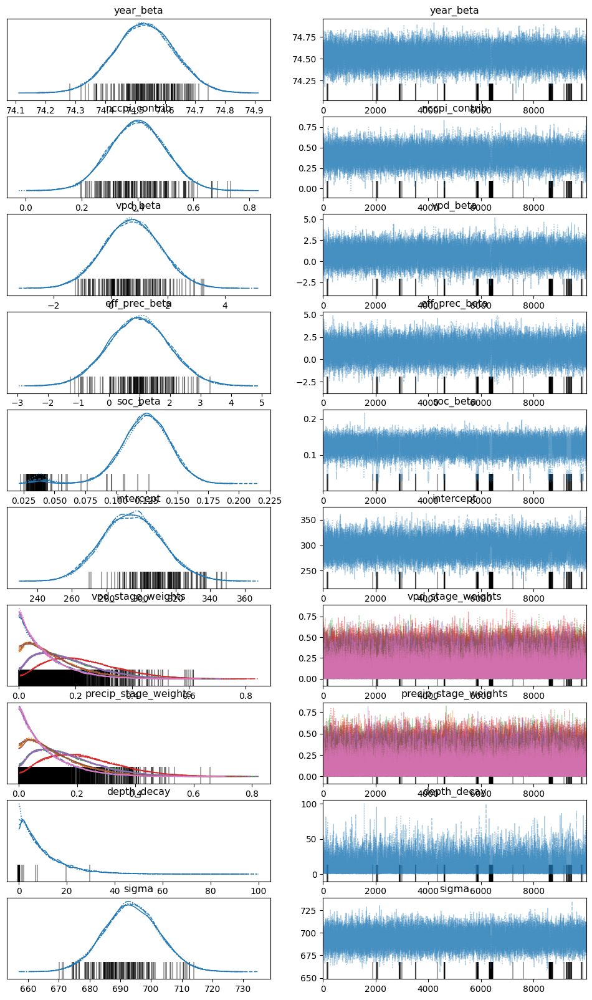

In [292]:
with hierarchical_model:
    idata = pm.sample(10000, chains=4, random_seed=42, progressbar=True)

az.plot_trace(idata)
plt.show()

In [308]:
testfeatures = pd.read_csv(os.path.join(os.getcwd(),'soybean_inference_2023.csv'))
Geospatial_dB = pd.read_csv(os.path.join(os.getcwd(),"final_dataset","Value1_Features.csv"))
# Merge Function
def merge(Cropset):
    Cropset["Name"] = Cropset["Name"].str.title()
    Geospatial_dB["COUNTY"] = Geospatial_dB["COUNTY"].str.title()
    Cropset = Cropset.rename(columns={'Name':'COUNTY'}, inplace=False)
    final = Cropset.merge(Geospatial_dB,on="COUNTY")
    return final
testfeatures = merge(testfeatures)

In [302]:
testset.filter(regex="VPDmean_kPa*")
testset["avg_nccpi3soy"]

0     0.435855
1     0.293354
2     0.221702
3     0.306834
4     0.161894
        ...   
95    0.336703
96    0.223514
97    0.366110
98    0.397640
99    0.097039
Name: avg_nccpi3soy, Length: 100, dtype: float64

In [311]:
# === RESPONSE VARIABLE ===
tyield_array = np.zeros(len(testfeatures))
print(f"✅ Yield: {tyield_array.shape}")

# === YEAR DATA ===
tyear_array = testfeatures["Year"].values
# Create scaled year (starting from 1)
tscaledyear = year_array - year_array.min() 
print(f"✅ Year: {tyear_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# Corn Index
tnccpi = testfeatures["avg_nccpi3soy"].values

# Soil Organic Carbon by depth  
tsoc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
tsoc_array = testfeatures[tsoc_cols].fillna(testfeatures[tsoc_cols].median()).values

# === SEASONAL CLIMATE VARIABLES ===
order = ["VE","V2_V3","V4_V6","R1_R2","R3_R4","R5_R6","R7_R8"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in testfeatures.columns]
    if available_cols:
        data = testfeatures[available_cols].fillna(testfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
tseasonal_data = {}

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: tseasonal_data["VPDmean_kPa"] = vpd_mean_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: tseasonal_data["EffPrecRatio_idx"] = eff_prec_data

✅ Yield: (100,)
✅ Year: (100,), scaled: 0-39
✅ VPDmean_kPa: (100, 7) (7 stages)
✅ EffPrecRatio_idx: (100, 7) (7 stages)


🔮 Making predictions on test data...
✅ Arrays replaced with test data
   Test observations: 100
   Test years: 0-39


Sampling: [yield]


✅ Predictions generated!
   Mean prediction: 1773.4 ± 693.9
   Prediction range: 328.6 - 3544.8
✅ Original arrays restored


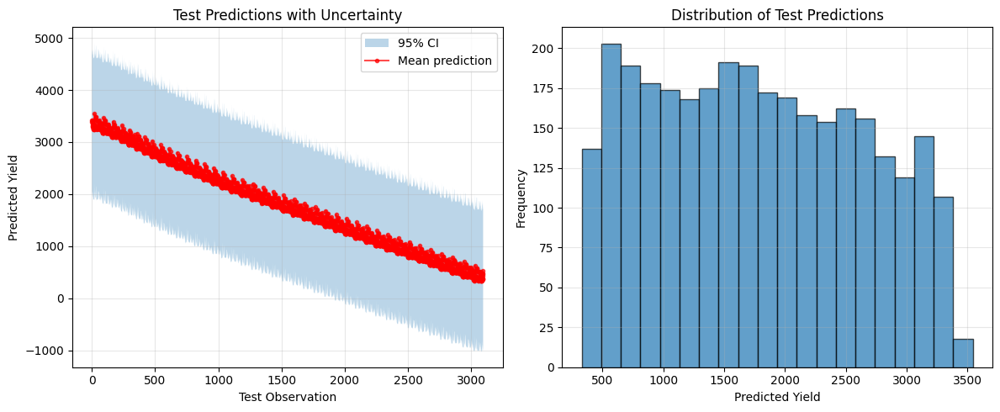

In [313]:
# === PREDICT ON TEST DATA (Direct Array Replacement) ===
print("🔮 Making predictions on test data...")

# Backup original arrays
yield_array_backup = yield_array.copy()
scaledyear_backup = scaledyear.copy() 
nccpi_backup = nccpi.copy()
soc_array_backup = soc_array.copy()
seasonal_data_backup = seasonal_data.copy()

# Replace with test data
yield_array = tyield_array
scaledyear = tscaledyear
nccpi = tnccpi
soc_array = tsoc_array
seasonal_data["VPDmean_kPa"] = tseasonal_data["VPDmean_kPa"]
seasonal_data["EffPrecRatio_idx"] = tseasonal_data["EffPrecRatio_idx"]

print("✅ Arrays replaced with test data")
print(f"   Test observations: {len(tyield_array)}")
print(f"   Test years: {tscaledyear.min()}-{tscaledyear.max()}")

# Make predictions using the hierarchical model with test data
with hierarchical_model:
    test_predictions = pm.sample_posterior_predictive(
        idata,                    # Your fitted parameters
        predictions=True,         # Generate predictions
        random_seed=42,
        progressbar=True
    )

# Extract prediction results
pred_samples = test_predictions.predictions["yield"].values  # (chains, draws, n_test_obs)
pred_mean = pred_samples.mean(axis=(0, 1))
pred_std = pred_samples.std(axis=(0, 1))
pred_lower = np.percentile(pred_samples, 2.5, axis=(0, 1))
pred_upper = np.percentile(pred_samples, 97.5, axis=(0, 1))

print(f"✅ Predictions generated!")
print(f"   Mean prediction: {pred_mean.mean():.1f} ± {pred_std.mean():.1f}")
print(f"   Prediction range: {pred_mean.min():.1f} - {pred_mean.max():.1f}")

# Restore original arrays
yield_array = yield_array_backup
scaledyear = scaledyear_backup
nccpi = nccpi_backup
soc_array = soc_array_backup
seasonal_data = seasonal_data_backup

print("✅ Original arrays restored")

# Visualize predictions
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.fill_between(range(len(pred_mean)), pred_lower, pred_upper, alpha=0.3, label='95% CI')
plt.plot(pred_mean, 'ro-', alpha=0.7, markersize=3, label='Mean prediction')
plt.xlabel('Test Observation')
plt.ylabel('Predicted Yield')
plt.title('Test Predictions with Uncertainty')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.hist(pred_mean, bins=20, alpha=0.7, edgecolor='black')
plt.xlabel('Predicted Yield')
plt.ylabel('Frequency')
plt.title('Distribution of Test Predictions')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
    

In [356]:
pred_data_cotton = pd.DataFrame({
    "crop": "Cotton",  # String value, not boolean comparison
    "yield": test_predictions.predictions["yield"].values.mean(axis=(0,1)),  # Mean predictions
    "COUNTY": testfeatures["COUNTY"].values
})

ValueError: All arrays must be of the same length

# Cotton

In [314]:
totalfeatures = pd.read_csv(os.path.join(os.getcwd(),'final_dataset/Cotton.csv'))
def_delete = ['avg_musumcpcts','avg_musumcpct']
depths = ['avg_tk0_5s', 'avg_tk5_20s', 'avg_tk20_50s', 'avg_tk50_100s', 'avg_tk100_150s', 'avg_tk150_999s', 
        'avg_tk0_20s', 'avg_tk0_30s', 'avg_tk0_100s', 'avg_tk0_150s', 'avg_tk0_999s','avg_tk0_5a', 'avg_tk5_20a', 
        'avg_tk20_50a', 'avg_tk50_100a', 'avg_tk100_150a', 'avg_tk150_999a', 'avg_tk0_20a', 'avg_tk0_30a', 
        'avg_tk0_100a', 'avg_tk0_150a', 'avg_tk0_999a']
maybe_delete = ['avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 'avg_aws50_100', 'avg_aws100_150', 'avg_aws150_999',
            'avg_aws0_20', 'avg_aws0_30', 'avg_aws0_100', 'avg_aws0_150', 'avg_aws0_999',
            'avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999', 'avg_soc0_20', 
             'avg_soc0_30', 'avg_soc0_100', 'avg_soc0_150', 'avg_soc0_999']

totalfeatures.drop(columns=def_delete, inplace=True)
totalfeatures.drop(columns=depths, inplace=True)

In [315]:
totalfeatures.filter(regex="ncp*")

,avg_nccpi3corn,avg_nccpi3soy,avg_nccpi3cot,avg_nccpi3sg,avg_nccpi3all
0,0.432373,0.400977,0.596113,0.409475,0.601114
1,0.373497,0.334052,0.523670,0.400791,0.551926
2,0.387930,0.341642,0.602967,0.376664,0.607906
3,0.185277,0.183228,0.231328,0.178335,0.234881
4,0.380842,0.348467,0.612816,0.389086,0.619459
...,...,...,...,...,...
1536,0.381661,0.300740,0.516670,0.341471,0.539153
1537,0.426583,0.353398,0.565504,0.389359,0.594794
1538,0.444466,0.357971,0.594528,0.394259,0.621765
1539,0.419718,0.363949,0.570159,0.387986,0.576974


In [316]:
# === RESPONSE VARIABLE ===
yield_array = totalfeatures["Yield"].values
print(f"✅ Yield: {yield_array.shape}")

# === YEAR DATA ===
year_array = totalfeatures["Year"].values
# Create scaled year (starting from 1)
scaledyear = year_array - year_array.min() 
print(f"✅ Year: {year_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# Corn Index
nccpi = totalfeatures["avg_nccpi3cot"].values

# Soil Organic Carbon by depth  
soc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
soc_array = totalfeatures[soc_cols].fillna(totalfeatures[soc_cols].median()).values

# === SEASONAL CLIMATE VARIABLES ===
order = ["VE","VEG","SQUARING","FLOWERING","BOLL_DEV","OPEN_MAT"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in totalfeatures.columns]
    if available_cols:
        data = totalfeatures[available_cols].fillna(totalfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
seasonal_data = {}

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: seasonal_data["VPDmean_kPa"] = vpd_mean_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: seasonal_data["EffPrecRatio_idx"] = eff_prec_data

✅ Yield: (1541,)
✅ Year: (1541,), scaled: 0-39
✅ VPDmean_kPa: (1541, 6) (6 stages)
✅ EffPrecRatio_idx: (1541, 6) (6 stages)


In [ ]:
totalfeatures.filter(regex="VPDmean_kPa*")

,VPDmean_kPa_BOLL_DEV,VPDmean_kPa_FLOWERING,VPDmean_kPa_OPEN_MAT,VPDmean_kPa_SQUARING,VPDmean_kPa_VE,VPDmean_kPa_VEG
0,1.099857,1.216567,0.962250,1.242875,0.904636,0.97182
1,1.113129,1.260083,1.000850,1.281400,0.947864,1.00436
2,1.185286,1.472167,0.992025,1.392000,0.937318,1.02256
3,1.064286,1.065700,0.943050,1.004775,0.755682,0.74962
4,1.254486,1.373033,1.054713,1.239050,0.968500,1.02314
...,...,...,...,...,...,...
1536,1.534786,1.696033,0.813888,1.208725,0.778727,1.04172
1537,1.637886,1.768533,1.012763,1.244800,0.879773,1.17420
1538,1.552243,1.703750,0.871762,1.214600,0.860182,1.07610
1539,1.651686,1.711650,1.004050,1.237325,0.992727,1.19928


In [317]:
import pymc as pm
import arviz as az
with pm.Model() as hierarchical_model:
    
    # === INTERCEPT ===
    intercept = pm.InverseGamma('intercept', mu=np.mean(yield_array)-100, sigma=np.std(yield_array))
    # === YEAR EFFECT ===
    year_beta = pm.Normal('year_beta', mu=75, sigma=0.1)
    year_contrib = year_beta * scaledyear
    # === LEARNABLE VT-CENTERED STAGE WEIGHTS ===
    n_stages = len(order)  # 9 stages
    vt_index = order.index("FLOWERING")  # Index 2
    # NCCPI
    nccpi_contrib = pm.Normal('nccpi_contrib', mu=0.4, sigma=0.1)
    
    # Initialize around VT-centered pattern
    stage_distances = np.abs(np.arange(n_stages) - vt_index)
    init_weights = np.exp(-stage_distances * 0.3)
    init_weights = init_weights / init_weights.sum()
    
    # SEPARATE stage weights for VPD
    vpd_stage_weights = pm.Dirichlet('vpd_stage_weights', a=init_weights * 10)
    
    # SEPARATE stage weights for EffPrecRatio  
    precip_stage_weights = pm.Dirichlet('precip_stage_weights', a=init_weights * 10)

    # === VPD MEAN EFFECT (with its own learnable stage weights) ===
    if "VPDmean_kPa" in seasonal_data:
        vpd_data = seasonal_data["VPDmean_kPa"]  # (n_obs, n_stages)
        
        # Apply VPD-specific stage weights
        vpd_index = pm.math.sum(vpd_data * vpd_stage_weights[None, :], axis=1)
        
        # VPD coefficient
        vpd_beta = pm.Normal('vpd_beta', mu=1, sigma=1)
        vpd_contrib = vpd_beta * vpd_index
        
        print(f"✅ VPD Mean: {vpd_data.shape} with separate learnable stage weights")
    else:
        vpd_contrib = 0
        print("❌ No VPD data found")
    
    # === EFFECTIVE PRECIPITATION RATIO (with its own learnable stage weights) ===
    if "EffPrecRatio_idx" in seasonal_data:
        eff_prec_data = seasonal_data["EffPrecRatio_idx"]  # (n_obs, n_stages)
        
        # Apply precipitation-specific stage weights
        eff_prec_index = pm.math.sum(eff_prec_data * precip_stage_weights[None, :], axis=1)
        
        # Precipitation coefficient
        eff_prec_beta = pm.Normal('eff_prec_beta', mu=1, sigma=1)
        eff_prec_contrib = eff_prec_beta * eff_prec_index
        
        print(f"✅ Effective Precip Ratio: {eff_prec_data.shape} with separate learnable stage weights")
    else:
        eff_prec_contrib = 0
        print("❌ No Effective Precip data found")
    
    # === SOIL ORGANIC CARBON (LEARNABLE depth weighting) ===
    depths = np.array([2.5, 10, 25, 50, 75, 999])
    
    # LEARNABLE depth decay parameter
    depth_decay = pm.Exponential('depth_decay', lam=0.1)  # Prior on decay rate
    
    # Learnable depth weights (exponential decay)
    depth_weights_raw = pm.math.exp(-depth_decay * depths)
    depth_weights = depth_weights_raw / pm.math.sum(depth_weights_raw)
    
    # SOC depth-weighted index with learnable weights
    soc_index = pm.math.sum(soc_array * depth_weights[None, :], axis=1)
    soc_beta = pm.Normal('soc_beta', mu=0, sigma=1)
    soc_contrib = soc_beta * soc_index

    # === FINAL MODEL EQUATION ===
    mu = (intercept + 
          year_contrib +           # Year trend
          vpd_contrib +            # VPD (own learnable stage weights)
          eff_prec_contrib +       # Precipitation (own learnable stage weights)
          soc_contrib +            # SOC (learnable depth decay)
          nccpi_contrib*nccpi)           # Corn productivity index
    
    # === OBSERVATION MODEL ===
    sigma = pm.HalfNormal('sigma', sigma=np.std(yield_array) * 0.5)
    likelihood = pm.Normal('yield', mu=mu, sigma=sigma, observed=yield_array)

✅ VPD Mean: (1541, 6) with separate learnable stage weights
✅ Effective Precip Ratio: (1541, 6) with separate learnable stage weights


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, year_beta, nccpi_contrib, vpd_stage_weights, precip_stage_weights, vpd_beta, eff_prec_beta, depth_decay, soc_beta, sigma]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 18 seconds.
There were 458 divergences after tuning. Increase `target_accept` or reparameterize.


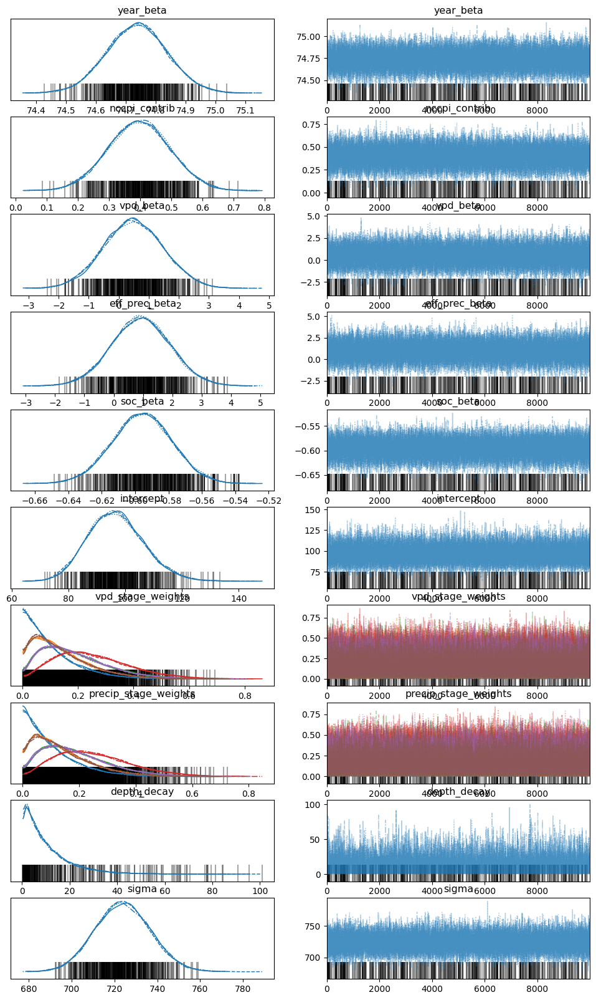

In [318]:
with hierarchical_model:
    idata = pm.sample(10000, chains=4, random_seed=42, progressbar=True)

az.plot_trace(idata)
plt.show()

In [319]:
testfeatures = pd.read_csv(os.path.join(os.getcwd(),'cotton_inference_2023.csv'))
Geospatial_dB = pd.read_csv(os.path.join(os.getcwd(),"final_dataset","Value1_Features.csv"))
# Merge Function
def merge(Cropset):
    Cropset["Name"] = Cropset["Name"].str.title()
    Geospatial_dB["COUNTY"] = Geospatial_dB["COUNTY"].str.title()
    Cropset = Cropset.rename(columns={'Name':'COUNTY'}, inplace=False)
    final = Cropset.merge(Geospatial_dB,on="COUNTY")
    return final
testfeatures = merge(testfeatures)

In [323]:
# === RESPONSE VARIABLE ===
tyield_array = np.zeros(len(testfeatures))
print(f"✅ Yield: {tyield_array.shape}")

# === YEAR DATA ===
tyear_array = testfeatures["Year"].values
# Create scaled year (starting from 1)
tscaledyear = year_array - year_array.min() 
print(f"✅ Year: {tyear_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# Corn Index
tnccpi = testfeatures["avg_nccpi3cot"].values

# Soil Organic Carbon by depth  
tsoc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
tsoc_array = testfeatures[tsoc_cols].fillna(testfeatures[tsoc_cols].median()).values

# === SEASONAL CLIMATE VARIABLES ===
order = ["VE","V2_V3","V4_V6","R1_R2","R3_R4","R5_R6","R7_R8"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in testfeatures.columns]
    if available_cols:
        data = testfeatures[available_cols].fillna(testfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
tseasonal_data = {}

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: tseasonal_data["VPDmean_kPa"] = vpd_mean_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: tseasonal_data["EffPrecRatio_idx"] = eff_prec_data

✅ Yield: (100,)
✅ Year: (100,), scaled: 0-39
✅ VPDmean_kPa: (100, 1) (1 stages)
✅ EffPrecRatio_idx: (100, 1) (1 stages)


Sampling: [yield]


🔮 Making predictions on test data...
✅ Arrays replaced with test data
   Test observations: 100
   Test years: 0-39


✅ Predictions generated!
   Mean prediction: 834.3 ± 724.2
   Prediction range: -1250.0 - 2796.2
✅ Original arrays restored


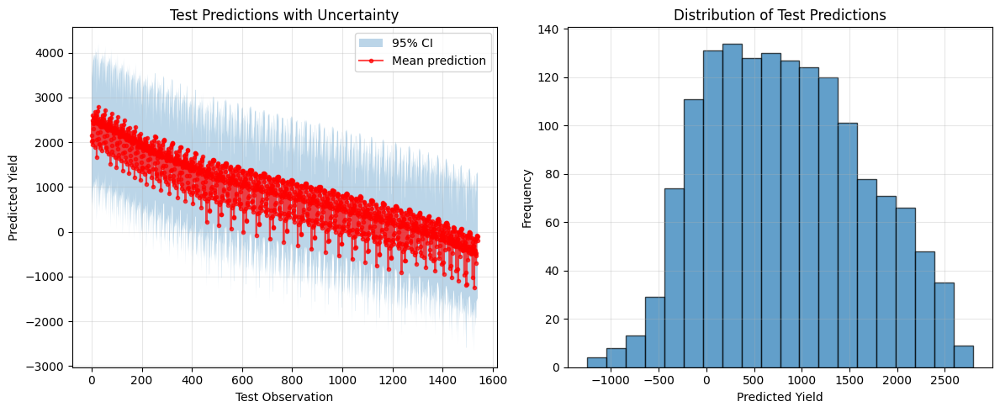

In [324]:
# === PREDICT ON TEST DATA (Direct Array Replacement) ===
print("🔮 Making predictions on test data...")

# Backup original arrays
yield_array_backup = yield_array.copy()
scaledyear_backup = scaledyear.copy() 
nccpi_backup = nccpi.copy()
soc_array_backup = soc_array.copy()
seasonal_data_backup = seasonal_data.copy()

# Replace with test data
yield_array = tyield_array
scaledyear = tscaledyear
nccpi = tnccpi
soc_array = tsoc_array
seasonal_data["VPDmean_kPa"] = tseasonal_data["VPDmean_kPa"]
seasonal_data["EffPrecRatio_idx"] = tseasonal_data["EffPrecRatio_idx"]

print("✅ Arrays replaced with test data")
print(f"   Test observations: {len(tyield_array)}")
print(f"   Test years: {tscaledyear.min()}-{tscaledyear.max()}")

# Make predictions using the hierarchical model with test data
with hierarchical_model:
    test_predictions = pm.sample_posterior_predictive(
        idata,                    # Your fitted parameters
        predictions=True,         # Generate predictions
        random_seed=42,
        progressbar=True
    )

# Extract prediction results
pred_samples = test_predictions.predictions["yield"].values  # (chains, draws, n_test_obs)
pred_mean = pred_samples.mean(axis=(0, 1))
pred_std = pred_samples.std(axis=(0, 1))
pred_lower = np.percentile(pred_samples, 2.5, axis=(0, 1))
pred_upper = np.percentile(pred_samples, 97.5, axis=(0, 1))

print(f"✅ Predictions generated!")
print(f"   Mean prediction: {pred_mean.mean():.1f} ± {pred_std.mean():.1f}")
print(f"   Prediction range: {pred_mean.min():.1f} - {pred_mean.max():.1f}")

# Restore original arrays
yield_array = yield_array_backup
scaledyear = scaledyear_backup
nccpi = nccpi_backup
soc_array = soc_array_backup
seasonal_data = seasonal_data_backup

print("✅ Original arrays restored")

# Visualize predictions
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.fill_between(range(len(pred_mean)), pred_lower, pred_upper, alpha=0.3, label='95% CI')
plt.plot(pred_mean, 'ro-', alpha=0.7, markersize=3, label='Mean prediction')
plt.xlabel('Test Observation')
plt.ylabel('Predicted Yield')
plt.title('Test Predictions with Uncertainty')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.hist(pred_mean, bins=20, alpha=0.7, edgecolor='black')
plt.xlabel('Predicted Yield')
plt.ylabel('Frequency')
plt.title('Distribution of Test Predictions')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
    

# Wheat

In [328]:
totalfeatures = pd.read_csv(os.path.join(os.getcwd(),'final_dataset/Wheat.csv'))
def_delete = ['avg_musumcpcts','avg_musumcpct']
depths = ['avg_tk0_5s', 'avg_tk5_20s', 'avg_tk20_50s', 'avg_tk50_100s', 'avg_tk100_150s', 'avg_tk150_999s', 
        'avg_tk0_20s', 'avg_tk0_30s', 'avg_tk0_100s', 'avg_tk0_150s', 'avg_tk0_999s','avg_tk0_5a', 'avg_tk5_20a', 
        'avg_tk20_50a', 'avg_tk50_100a', 'avg_tk100_150a', 'avg_tk150_999a', 'avg_tk0_20a', 'avg_tk0_30a', 
        'avg_tk0_100a', 'avg_tk0_150a', 'avg_tk0_999a']
maybe_delete = ['avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 'avg_aws50_100', 'avg_aws100_150', 'avg_aws150_999',
            'avg_aws0_20', 'avg_aws0_30', 'avg_aws0_100', 'avg_aws0_150', 'avg_aws0_999',
            'avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999', 'avg_soc0_20', 
             'avg_soc0_30', 'avg_soc0_100', 'avg_soc0_150', 'avg_soc0_999']

totalfeatures.drop(columns=def_delete, inplace=True)
totalfeatures.drop(columns=depths, inplace=True)

In [325]:
totalfeatures.filter(regex="ncp*")

,avg_nccpi3corn,avg_nccpi3soy,avg_nccpi3cot,avg_nccpi3sg,avg_nccpi3all
0,0.432373,0.400977,0.596113,0.409475,0.601114
1,0.373497,0.334052,0.523670,0.400791,0.551926
2,0.387930,0.341642,0.602967,0.376664,0.607906
3,0.185277,0.183228,0.231328,0.178335,0.234881
4,0.380842,0.348467,0.612816,0.389086,0.619459
...,...,...,...,...,...
1536,0.381661,0.300740,0.516670,0.341471,0.539153
1537,0.426583,0.353398,0.565504,0.389359,0.594794
1538,0.444466,0.357971,0.594528,0.394259,0.621765
1539,0.419718,0.363949,0.570159,0.387986,0.576974


In [329]:
# === RESPONSE VARIABLE ===
yield_array = totalfeatures["Yield"].values
print(f"✅ Yield: {yield_array.shape}")

# === YEAR DATA ===
year_array = totalfeatures["Year"].values
# Create scaled year (starting from 1)
scaledyear = year_array - year_array.min() 
print(f"✅ Year: {year_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# Corn Index
nccpi = totalfeatures["avg_nccpi3sg"].values

# Soil Organic Carbon by depth  
soc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
soc_array = totalfeatures[soc_cols].fillna(totalfeatures[soc_cols].median()).values

# === SEASONAL CLIMATE VARIABLES ===
order = ["TILLER","STEM_ELONG","BOOT","HEAD_FLOWER","GRAIN_FILL","RIPEN"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in totalfeatures.columns]
    if available_cols:
        data = totalfeatures[available_cols].fillna(totalfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
seasonal_data = {}

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: seasonal_data["VPDmean_kPa"] = vpd_mean_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: seasonal_data["EffPrecRatio_idx"] = eff_prec_data

✅ Yield: (2836,)
✅ Year: (2836,), scaled: 0-38
✅ VPDmean_kPa: (2836, 6) (6 stages)
✅ EffPrecRatio_idx: (2836, 6) (6 stages)


In [330]:
totalfeatures.filter(regex="VPDmean_kPa*")

,VPDmean_kPa_BOOT,VPDmean_kPa_GRAIN_FILL,VPDmean_kPa_HEAD_FLOWER,VPDmean_kPa_RIPEN,VPDmean_kPa_STEM_ELONG,VPDmean_kPa_TILLER
0,0.41114,0.574800,0.363575,0.833750,0.49471,0.834934
1,0.51322,0.638743,0.405625,0.924833,0.57669,0.885033
2,0.46410,0.651857,0.369525,0.971267,0.55545,0.946582
3,0.45460,0.620743,0.384600,0.882600,0.56613,0.948893
4,0.50560,0.634271,0.392275,0.895917,0.56841,0.859820
...,...,...,...,...,...,...
2831,0.35092,0.547614,0.392875,0.666200,0.46900,0.900779
2832,0.28508,0.382014,0.314250,0.484400,0.40185,0.736066
2833,0.34958,0.521714,0.391400,0.635067,0.46394,0.850057
2834,0.36462,0.543557,0.404525,0.657750,0.46707,0.816787


In [331]:
import pymc as pm
import arviz as az
with pm.Model() as hierarchical_model:
    
    # === INTERCEPT ===
    intercept = pm.InverseGamma('intercept', mu=np.mean(yield_array)-100, sigma=np.std(yield_array))
    # === YEAR EFFECT ===
    year_beta = pm.Normal('year_beta', mu=75, sigma=0.1)
    year_contrib = year_beta * scaledyear
    # === LEARNABLE VT-CENTERED STAGE WEIGHTS ===
    n_stages = len(order)  # 9 stages
    vt_index = order.index("HEAD_FLOWER")  # Index 2
    # NCCPI
    nccpi_contrib = pm.Normal('nccpi_contrib', mu=0.4, sigma=0.1)
    
    # Initialize around VT-centered pattern
    stage_distances = np.abs(np.arange(n_stages) - vt_index)
    init_weights = np.exp(-stage_distances * 0.3)
    init_weights = init_weights / init_weights.sum()
    
    # SEPARATE stage weights for VPD
    vpd_stage_weights = pm.Dirichlet('vpd_stage_weights', a=init_weights * 10)
    
    # SEPARATE stage weights for EffPrecRatio  
    precip_stage_weights = pm.Dirichlet('precip_stage_weights', a=init_weights * 10)

    # === VPD MEAN EFFECT (with its own learnable stage weights) ===
    if "VPDmean_kPa" in seasonal_data:
        vpd_data = seasonal_data["VPDmean_kPa"]  # (n_obs, n_stages)
        
        # Apply VPD-specific stage weights
        vpd_index = pm.math.sum(vpd_data * vpd_stage_weights[None, :], axis=1)
        
        # VPD coefficient
        vpd_beta = pm.Normal('vpd_beta', mu=1, sigma=1)
        vpd_contrib = vpd_beta * vpd_index
        
        print(f"✅ VPD Mean: {vpd_data.shape} with separate learnable stage weights")
    else:
        vpd_contrib = 0
        print("❌ No VPD data found")
    
    # === EFFECTIVE PRECIPITATION RATIO (with its own learnable stage weights) ===
    if "EffPrecRatio_idx" in seasonal_data:
        eff_prec_data = seasonal_data["EffPrecRatio_idx"]  # (n_obs, n_stages)
        
        # Apply precipitation-specific stage weights
        eff_prec_index = pm.math.sum(eff_prec_data * precip_stage_weights[None, :], axis=1)
        
        # Precipitation coefficient
        eff_prec_beta = pm.Normal('eff_prec_beta', mu=1, sigma=1)
        eff_prec_contrib = eff_prec_beta * eff_prec_index
        
        print(f"✅ Effective Precip Ratio: {eff_prec_data.shape} with separate learnable stage weights")
    else:
        eff_prec_contrib = 0
        print("❌ No Effective Precip data found")
    
    # === SOIL ORGANIC CARBON (LEARNABLE depth weighting) ===
    depths = np.array([2.5, 10, 25, 50, 75, 999])
    
    # LEARNABLE depth decay parameter
    depth_decay = pm.Exponential('depth_decay', lam=0.1)  # Prior on decay rate
    
    # Learnable depth weights (exponential decay)
    depth_weights_raw = pm.math.exp(-depth_decay * depths)
    depth_weights = depth_weights_raw / pm.math.sum(depth_weights_raw)
    
    # SOC depth-weighted index with learnable weights
    soc_index = pm.math.sum(soc_array * depth_weights[None, :], axis=1)
    soc_beta = pm.Normal('soc_beta', mu=0, sigma=1)
    soc_contrib = soc_beta * soc_index

    # === FINAL MODEL EQUATION ===
    mu = (intercept + 
          year_contrib +           # Year trend
          vpd_contrib +            # VPD (own learnable stage weights)
          eff_prec_contrib +       # Precipitation (own learnable stage weights)
          soc_contrib +            # SOC (learnable depth decay)
          nccpi_contrib*nccpi)           # Corn productivity index
    
    # === OBSERVATION MODEL ===
    sigma = pm.HalfNormal('sigma', sigma=np.std(yield_array) * 0.5)
    likelihood = pm.Normal('yield', mu=mu, sigma=sigma, observed=yield_array)

✅ VPD Mean: (2836, 6) with separate learnable stage weights
✅ Effective Precip Ratio: (2836, 6) with separate learnable stage weights


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, year_beta, nccpi_contrib, vpd_stage_weights, precip_stage_weights, vpd_beta, eff_prec_beta, depth_decay, soc_beta, sigma]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 28 seconds.


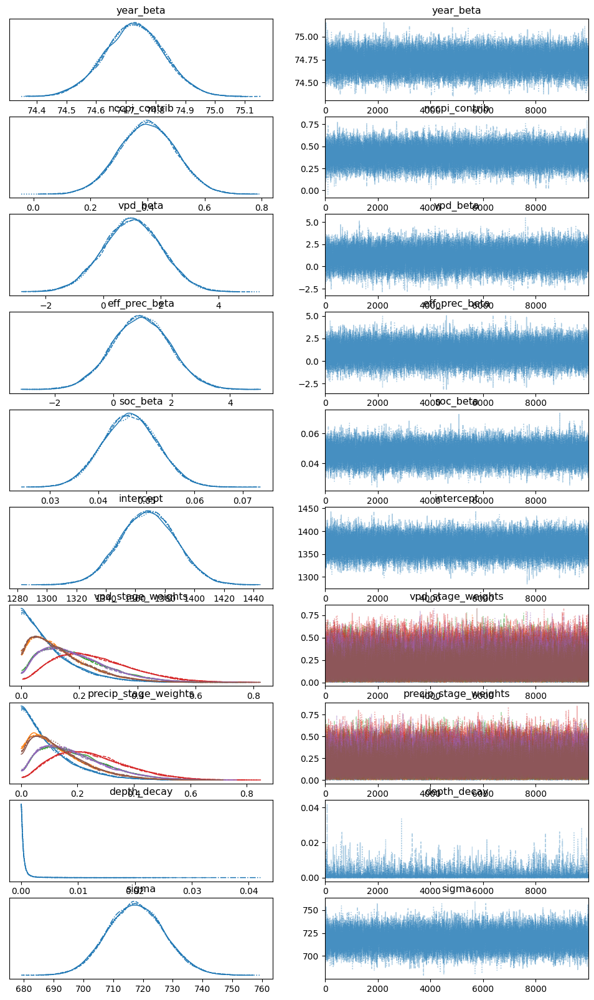

In [332]:
with hierarchical_model:
    idata = pm.sample(10000, chains=4, random_seed=42, progressbar=True)

az.plot_trace(idata)
plt.show()

In [333]:
testfeatures = pd.read_csv(os.path.join(os.getcwd(),'wheat_inference_2023.csv'))
Geospatial_dB = pd.read_csv(os.path.join(os.getcwd(),"final_dataset","Value1_Features.csv"))
# Merge Function
def merge(Cropset):
    Cropset["Name"] = Cropset["Name"].str.title()
    Geospatial_dB["COUNTY"] = Geospatial_dB["COUNTY"].str.title()
    Cropset = Cropset.rename(columns={'Name':'COUNTY'}, inplace=False)
    final = Cropset.merge(Geospatial_dB,on="COUNTY")
    return final
testfeatures = merge(testfeatures)

In [336]:
# === RESPONSE VARIABLE ===
tyield_array = np.zeros(len(testfeatures))
print(f"✅ Yield: {tyield_array.shape}")

# === YEAR DATA ===
tyear_array = testfeatures["Year"].values
# Create scaled year (starting from 1)
tscaledyear = year_array - year_array.min() 
print(f"✅ Year: {tyear_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# Corn Index
tnccpi = testfeatures["avg_nccpi3cot"].values

# Soil Organic Carbon by depth  
tsoc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
tsoc_array = testfeatures[tsoc_cols].fillna(testfeatures[tsoc_cols].median()).values

# === SEASONAL CLIMATE VARIABLES ===
order = ["TILLER","STEM_ELONG","BOOT","HEAD_FLOWER","GRAIN_FILL","RIPEN"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in testfeatures.columns]
    if available_cols:
        data = testfeatures[available_cols].fillna(testfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
tseasonal_data = {}

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: tseasonal_data["VPDmean_kPa"] = vpd_mean_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: tseasonal_data["EffPrecRatio_idx"] = eff_prec_data

✅ Yield: (100,)
✅ Year: (100,), scaled: 0-38
✅ VPDmean_kPa: (100, 6) (6 stages)
✅ EffPrecRatio_idx: (100, 6) (6 stages)


Sampling: [yield]


🔮 Making predictions on test data...
✅ Arrays replaced with test data
   Test observations: 100
   Test years: 0-38


✅ Predictions generated!
   Mean prediction: 2792.2 ± 718.0
   Prediction range: 1386.8 - 4817.4
✅ Original arrays restored


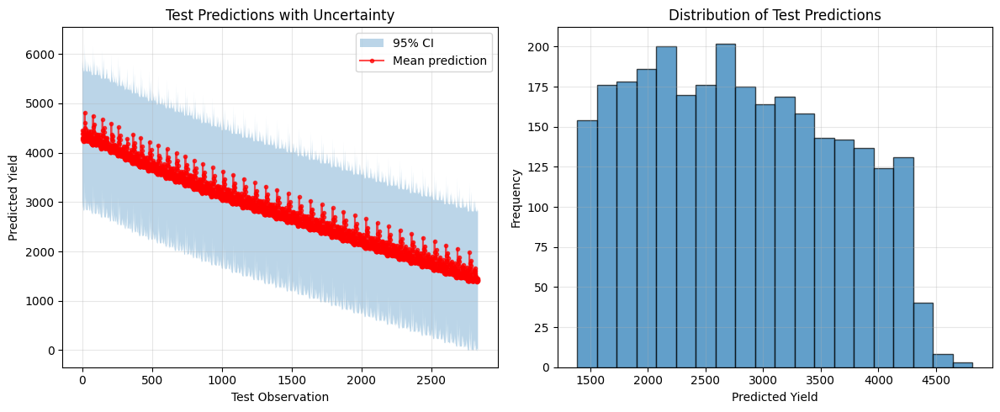

In [337]:
# === PREDICT ON TEST DATA (Direct Array Replacement) ===
print("🔮 Making predictions on test data...")

# Backup original arrays
yield_array_backup = yield_array.copy()
scaledyear_backup = scaledyear.copy() 
nccpi_backup = nccpi.copy()
soc_array_backup = soc_array.copy()
seasonal_data_backup = seasonal_data.copy()

# Replace with test data
yield_array = tyield_array
scaledyear = tscaledyear
nccpi = tnccpi
soc_array = tsoc_array
seasonal_data["VPDmean_kPa"] = tseasonal_data["VPDmean_kPa"]
seasonal_data["EffPrecRatio_idx"] = tseasonal_data["EffPrecRatio_idx"]

print("✅ Arrays replaced with test data")
print(f"   Test observations: {len(tyield_array)}")
print(f"   Test years: {tscaledyear.min()}-{tscaledyear.max()}")

# Make predictions using the hierarchical model with test data
with hierarchical_model:
    test_predictions = pm.sample_posterior_predictive(
        idata,                    # Your fitted parameters
        predictions=True,         # Generate predictions
        random_seed=42,
        progressbar=True
    )

# Extract prediction results
pred_samples = test_predictions.predictions["yield"].values  # (chains, draws, n_test_obs)
pred_mean = pred_samples.mean(axis=(0, 1))
pred_std = pred_samples.std(axis=(0, 1))
pred_lower = np.percentile(pred_samples, 2.5, axis=(0, 1))
pred_upper = np.percentile(pred_samples, 97.5, axis=(0, 1))

print(f"✅ Predictions generated!")
print(f"   Mean prediction: {pred_mean.mean():.1f} ± {pred_std.mean():.1f}")
print(f"   Prediction range: {pred_mean.min():.1f} - {pred_mean.max():.1f}")

# Restore original arrays
yield_array = yield_array_backup
scaledyear = scaledyear_backup
nccpi = nccpi_backup
soc_array = soc_array_backup
seasonal_data = seasonal_data_backup

print("✅ Original arrays restored")

# Visualize predictions
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.fill_between(range(len(pred_mean)), pred_lower, pred_upper, alpha=0.3, label='95% CI')
plt.plot(pred_mean, 'ro-', alpha=0.7, markersize=3, label='Mean prediction')
plt.xlabel('Test Observation')
plt.ylabel('Predicted Yield')
plt.title('Test Predictions with Uncertainty')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.hist(pred_mean, bins=20, alpha=0.7, edgecolor='black')
plt.xlabel('Predicted Yield')
plt.ylabel('Frequency')
plt.title('Distribution of Test Predictions')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
    

In [343]:
totalfeatures = pd.read_csv(os.path.join(os.getcwd(),'final_dataset/Peanut.csv'))
def_delete = ['avg_musumcpcts','avg_musumcpct']
depths = ['avg_tk0_5s', 'avg_tk5_20s', 'avg_tk20_50s', 'avg_tk50_100s', 'avg_tk100_150s', 'avg_tk150_999s', 
        'avg_tk0_20s', 'avg_tk0_30s', 'avg_tk0_100s', 'avg_tk0_150s', 'avg_tk0_999s','avg_tk0_5a', 'avg_tk5_20a', 
        'avg_tk20_50a', 'avg_tk50_100a', 'avg_tk100_150a', 'avg_tk150_999a', 'avg_tk0_20a', 'avg_tk0_30a', 
        'avg_tk0_100a', 'avg_tk0_150a', 'avg_tk0_999a']
maybe_delete = ['avg_aws0_5', 'avg_aws5_20', 'avg_aws20_50', 'avg_aws50_100', 'avg_aws100_150', 'avg_aws150_999',
            'avg_aws0_20', 'avg_aws0_30', 'avg_aws0_100', 'avg_aws0_150', 'avg_aws0_999',
            'avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999', 'avg_soc0_20', 
             'avg_soc0_30', 'avg_soc0_100', 'avg_soc0_150', 'avg_soc0_999']

totalfeatures.drop(columns=def_delete, inplace=True)
totalfeatures.drop(columns=depths, inplace=True)

In [ ]:
totalfeatures.columns

Index(['Unnamed: 0', 'Year', 'COUNTY', 'Commodity', 'Yield', 'DewDep_C_BOOT',
       'DewDep_C_GRAIN_FILL', 'DewDep_C_HEAD_FLOWER', 'DewDep_C_RIPEN',
       'DewDep_C_STEM_ELONG',
       ...
       'avg_nccpi3corn', 'avg_nccpi3soy', 'avg_nccpi3cot', 'avg_nccpi3sg',
       'avg_nccpi3all', 'avg_pctearthmc', 'avg_rootznemc', 'avg_rootznaws',
       'avg_droughty', 'avg_pwsl1pomu'],
      dtype='object', length=140)

In [344]:
# === RESPONSE VARIABLE ===
yield_array = totalfeatures["Yield"].values
print(f"✅ Yield: {yield_array.shape}")

# === YEAR DATA ===
year_array = totalfeatures["Year"].values
# Create scaled year (starting from 1)
scaledyear = year_array - year_array.min() 
print(f"✅ Year: {year_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# Corn Index
nccpi = totalfeatures["avg_nccpi3all"].values

# Soil Organic Carbon by depth  
soc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
soc_array = totalfeatures[soc_cols].fillna(totalfeatures[soc_cols].median()).values

# === SEASONAL CLIMATE VARIABLES ===
order = ["VE","VEG","PEG","POD_SET","SEED_FILL","MATURITY"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in totalfeatures.columns]
    if available_cols:
        data = totalfeatures[available_cols].fillna(totalfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
seasonal_data = {}

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: seasonal_data["VPDmean_kPa"] = vpd_mean_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: seasonal_data["EffPrecRatio_idx"] = eff_prec_data

✅ Yield: (938,)
✅ Year: (938,), scaled: 0-39
✅ VPDmean_kPa: (938, 6) (6 stages)
✅ EffPrecRatio_idx: (938, 6) (6 stages)


In [ ]:
totalfeatures.filter(regex="VPDmean_kPa*")

,VPDmean_kPa_BOOT,VPDmean_kPa_GRAIN_FILL,VPDmean_kPa_HEAD_FLOWER,VPDmean_kPa_RIPEN,VPDmean_kPa_STEM_ELONG,VPDmean_kPa_TILLER
0,0.41114,0.574800,0.363575,0.833750,0.49471,0.834934
1,0.51322,0.638743,0.405625,0.924833,0.57669,0.885033
2,0.46410,0.651857,0.369525,0.971267,0.55545,0.946582
3,0.45460,0.620743,0.384600,0.882600,0.56613,0.948893
4,0.50560,0.634271,0.392275,0.895917,0.56841,0.859820
...,...,...,...,...,...,...
2831,0.35092,0.547614,0.392875,0.666200,0.46900,0.900779
2832,0.28508,0.382014,0.314250,0.484400,0.40185,0.736066
2833,0.34958,0.521714,0.391400,0.635067,0.46394,0.850057
2834,0.36462,0.543557,0.404525,0.657750,0.46707,0.816787


In [345]:
import pymc as pm
import arviz as az
with pm.Model() as hierarchical_model:
    
    # === INTERCEPT ===
    intercept = pm.InverseGamma('intercept', mu=np.mean(yield_array)-100, sigma=np.std(yield_array))
    # === YEAR EFFECT ===
    year_beta = pm.Normal('year_beta', mu=10, sigma=0.1)
    year_contrib = year_beta * scaledyear
    # === LEARNABLE VT-CENTERED STAGE WEIGHTS ===
    n_stages = len(order)  # 9 stages
    vt_index = order.index("POD_SET")  # Index 2
    # NCCPI
    nccpi_contrib = pm.Normal('nccpi_contrib', mu=0.4, sigma=0.1)
    
    # Initialize around VT-centered pattern
    stage_distances = np.abs(np.arange(n_stages) - vt_index)
    init_weights = np.exp(-stage_distances * 0.3)
    init_weights = init_weights / init_weights.sum()
    
    # SEPARATE stage weights for VPD
    vpd_stage_weights = pm.Dirichlet('vpd_stage_weights', a=init_weights * 10)
    
    # SEPARATE stage weights for EffPrecRatio  
    precip_stage_weights = pm.Dirichlet('precip_stage_weights', a=init_weights * 10)

    # === VPD MEAN EFFECT (with its own learnable stage weights) ===
    if "VPDmean_kPa" in seasonal_data:
        vpd_data = seasonal_data["VPDmean_kPa"]  # (n_obs, n_stages)
        
        # Apply VPD-specific stage weights
        vpd_index = pm.math.sum(vpd_data * vpd_stage_weights[None, :], axis=1)
        
        # VPD coefficient
        vpd_beta = pm.Normal('vpd_beta', mu=1, sigma=1)
        vpd_contrib = vpd_beta * vpd_index
        
        print(f"✅ VPD Mean: {vpd_data.shape} with separate learnable stage weights")
    else:
        vpd_contrib = 0
        print("❌ No VPD data found")
    
    # === EFFECTIVE PRECIPITATION RATIO (with its own learnable stage weights) ===
    if "EffPrecRatio_idx" in seasonal_data:
        eff_prec_data = seasonal_data["EffPrecRatio_idx"]  # (n_obs, n_stages)
        
        # Apply precipitation-specific stage weights
        eff_prec_index = pm.math.sum(eff_prec_data * precip_stage_weights[None, :], axis=1)
        
        # Precipitation coefficient
        eff_prec_beta = pm.Normal('eff_prec_beta', mu=1, sigma=1)
        eff_prec_contrib = eff_prec_beta * eff_prec_index
        
        print(f"✅ Effective Precip Ratio: {eff_prec_data.shape} with separate learnable stage weights")
    else:
        eff_prec_contrib = 0
        print("❌ No Effective Precip data found")
    
    # === SOIL ORGANIC CARBON (LEARNABLE depth weighting) ===
    depths = np.array([2.5, 10, 25, 50, 75, 999])
    
    # LEARNABLE depth decay parameter
    depth_decay = pm.Exponential('depth_decay', lam=0.1)  # Prior on decay rate
    
    # Learnable depth weights (exponential decay)
    depth_weights_raw = pm.math.exp(-depth_decay * depths)
    depth_weights = depth_weights_raw / pm.math.sum(depth_weights_raw)
    
    # SOC depth-weighted index with learnable weights
    soc_index = pm.math.sum(soc_array * depth_weights[None, :], axis=1)
    soc_beta = pm.Normal('soc_beta', mu=0, sigma=1)
    soc_contrib = soc_beta * soc_index

    # === FINAL MODEL EQUATION ===
    mu = (intercept + 
          year_contrib +           # Year trend
          vpd_contrib +            # VPD (own learnable stage weights)
          eff_prec_contrib +       # Precipitation (own learnable stage weights)
          soc_contrib +            # SOC (learnable depth decay)
          nccpi_contrib*nccpi)           # Corn productivity index
    
    # === OBSERVATION MODEL ===
    sigma = pm.HalfNormal('sigma', sigma=np.std(yield_array) * 0.01)
    likelihood = pm.Normal('yield', mu=mu, sigma=sigma, observed=yield_array)

✅ VPD Mean: (938, 6) with separate learnable stage weights
✅ Effective Precip Ratio: (938, 6) with separate learnable stage weights


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (8 chains in 4 jobs)
NUTS: [intercept, year_beta, nccpi_contrib, vpd_stage_weights, precip_stage_weights, vpd_beta, eff_prec_beta, depth_decay, soc_beta, sigma]


Sampling 8 chains for 1_000 tune and 10_000 draw iterations (8_000 + 80_000 draws total) took 34 seconds.
There were 324 divergences after tuning. Increase `target_accept` or reparameterize.


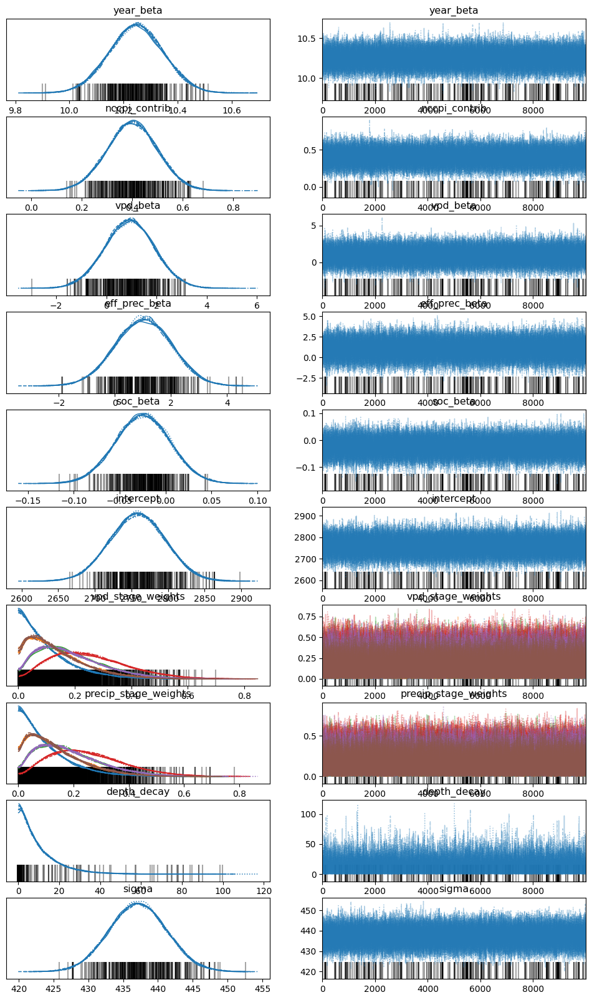

In [346]:
with hierarchical_model:
    idata = pm.sample(10000, chains=8, random_seed=42, progressbar=True)

az.plot_trace(idata)
plt.show()

In [347]:
testfeatures = pd.read_csv(os.path.join(os.getcwd(),'peanut_inference_2023.csv'))
Geospatial_dB = pd.read_csv(os.path.join(os.getcwd(),"final_dataset","Value1_Features.csv"))
# Merge Function
def merge(Cropset):
    Cropset["Name"] = Cropset["Name"].str.title()
    Geospatial_dB["COUNTY"] = Geospatial_dB["COUNTY"].str.title()
    Cropset = Cropset.rename(columns={'Name':'COUNTY'}, inplace=False)
    final = Cropset.merge(Geospatial_dB,on="COUNTY")
    return final
testfeatures = merge(testfeatures)

In [348]:
# === RESPONSE VARIABLE ===
tyield_array = np.zeros(len(testfeatures))
print(f"✅ Yield: {tyield_array.shape}")

# === YEAR DATA ===
tyear_array = testfeatures["Year"].values
# Create scaled year (starting from 1)
tscaledyear = year_array - year_array.min() 
print(f"✅ Year: {tyear_array.shape}, scaled: {scaledyear.min()}-{scaledyear.max()}")

# Corn Index
tnccpi = testfeatures["avg_nccpi3all"].values

# Soil Organic Carbon by depth  
tsoc_cols = ['avg_soc0_5', 'avg_soc5_20', 'avg_soc20_50', 'avg_soc50_100', 'avg_soc100_150', 'avg_soc150_999']
tsoc_array = testfeatures[tsoc_cols].fillna(testfeatures[tsoc_cols].median()).values

# === SEASONAL CLIMATE VARIABLES ===
order = ["VE","VEG","PEG","POD_SET","SEED_FILL","MATURITY"]

# Function to extract seasonal data
def extract_seasonal_data(var_name):
    """Extract seasonal data for a given variable."""
    vorder = [var_name + "_" + pos for pos in order]
    available_cols = [col for col in vorder if col in testfeatures.columns]
    if available_cols:
        data = testfeatures[available_cols].fillna(testfeatures[available_cols].median()).values
        print(f"✅ {var_name}: {data.shape} ({len(available_cols)} stages)")
        return data, available_cols
    else:
        print(f"❌ {var_name}: No columns found")
        return None, []

# Extract all seasonal variables
tseasonal_data = {}

vpd_mean_data, vpd_mean_cols = extract_seasonal_data("VPDmean_kPa")
if vpd_mean_data is not None: tseasonal_data["VPDmean_kPa"] = vpd_mean_data

eff_prec_data, eff_prec_cols = extract_seasonal_data("EffPrecRatio_idx")
if eff_prec_data is not None: tseasonal_data["EffPrecRatio_idx"] = eff_prec_data

✅ Yield: (100,)
✅ Year: (100,), scaled: 0-39
✅ VPDmean_kPa: (100, 6) (6 stages)
✅ EffPrecRatio_idx: (100, 6) (6 stages)


Sampling: [yield]


🔮 Making predictions on test data...
✅ Arrays replaced with test data
   Test observations: 100
   Test years: 0-39


✅ Predictions generated!
   Mean prediction: 2891.5 ± 437.6
   Prediction range: 2692.0 - 3145.0
✅ Original arrays restored


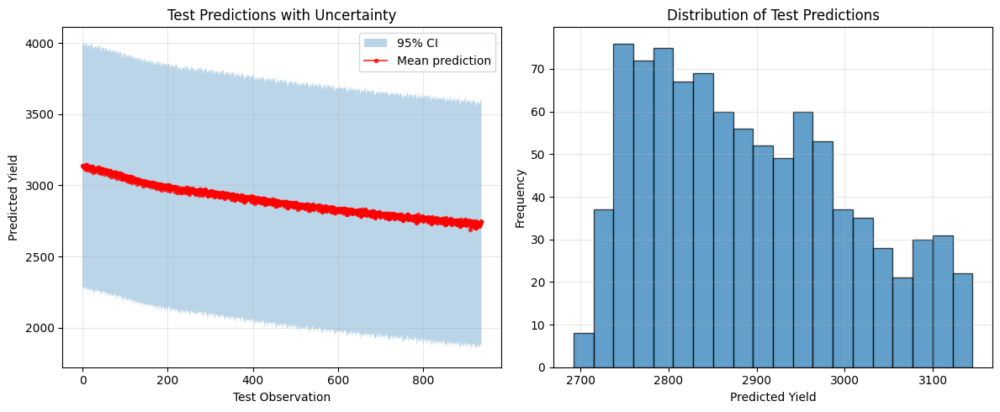

In [349]:
# === PREDICT ON TEST DATA (Direct Array Replacement) ===
print("🔮 Making predictions on test data...")

# Backup original arrays
yield_array_backup = yield_array.copy()
scaledyear_backup = scaledyear.copy() 
nccpi_backup = nccpi.copy()
soc_array_backup = soc_array.copy()
seasonal_data_backup = seasonal_data.copy()

# Replace with test data
yield_array = tyield_array
scaledyear = tscaledyear
nccpi = tnccpi
soc_array = tsoc_array
seasonal_data["VPDmean_kPa"] = tseasonal_data["VPDmean_kPa"]
seasonal_data["EffPrecRatio_idx"] = tseasonal_data["EffPrecRatio_idx"]

print("✅ Arrays replaced with test data")
print(f"   Test observations: {len(tyield_array)}")
print(f"   Test years: {tscaledyear.min()}-{tscaledyear.max()}")

# Make predictions using the hierarchical model with test data
with hierarchical_model:
    test_predictions = pm.sample_posterior_predictive(
        idata,                    # Your fitted parameters
        predictions=True,         # Generate predictions
        random_seed=42,
        progressbar=True
    )

# Extract prediction results
pred_samples = test_predictions.predictions["yield"].values  # (chains, draws, n_test_obs)
pred_mean = pred_samples.mean(axis=(0, 1))
pred_std = pred_samples.std(axis=(0, 1))
pred_lower = np.percentile(pred_samples, 2.5, axis=(0, 1))
pred_upper = np.percentile(pred_samples, 97.5, axis=(0, 1))

print(f"✅ Predictions generated!")
print(f"   Mean prediction: {pred_mean.mean():.1f} ± {pred_std.mean():.1f}")
print(f"   Prediction range: {pred_mean.min():.1f} - {pred_mean.max():.1f}")

# Restore original arrays
yield_array = yield_array_backup
scaledyear = scaledyear_backup
nccpi = nccpi_backup
soc_array = soc_array_backup
seasonal_data = seasonal_data_backup

print("✅ Original arrays restored")

# Visualize predictions
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.fill_between(range(len(pred_mean)), pred_lower, pred_upper, alpha=0.3, label='95% CI')
plt.plot(pred_mean, 'ro-', alpha=0.7, markersize=3, label='Mean prediction')
plt.xlabel('Test Observation')
plt.ylabel('Predicted Yield')
plt.title('Test Predictions with Uncertainty')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.hist(pred_mean, bins=20, alpha=0.7, edgecolor='black')
plt.xlabel('Predicted Yield')
plt.ylabel('Frequency')
plt.title('Distribution of Test Predictions')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
    